In [1]:
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import pyplot as plt
import pickle
import PIL as pillow
from tqdm import tqdm
import numpy as np
import seaborn as sns
import scipy.stats as spst
import scipy
from statannotations.Annotator import Annotator
import time
from pathlib import Path
import argparse
from matplotlib.gridspec import GridSpec
from matplotlib.transforms import Affine2D
import baisic_plot_fuctnions_and_features as bpf
import warnings
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
bpf.set_plot_properties()

vlinec = "#C35817"

learner_cell = "2022_12_21_cell_1" 
non_learner_cell = "2023_01_10_cell_1"
time_to_plot = 0.250 # in s 

time_points = ["pre","0", "10", "20","30" ]
selected_time_points = ['post_0', 'post_1', 'post_2', 'post_3','pre']
                        #'post_4','post_5']
cell_dist=[8,10,4]
cell_dist_key = ["leaners","non\nlearners","cells\nnot\ncosidered"]

In [388]:
all_cells_all_trails_extracted_featrues = pd.read_pickle("/Users/anzalks/Documents/pattern_learning_paper/plotting_scripts/python_scripts_paper_ready/analysis_scripts/pickle_files_from_analysis/pd_all_cells_all_trials.pickle")

In [17]:
sc_data_dict = pd.read_pickle("/Users/anzalks/Documents/pattern_learning_paper/plotting_scripts/python_scripts_paper_ready/analysis_scripts/pickle_files_from_analysis/all_cells_fnorm_classifeied_dict.pickle")

In [183]:
curvfit_data = pd.read_hdf("/Users/anzalks/Documents/pattern_learning_paper/plotting_scripts/python_scripts_paper_ready/analysis_scripts/pickle_files_from_analysis/curvefit_results.h5")
curvfit_data =curvfit_data[~curvfit_data["cell_ID"].isin(["2022_12_12_cell_5"])]

In [55]:
def subtract_baseline(trace,sampling_rate, bl_period_in_ms):
    bl_period = bl_period_in_ms/1000
    bl_duration = int(sampling_rate*bl_period)
    bl = np.mean(trace[:bl_duration])
    bl_trace = trace-bl
    return bl_trace

In [193]:
crv_df =curvfit_data.copy()
list_learners = sc_data_dict["ap_cells"]["cell_ID"].unique()
list_non_learners = sc_data_dict["an_cells"]["cell_ID"].unique()
def categorize_cell_id(cell_id):
    if cell_id in list_learners:
        return 'learners'
    elif cell_id in list_non_learners:
        return 'non_learners'
    else:
        return cell_id

In [194]:
crv_df['cell_ID'] = crv_df['cell_ID'].apply(categorize_cell_id)

In [201]:
crv_df = crv_df[(crv_df["pre_post_status"].isin(["pre","post_3"]))&(crv_df["cell_ID"].isin(["learners","non_learners"]))]

In [202]:
def plot_pca_comparison(df):
    # Select numeric columns for PCA
    numeric_cols = ['Epk', 'Etau', 'Ipk', 'Itau', 'delay', 'initDelay']
    X = df[numeric_cols]

    # Standardize the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Perform PCA
    pca = PCA(n_components=4)  # Choose the number of components you want to visualize
    X_pca = pca.fit_transform(X_scaled)

    # Create a DataFrame for PCA results
    pca_df = pd.DataFrame(data=X_pca, columns=[f'PC{i+1}' for i in range(X_pca.shape[1])])
    pca_df = pd.concat([df[['cell_ID', 'pre_post_status']], pca_df], axis=1)

    # Visualize the results using pair plot
    sns.pairplot(pca_df, hue='cell_ID', diag_kind='kde', markers=['o', 's'])
    plt.suptitle(f'Pair Plot of PCA Results', y=1.02)
    plt.show()

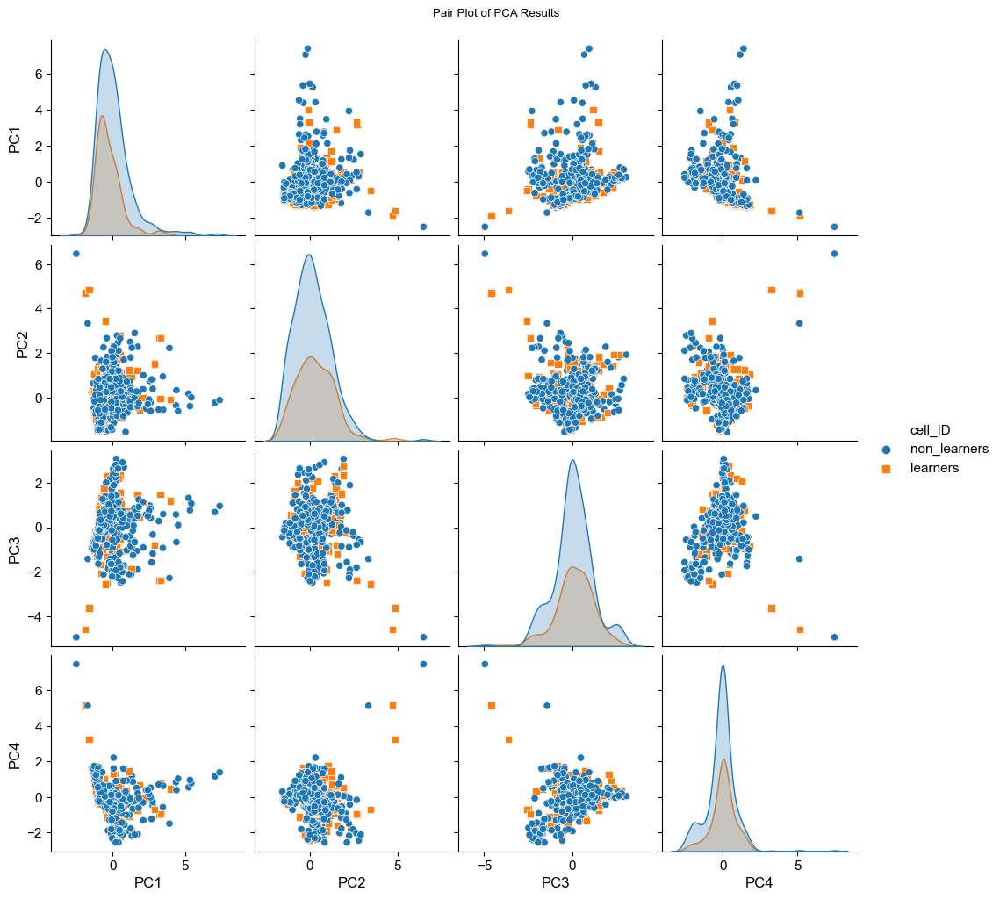

In [203]:
# Load your DataFrame (assuming you have it in a CSV file)
#lrn = curvfit_data[(curvfit_data["pre_post_status"].isin(["pre","post_3"]))&(curvfit_data["cell_ID"].isin(learners))]
#nlrn = curvfit_data[(curvfit_data["pre_post_status"].isin(["pre","post_3"]))&(curvfit_data["cell_ID"].isin(non_learners))]
plot_pca_comparison(crv_df)

In [112]:
def plot_curve_fit_feature(curvfit_data,sc_data_dict, feature_to_plot):
    fig,axs_all=plt.subplots(1,3)
    data_min,data_max = curvfit_data[feature_to_plot].min(),curvfit_data[feature_to_plot].max()
    
    cell_grp = curvfit_data.groupby(by="cell_ID")
    learners = sc_data_dict["ap_cells"]["cell_ID"].unique()
    non_learners = sc_data_dict["an_cells"]["cell_ID"].unique()
    time_points = ["pre","post_3"]
    for cell,cell_data in cell_grp:
        if cell =="2022_12_12_cell_5":
            continue
        if cell in learners:
            color='b'
        elif cell in non_learners:
            color='r'
        else:
            continue
        cell_data =cell_data[cell_data["pre_post_status"].isin(time_points)]
        #print(f"cell_data:{cell_data}")
        trial_grp = cell_data.groupby(by="trial_no")
        for trial,trial_data in trial_grp:
            frame_grp = trial_data.groupby(by="frame_id")
            for frame, frame_data in frame_grp:
                if "pattern" not in frame:
                    continue
                axs=axs_all[int(frame.split('_')[-1])]
                pre_data = frame_data[frame_data["pre_post_status"]=="pre"][feature_to_plot].values
                post_data = frame_data[frame_data["pre_post_status"]=="post_3"][feature_to_plot].values
                #print(pre_data,post_data)
                axs.set_title(frame)
                axs.scatter(pre_data,post_data, color=color)
                axs.set_ylim(data_min,data_max)
                axs.set_xlim(data_min,data_max)
                axs.set_ylabel("post")
                axs.set_xlabel("pre")
                axs.set_aspect("equal")
    plt.suptitle(f"feature_to_plot: {feature_to_plot}")
    plt.tight_layout()
    plt.show()

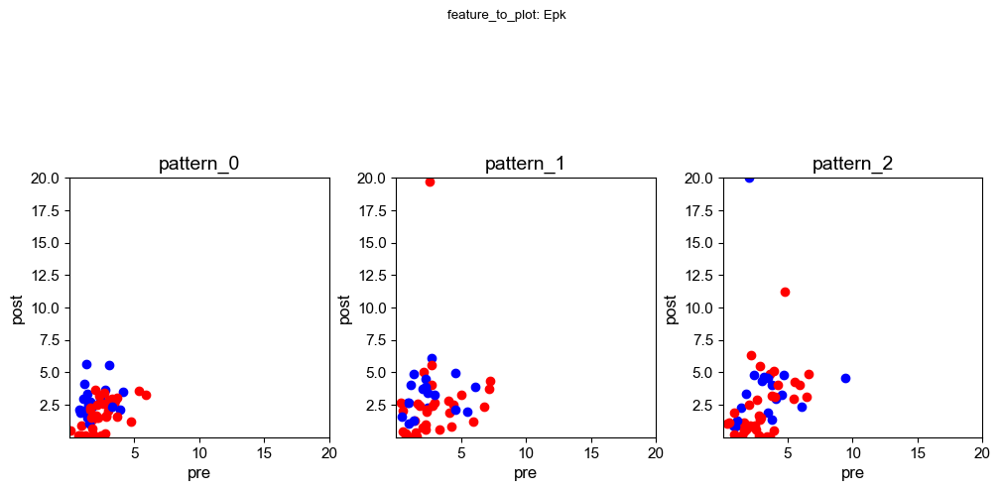

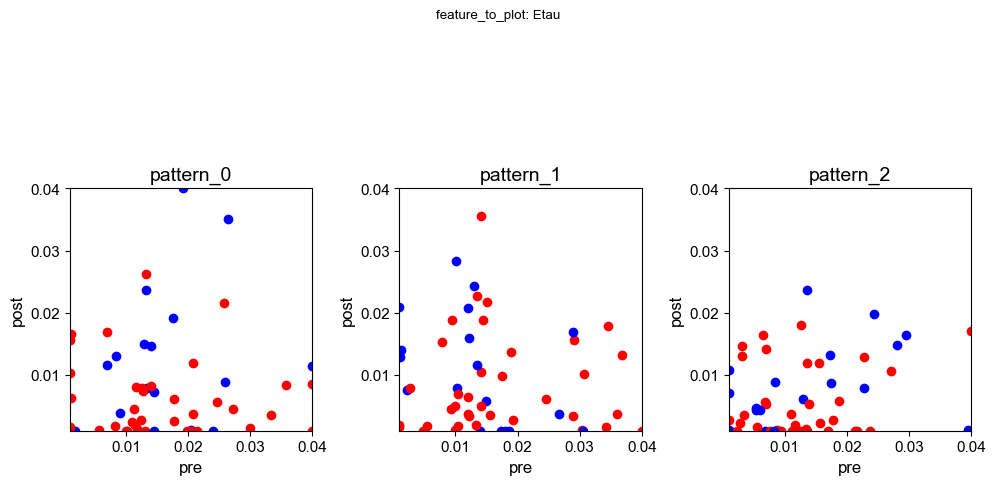

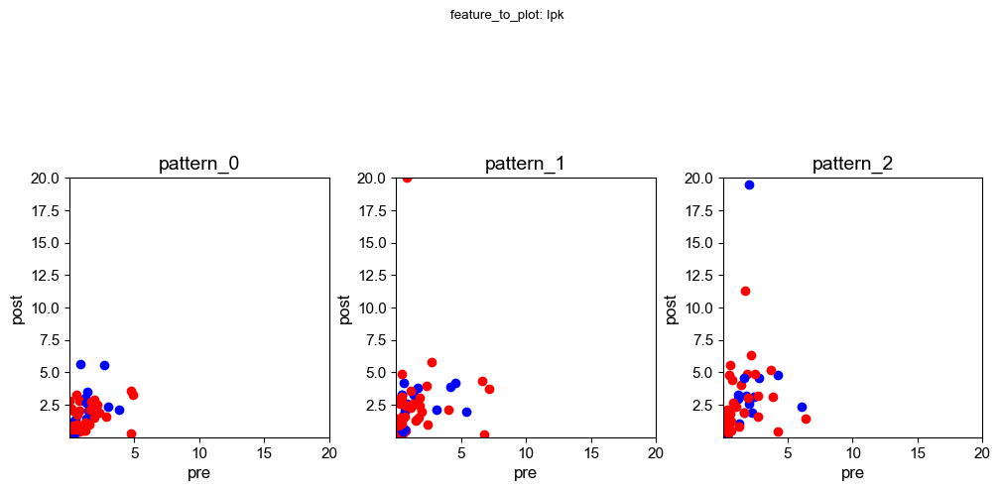

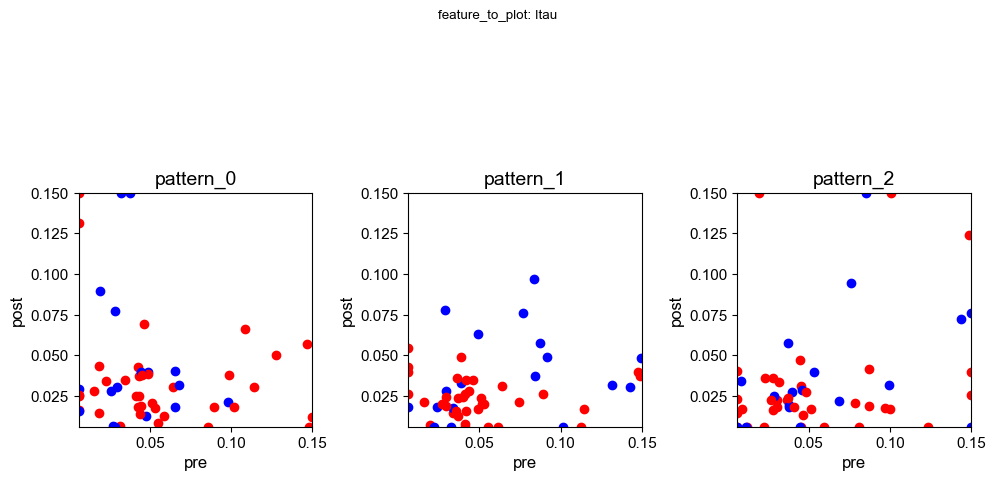

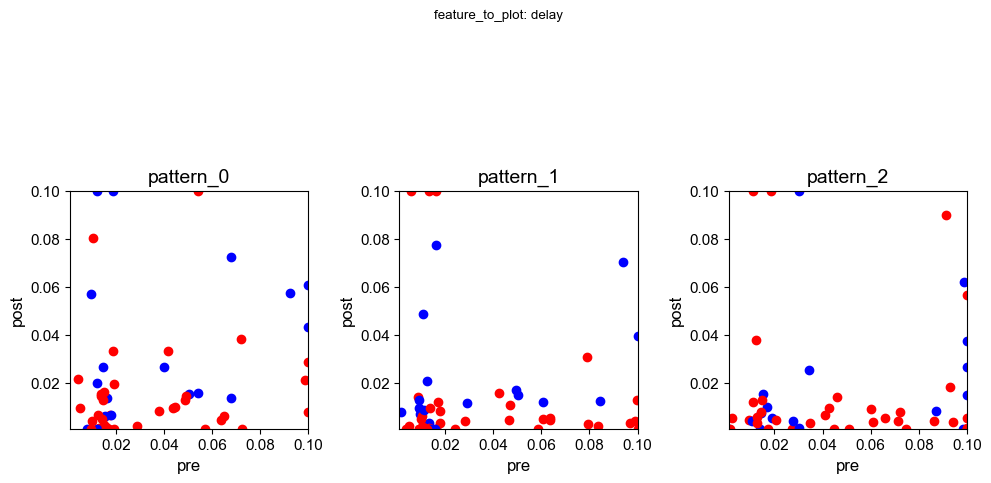

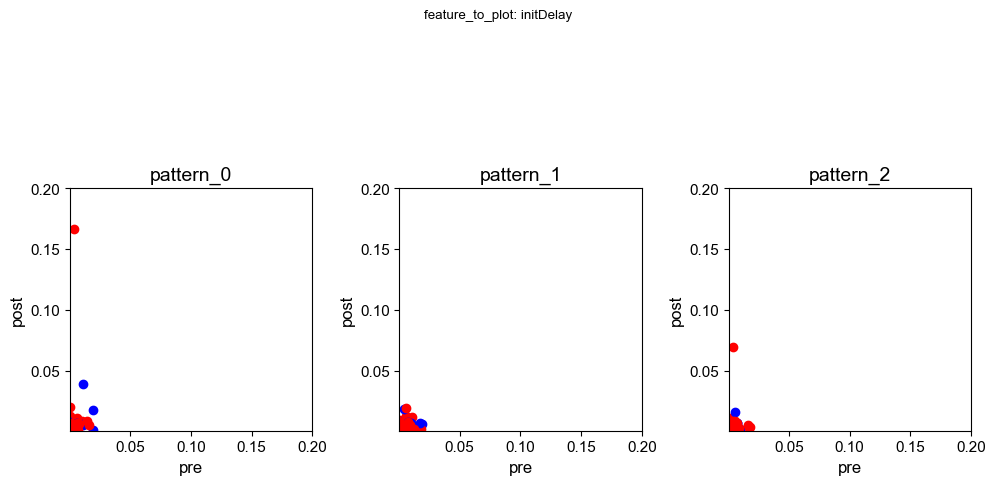

In [113]:
features =["Epk","Etau","Ipk","Itau","delay","initDelay"]
for feature in features:
    plot_curve_fit_feature(curvfit_data,sc_data_dict, feature)

In [121]:
time_points = ["pre","0", "10", "20","30" ]
def norm_values(cell_list,val_to_plot):
    cell_list = cell_list.copy()
    #print(f"cell list inside func : {cell_list}")
    cell_grp=cell_list.groupby(by="cell_ID")
    for c, cell in cell_grp:
        pat_grp = cell.groupby(by="frame_id")
        for p,pat in pat_grp:
            #print(f"c:{c}, p:{p}")
            pre_val= cell[(cell["cell_ID"]==c)&(cell["frame_id"]==p)&(cell["pre_post_status"]=="pre")][val_to_plot].values
            pp_grp = pat.groupby(by="pre_post_status")
            for pr, pp in pp_grp:
                norm_val = cell[(cell["cell_ID"]==c)&(cell["frame_id"]==p)&(cell["pre_post_status"]==pr)][val_to_plot].values
                norm_val = (norm_val/pre_val)*100
                cell_list.loc[(cell_list["cell_ID"]==c)&(cell_list["frame_id"]==p)&(cell_list["pre_post_status"]==pr),val_to_plot]=norm_val
    return cell_list
   

def norm_values_all_trials(cell_list, val_to_plot):
    cell_list = cell_list.copy()
    # Group by 'cell_ID'
    cell_grp = cell_list.groupby(by="cell_ID")
    for c, cell in cell_grp:
        pat_grp = cell.groupby(by="frame_id")
        for p, pat in pat_grp:
            trial_grp = pat.groupby(by="trial_no")
            for trial, trial_data in trial_grp:
                pre_val = trial_data[trial_data["pre_post_status"] == "pre"][val_to_plot].values
                if len(pre_val) == 0:
                    continue
                else:
                    pre_val = pre_val[0]  # Assuming there is only one 'pre' value per group
                    pp_grp = trial_data.groupby(by="pre_post_status")
                    for pr, pp in pp_grp:
                        norm_val = pp[val_to_plot].values
                        norm_val = (norm_val / pre_val) * 100
                        # Using vectorized operations for efficiency
                        mask_cell_ID = cell_list["cell_ID"] == c
                        mask_frame_id = cell_list["frame_id"] == p
                        mask_pre_post_status = cell_list["pre_post_status"] == pr
                        mask_trial_no = cell_list["trial_no"] == trial
                        combined_mask = mask_cell_ID & mask_frame_id & mask_pre_post_status & mask_trial_no
                        cell_list.loc[combined_mask, val_to_plot] = norm_val
    return cell_list

def plot_cell_dist(catcell_dist,val_to_plot,fig,axs,pattern_number,y_lim,
                   x_label, cell_type,plt_color,resp_color):
    pat_num=int(pattern_number.split("_")[-1])
    num_cells= len(catcell_dist["cell_ID"].unique())
    pfd = catcell_dist.groupby(by="frame_id")
    for c, pat in pfd:
        if c != pattern_number:
            continue
        else:
            order = np.array(('pre','post_0','post_1','post_2','post_3'),dtype=object)
            g=sns.stripplot(data=pat, x="pre_post_status",y=f"{val_to_plot}",
                            order=order,ax=axs,color=resp_color,
                            alpha=0.6,size=8, label='cell response')#alpha=0.8,
            sns.pointplot(data=pat, x="pre_post_status",y=f"{val_to_plot}",
                          errorbar="se",order=order,capsize=0.08,ax=axs,
                          color=plt_color, linestyles='dotted',scale = 0.8,
                         label="average cell response")
            g.set_title(None)
            #"""
            pvalList = []
            anotp_list = []
            for i in order[1:]:
                posti ="post{i}"
                #non parametric, paired and small sample size, hence used Wilcoxon signed-rank test
                #Wilcoxon signed-rank test
                posti= spst.wilcoxon(pat[pat["pre_post_status"]=='pre'][f"{val_to_plot}"],pat[pat["pre_post_status"]==i][f"{val_to_plot}"],
                                     zero_method="wilcox", correction=True)
                pvalList.append(posti.pvalue)
                anotp_list.append(("pre",i))
            annotator = Annotator(axs,anotp_list,data=pat, 
                                  x="pre_post_status",
                                  y=f"{val_to_plot}",
                                  order=order,
                                 fontsize=8)
            #annotator = Annotator(axs[pat_num],[("pre","post_0"),("pre","post_1"),("pre","post_2"),("pre","post_3")],data=cell, x="pre_post_status",y=f"{col_pl}")
            annotator.set_custom_annotations([bpf.convert_pvalue_to_asterisks(a) for a in pvalList])
            annotator.annotate()
            #"""
            axs.axhline(100, ls=':',color="k", alpha=0.4)
            if pat_num==0:
                sns.despine(fig=None, ax=axs, top=True, right=True, 
                            left=False, bottom=False, offset=None, trim=False)
                axs.set_ylabel("% change in\nEPSP amplitude")
                axs.set_xlabel(None)
                #axs[pat_num].set_yticks([])
            elif pat_num==1:
                sns.despine(fig=None, ax=axs, top=True, right=True, 
                            left=False, bottom=False, offset=None, trim=False)
                axs.set_ylabel(None)
                axs.set_yticklabels([])
                if cell_type=="dep_cells":
                    axs.set_xlabel(x_label)
                else:
                    axs.set_xlabel(None)
            elif pat_num==2:
                sns.despine(fig=None, ax=axs, top=True, right=True, 
                            left=False, bottom=False, offset=None, trim=False)
                axs.set_xlabel(None)
                axs.set_ylabel(None)
                axs.set_yticklabels([])
            else:
                pass 
            g.set(ylim=y_lim)
            g.set_xticklabels(time_points,rotation=0)
            g.legend_.remove()
            if cell_type!="dep_cells":
                axs.set_xticklabels([])
            else:
                pass 


    ax_pos = axs.get_position()
    #new_ax_pos = [ax_pos.x0-0.02, ax_pos.y0, ax_pos.width,
    #              ax_pos.height]
    #axs.set_position(new_ax_pos)

def plot_cell_category_classified_EPSP_features(esp_feat_cells_df,val_to_plot,
                                                fig,axs1,axs2,axs3,cell_type):
    cell_df= norm_values(esp_feat_cells_df,val_to_plot)
    if cell_type=="pot_cells":
        strp_color = bpf.CB_color_cycle[0]
        line_color = bpf.CB_color_cycle[5]
        y_lim = (-25,800)
        x_label = None
    elif cell_type=="dep_cells":
        strp_color = bpf.CB_color_cycle[1]
        line_color = bpf.CB_color_cycle[5]
        y_lim = (-200,500)
        x_label = "time points (mins)"
    else:
        print("uncagerised cell")
    plot_cell_dist(cell_df,val_to_plot,fig,axs1,"pattern_0",
                   y_lim,x_label,cell_type,line_color,strp_color
                  )
    plot_cell_dist(cell_df,val_to_plot,fig,axs2,"pattern_1",
                   y_lim,x_label,cell_type,line_color,strp_color
                  )
    plot_cell_dist(cell_df,val_to_plot,fig,axs3,"pattern_2",
                   y_lim,x_label,cell_type,line_color,strp_color
                  )
    plt.suptitle(f"val_to_plot:{val_to_plot}")

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: *** p= 0.0
pre vs. post_1: * p= 0.024
pre vs. post_2: * p= 0.021
pre vs. post_3: ** p= 0.002
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: *** p= 0.0
pre vs. post_1: ** p= 0.002
pre vs. post_2: ** p= 0.009
pre vs. post_3: ** p= 0.008
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns


/Users/anzalks/miniconda3/envs/lab_env/lib/python3.10/site-packages/scipy/stats/_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/Users/anzalks/miniconda3/envs/lab_env/lib/python3.10/site-packages/scipy/stats/_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns


/Users/anzalks/miniconda3/envs/lab_env/lib/python3.10/site-packages/scipy/stats/_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ** p= 0.009
pre vs. post_1: * p= 0.03
pre vs. post_2: * p= 0.027
pre vs. post_3: *** p= 0.0
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: * p= 0.014
pre vs. post_2: ns
pre vs. post_3: * p= 0.01
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

p

/Users/anzalks/miniconda3/envs/lab_env/lib/python3.10/site-packages/scipy/stats/_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns


/Users/anzalks/miniconda3/envs/lab_env/lib/python3.10/site-packages/scipy/stats/_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns


/Users/anzalks/miniconda3/envs/lab_env/lib/python3.10/site-packages/scipy/stats/_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: * p= 0.014
pre vs. post_2: ns
pre vs. post_3: ** p= 0.006
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns


/Users/anzalks/miniconda3/envs/lab_env/lib/python3.10/site-packages/scipy/stats/_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/Users/anzalks/miniconda3/envs/lab_env/lib/python3.10/site-packages/scipy/stats/_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns


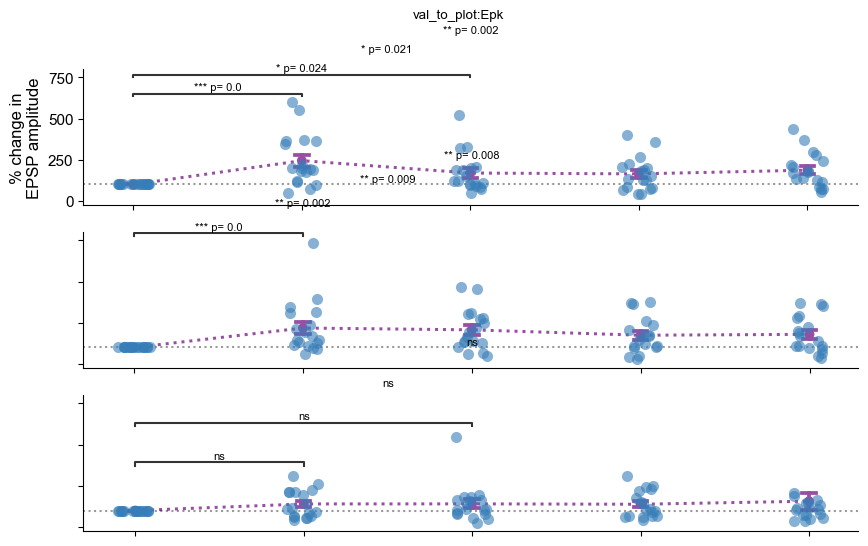

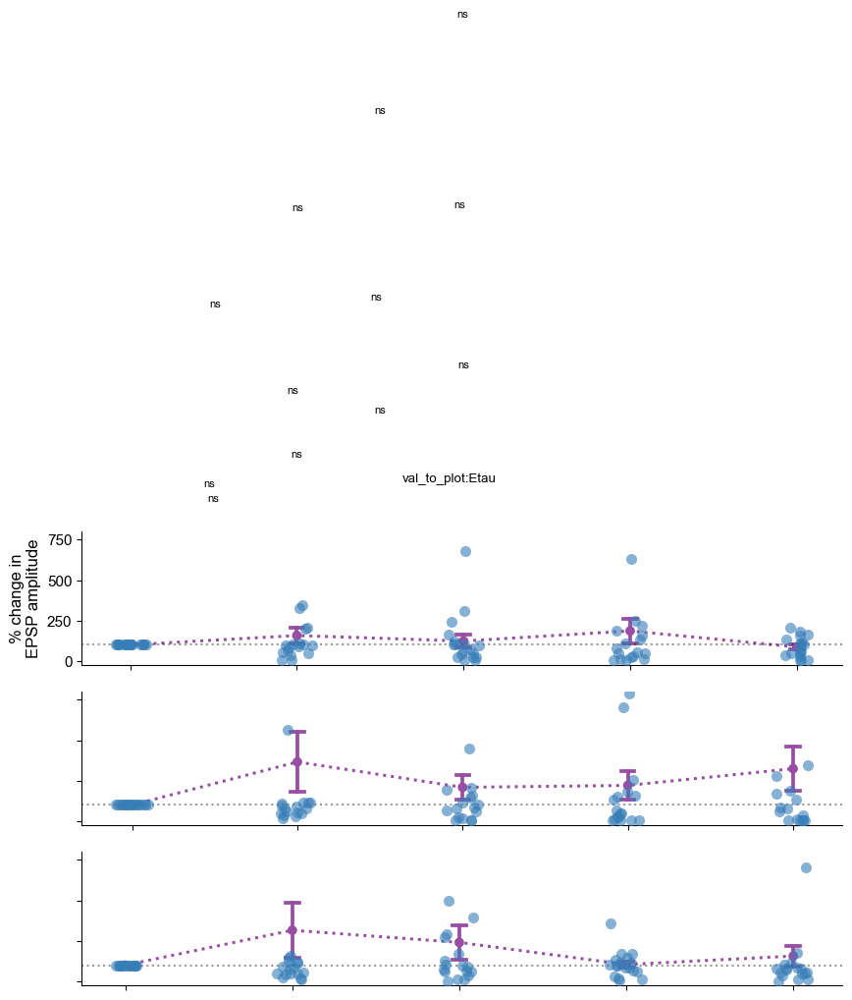

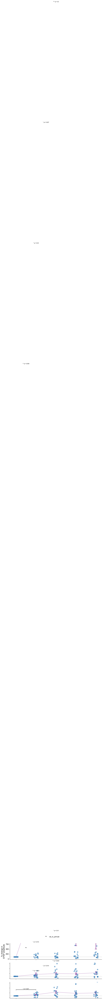

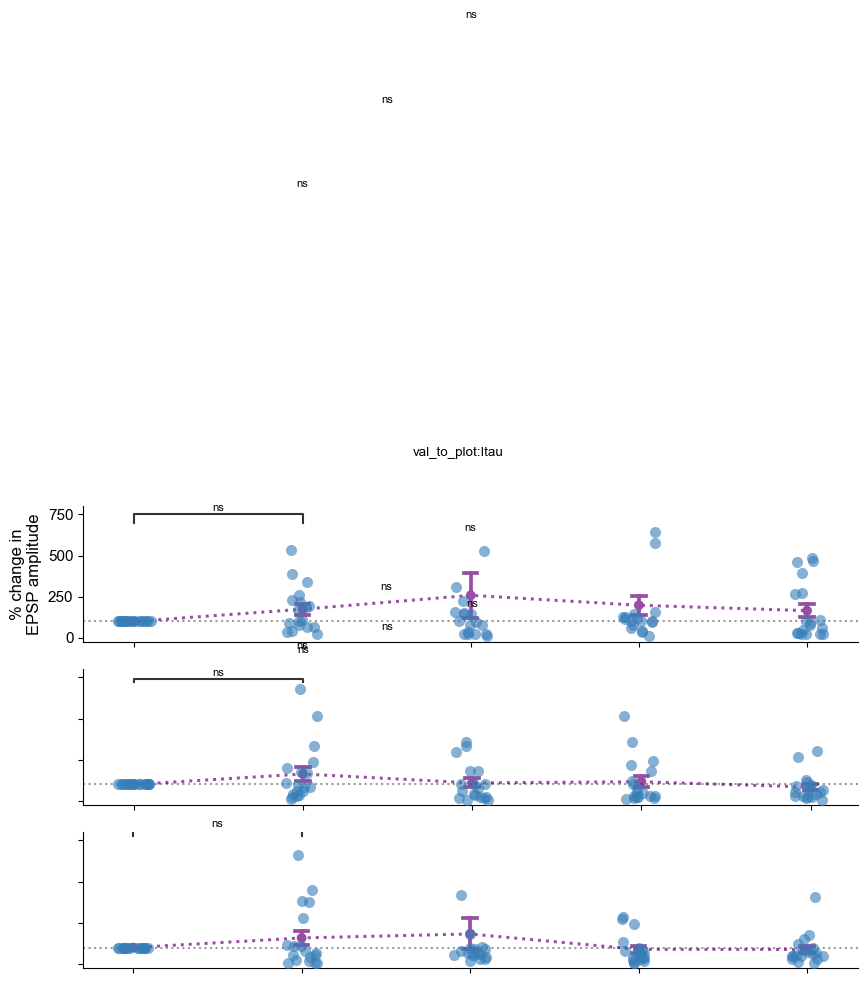

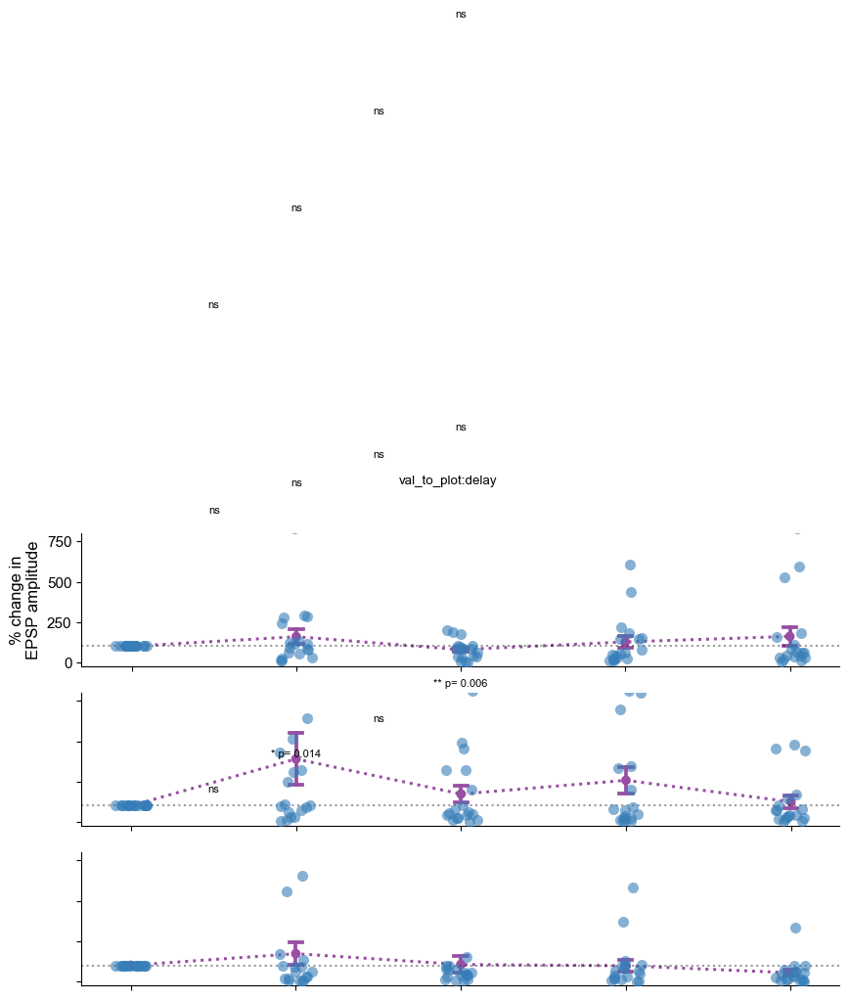

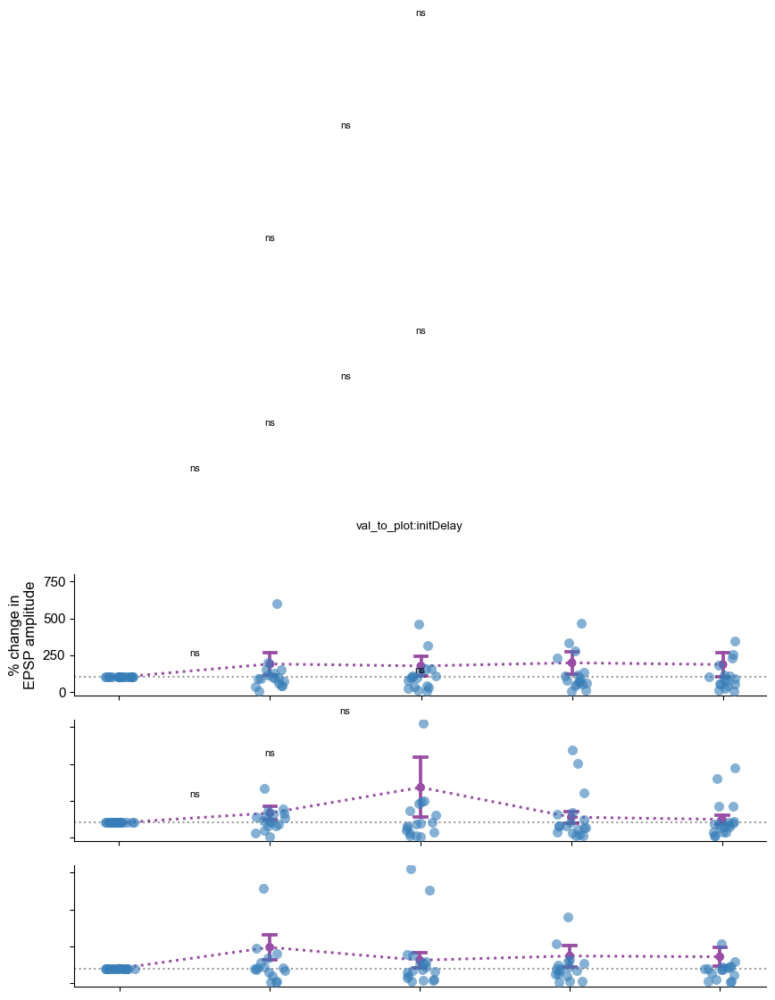

In [122]:
learners = sc_data_dict["ap_cells"]["cell_ID"].unique()
non_learners = sc_data_dict["an_cells"]["cell_ID"].unique()
curv_dat = curvfit_data[curvfit_data["cell_ID"].isin(learners)].reset_index(drop=True)
for feature in features:
    fig, axs=plt.subplots(3,1)
    plot_cell_category_classified_EPSP_features(curv_dat,feature,fig,axs[0],axs[1],axs[2],"pot_cells")

In [119]:
from math import pi

def norm_values(cell_list, val_to_plot):
    cell_list = cell_list.copy()
    cell_grp = cell_list.groupby(by="cell_ID")
    for c, cell in cell_grp:
        pat_grp = cell.groupby(by="frame_id")
        for p, pat in pat_grp:
            trial_grp = pat.groupby(by="trial_no")
            for trial, trial_data in trial_grp:
                pre_val = trial_data[trial_data["pre_post_status"] == "pre"][val_to_plot].values
                if len(pre_val) == 0:
                    continue
                else:
                    pre_val = pre_val[0]  # Assuming there is only one 'pre' value per group
                    pp_grp = trial_data.groupby(by="pre_post_status")
                    for pr, pp in pp_grp:
                        norm_val = pp[val_to_plot].values
                        norm_val = (norm_val / pre_val) * 100
                        # Using vectorized operations for efficiency
                        mask_cell_ID = cell_list["cell_ID"] == c
                        mask_frame_id = cell_list["frame_id"] == p
                        mask_pre_post_status = cell_list["pre_post_status"] == pr
                        mask_trial_no = cell_list["trial_no"] == trial
                        combined_mask = mask_cell_ID & mask_frame_id & mask_pre_post_status & mask_trial_no
                        cell_list.loc[combined_mask, val_to_plot] = norm_val
    return cell_list

def create_radar_plot(data, val_to_plot, cell_type, ax):
    categories = ["pre", "0", "10", "20", "30"]
    num_vars = len(categories)

    # Create the angle for each category
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    angles += angles[:1]  # Complete the loop

    data = data.groupby("pre_post_status")[val_to_plot].mean().reindex(categories).values
    data = np.append(data, data[:1])  # Complete the loop

    ax.plot(angles, data, linewidth=1, linestyle='solid', label=cell_type)
    ax.fill(angles, data, alpha=0.25)

    ax.set_ylim(0, 200)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories)

    ax.set_yticklabels([])

def plot_cell_category_classified_EPSP_features(cell_list, val_to_plot, cell_type):
    cell_df = norm_values(cell_list, val_to_plot)
    categories = cell_df["pre_post_status"].unique()

    fig, axs = plt.subplots(3, 1, subplot_kw=dict(polar=True), figsize=(8, 12))

    if cell_type == "pot_cells":
        color = "blue"
    elif cell_type == "dep_cells":
        color = "red"
    else:
        print("uncategorized cell")
        return

    for i, ax in enumerate(axs):
        pattern_number = f"pattern_{i}"
        pat_data = cell_df[cell_df["frame_id"] == pattern_number]
        create_radar_plot(pat_data, val_to_plot, cell_type, ax)

    plt.suptitle(f"{val_to_plot} Radar Plot for {cell_type}")
    plt.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))
    plt.show()


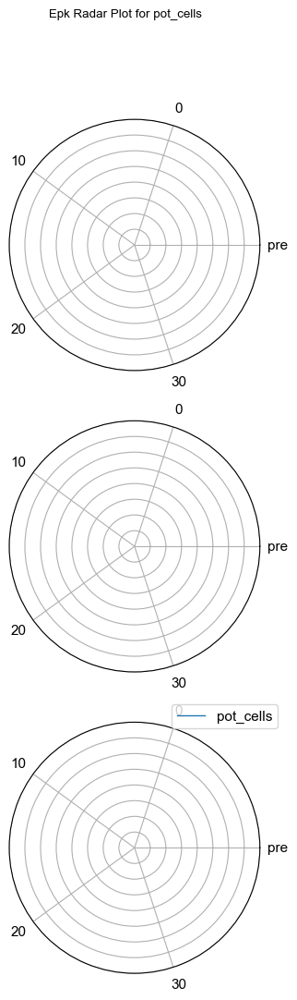

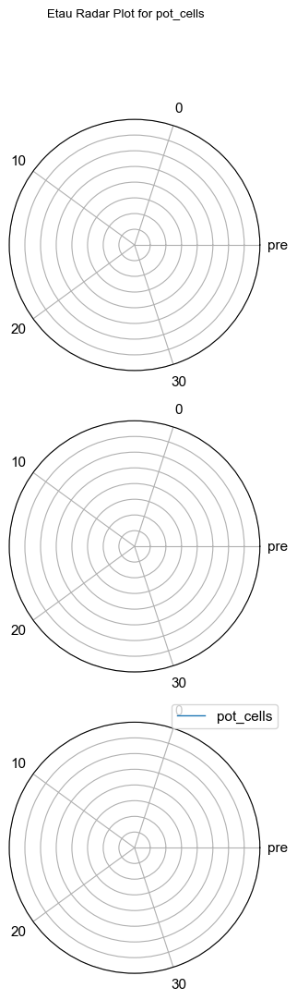

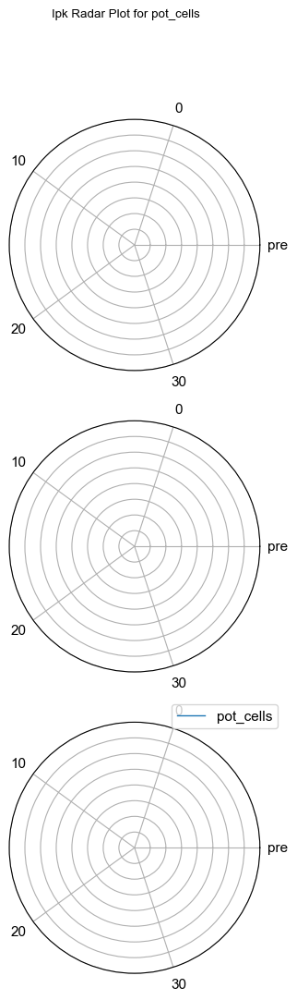

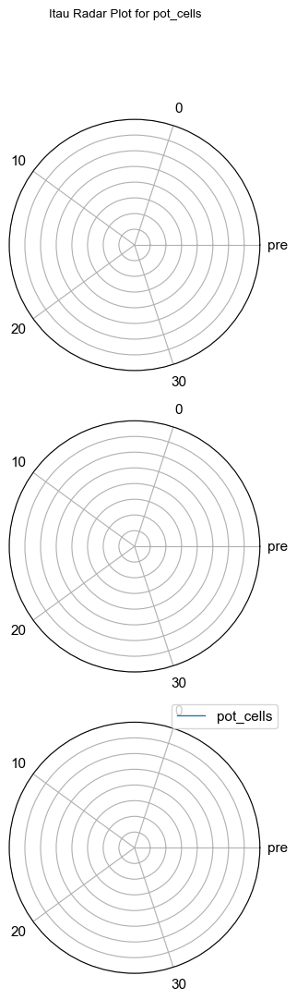

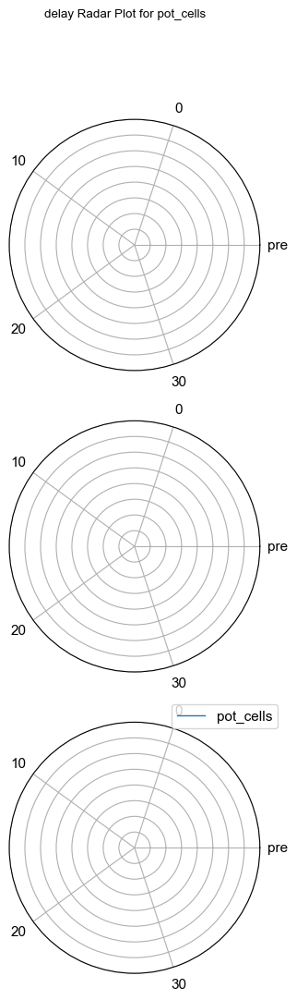

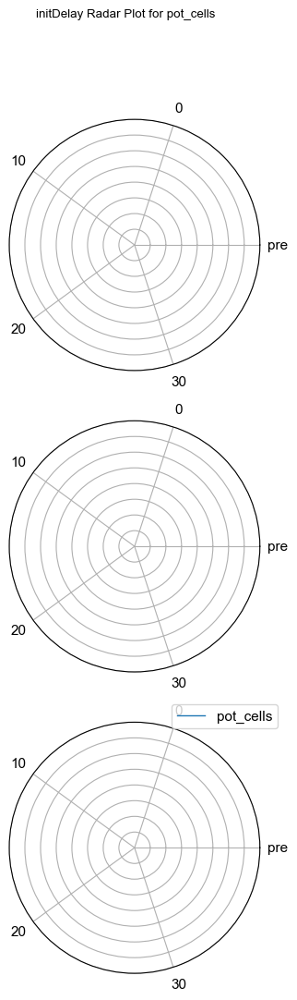

In [120]:
# Example usage with your data
curv_dat = curvfit_data[curvfit_data["cell_ID"].isin(learners)].reset_index(drop=True)
for feature in features:
    plot_cell_category_classified_EPSP_features(curv_dat, feature, "pot_cells")

In [466]:
all_cells_all_trails_extracted_featrues.head()#["frame_status"].unique()

,cell_ID,frame_status,pre_post_status,frame_id,trial_no,min_trace,max_trace,abs_area,pos_area,neg_area,...,max_field_t,min_field_t,trace,field,ttl,mean_rmp,mepsp_amp,mepsp_time,num_mepsp,freq_mepsp
0,2022_12_12_cell_5,pattern,post_0,pattern_0,0,-1.442230,12.818634,237031840.0,158334032.0,78697808.0,...,0.013151,0.00255,"[-0.004852295, 0.0073547363, -0.007904053, -0....","[0.040245056, 0.058555603, 0.07396698, 0.08419...","[0.018310547, 0.018615723, 0.016479492, 1.5722...",-63.685665,0.802338,"[727.559094488681, 937.4617182714784, 1043.413...",6,1.50
0,2022_12_12_cell_5,pattern,post_0,pattern_0,1,-1.769188,15.180275,290316480.0,199386208.0,90930264.0,...,0.022652,0.00215,"[0.01914215, -0.011375427, -0.026634216, -0.02...","[0.064323425, 0.049827576, 0.043876648, 0.0455...","[0.018310547, 0.018615723, 0.016479492, 1.5722...",-63.685665,0.928566,"[350.55438192977414, 2252.178152226903, 3650.8...",3,0.75
0,2022_12_12_cell_5,pattern,post_0,pattern_0,2,-1.707489,16.053741,265094320.0,189985072.0,75109248.0,...,0.010901,0.00230,"[-0.0046081543, -0.0046081543, -0.007659912, 0...","[0.06317139, 0.055847168, 0.03768921, 0.022735...","[0.018310547, 0.018615723, 0.016479492, 1.5722...",-63.685665,1.346303,"[807.8100976262203, 2031.5753946924335, 2287.3...",3,0.75
0,2022_12_12_cell_5,pattern,post_0,pattern_1,0,-1.494659,13.193451,238644880.0,161582928.0,77061928.0,...,0.017502,0.00185,"[-0.023712158, -0.0206604, -0.023712158, -0.02...","[0.09341431, 0.09448242, 0.08425903, 0.0825805...","[0.018005371, 0.017089844, 0.018615723, 1.5701...",-63.685665,1.039171,"[215.85269815872698, 566.707083838548, 710.508...",7,1.75
0,2022_12_12_cell_5,pattern,post_0,pattern_1,1,-1.511871,12.623871,232197312.0,164338464.0,67858832.0,...,0.013301,0.00190,"[-0.06838989, -0.053131104, -0.047027588, -0.0...","[0.06252289, 0.048179626, 0.035362244, 0.05672...","[0.018005371, 0.017089844, 0.018615723, 1.5701...",-63.685665,NaN,[],0,0.00


In [165]:
pre_post_grp = all_cells_all_trails_extracted_featrues.groupby(by="pre_post_status")
mepsp_pre=[]
mepsp_post=[]
for pps,pps_data in pre_post_grp:
    if pps=="pre":
        mepsp_pre.append(pps_data)
    elif pps=="post_3":
        mepsp_post.append(pps_data)
    else:
        pass

In [167]:
mepsp_pre = pd.concat(mepsp_pre)
mepsp_post = pd.concat(mepsp_post)

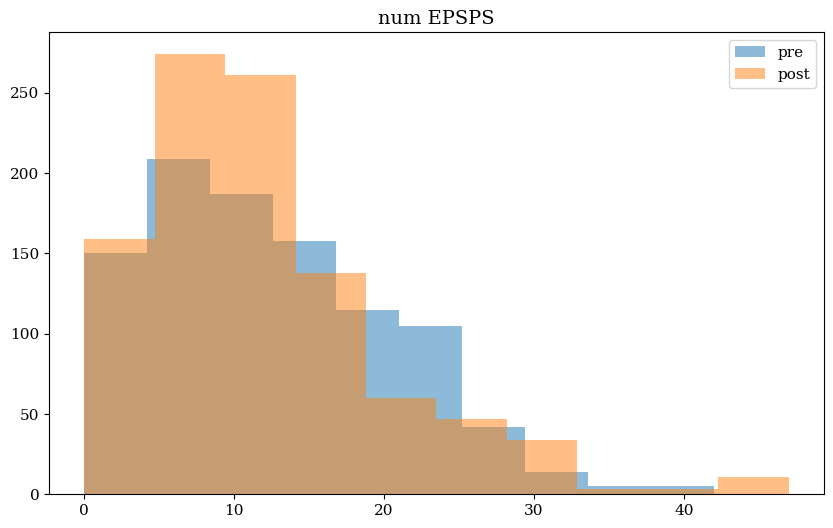

In [389]:
mepsp_pre["num_mepsp"].hist(grid=False,alpha=0.5, label="pre")
mepsp_post["num_mepsp"].hist(grid=False,alpha=0.5, label="post")
plt.title("num EPSPS")
plt.legend()

Text(0.5, 1.0, 'freq EPSPS')

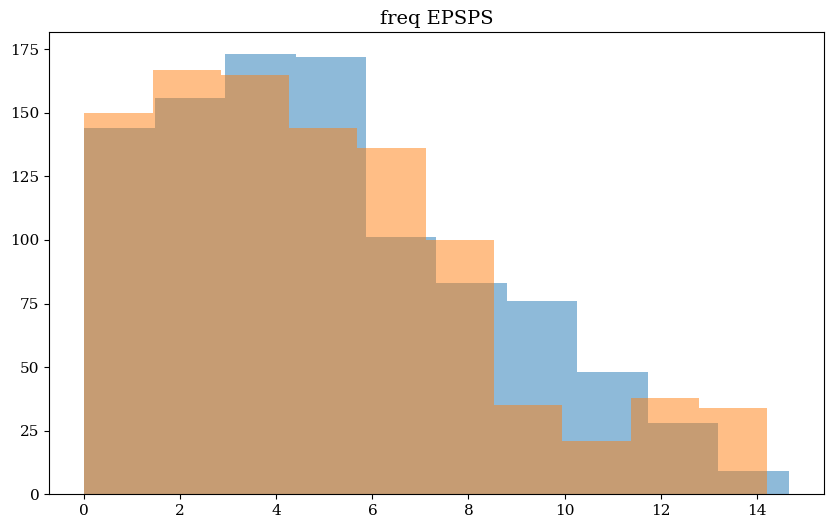

In [387]:
mepsp_pre["freq_mepsp"].hist(grid=False,alpha=0.5, label="pre")
mepsp_post["freq_mepsp"].hist(grid=False,alpha=0.5, label="pre")
plt.title("freq EPSPS")

<Axes: xlabel='pre_post_status', ylabel='freq_mepsp'>

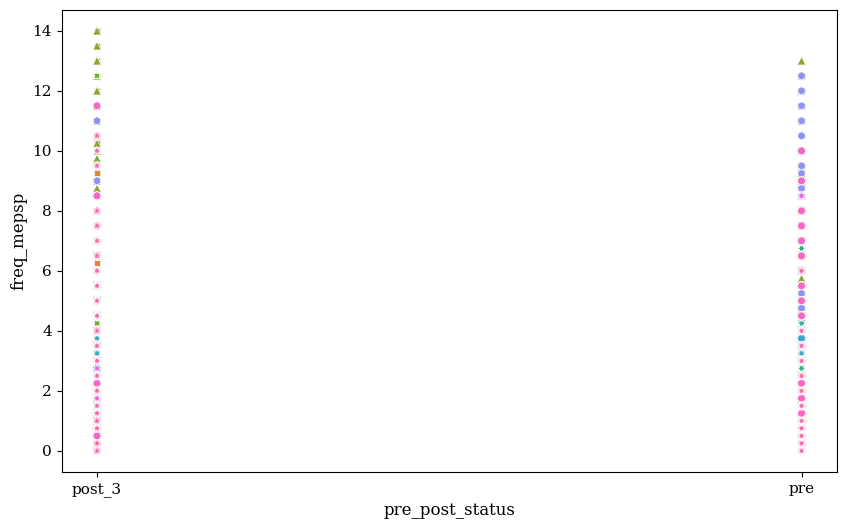

In [390]:
pre_post_dat = all_cells_all_trails_extracted_featrues[all_cells_all_trails_extracted_featrues["pre_post_status"].isin(["pre","post_3"])].reset_index(drop=True)
sns.scatterplot(data=pre_post_dat, x="pre_post_status", y="freq_mepsp", hue="cell_ID",legend=False,style="cell_ID")

(-0.1256011962890625, 5.0)

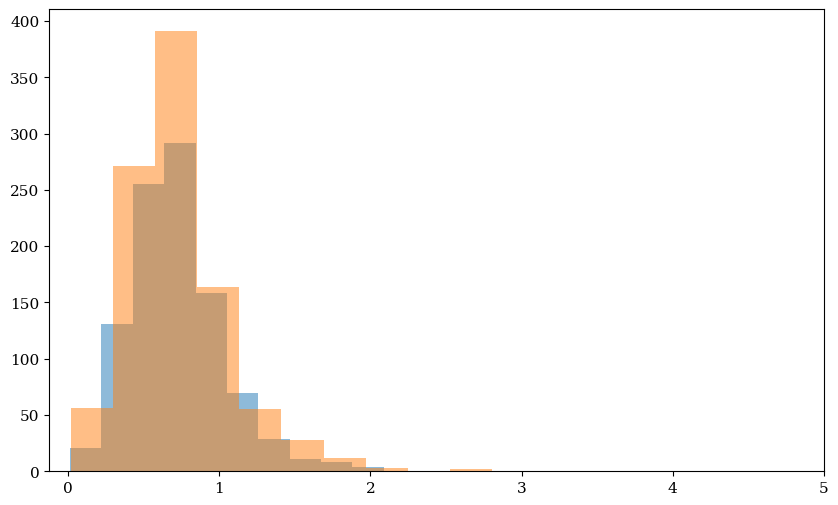

In [392]:
pre_post_dat[pre_post_dat["pre_post_status"]=="pre"]["mepsp_amp"].hist(grid=False,alpha=0.5)
pre_post_dat[pre_post_dat["pre_post_status"]=="post_3"]["mepsp_amp"].hist(grid=False, alpha=0.5)
plt.xlim(None,5)

In [142]:
learners = cell_dict_classified["ap_cells"]["cell_ID"].unique()
non_learners = cell_dict_classified["an_cells"]["cell_ID"].unique()

NameError: name 'cell_dict_classified' is not defined

In [ ]:
2023_01_27_cell_2

In [458]:

def mepsp_distribution_plot(all_cell_df,field_to_plot, learners,non_learners):
    all_cell_df = all_cell_df[all_cell_df["pre_post_status"].isin(["pre","post_3"])]
    cell_grps=all_cell_df.groupby(by="cell_ID")
    for cell,cell_data in cell_grps:
        fig,axs=plt.subplots(3,1)
        if cell in learners:
            cell_type ="learner"
        elif cell in non_learners:
            cell_type ="non-learner"
        else:
            color="k"
            continue
            
        pps_grp = cell_data.groupby(by="pre_post_status")
        for pps, pps_data in pps_grp:
            if pps=="pre":
                color='r'
            elif pps=="post_3":
                color='b'
            else:
                continue
            pps_data= pps_data.reset_index(drop=True)
            sns.histplot(pps_data[field_to_plot], bins=20, kde=True, color=color, edgecolor='black', ax=axs[0],alpha=0.6, label=pps)
            sns.histplot(data= pps_data, x="mepsp_amp", bins=10, kde=True, color=color, edgecolor='black', ax=axs[1],alpha=0.6, label=pps)
            sns.histplot(data= pps_data, x="num_mepsp", bins=10, kde=True, color=color, edgecolor='black', ax=axs[2],alpha=0.6, label=pps)
        axs[0].set_title(f"{field_to_plot}:{cell_type}:{cell}")
        axs[1].set_title(f"mepsp amplitude:{cell_type}:{cell}")
        axs[2].set_title(f"mepsp number:{cell_type}:{cell}")
        axs[0].set_xlim(0,15)
        axs[1].set_xlim(0,3)
        axs[2].set_xlim(0,40)
        plt.legend()
        plt.tight_layout()
        plt.show()
        plt.close()
    

In [459]:
all_cells_all_trails_extracted_featrues.columns

Index(['cell_ID', 'frame_status', 'pre_post_status', 'frame_id', 'trial_no',
       'min_trace', 'max_trace', 'abs_area', 'pos_area', 'neg_area',
       'onset_time', 'max_field', 'min_field', 'slope', 'intercept',
       'min_trace_t', 'max_trace_t', 'max_field_t', 'min_field_t', 'trace',
       'field', 'ttl', 'mean_rmp', 'mepsp_amp', 'mepsp_time', 'num_mepsp',
       'freq_mepsp'],
      dtype='object')

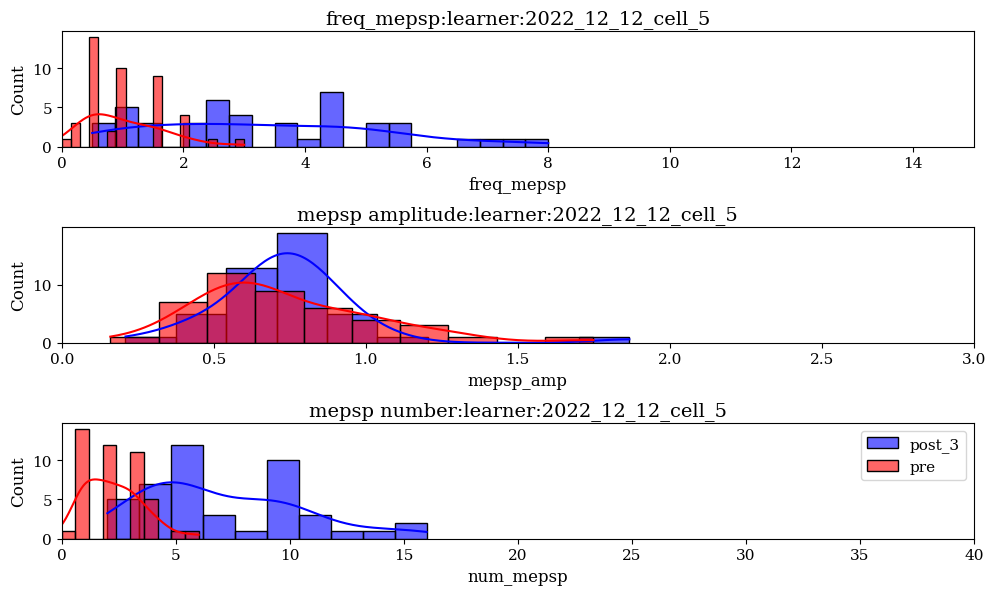

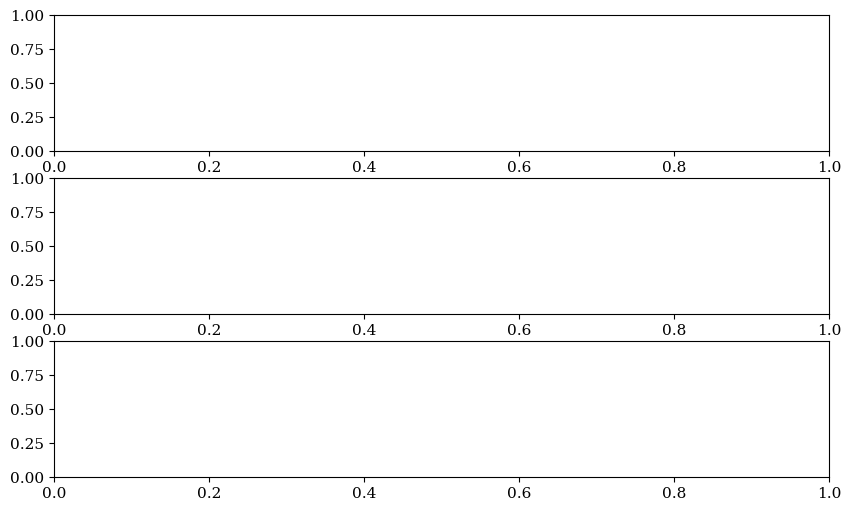

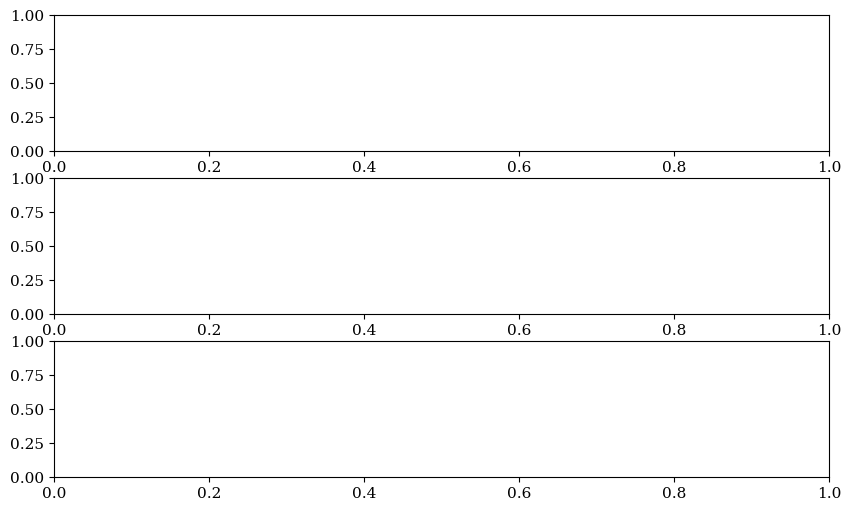

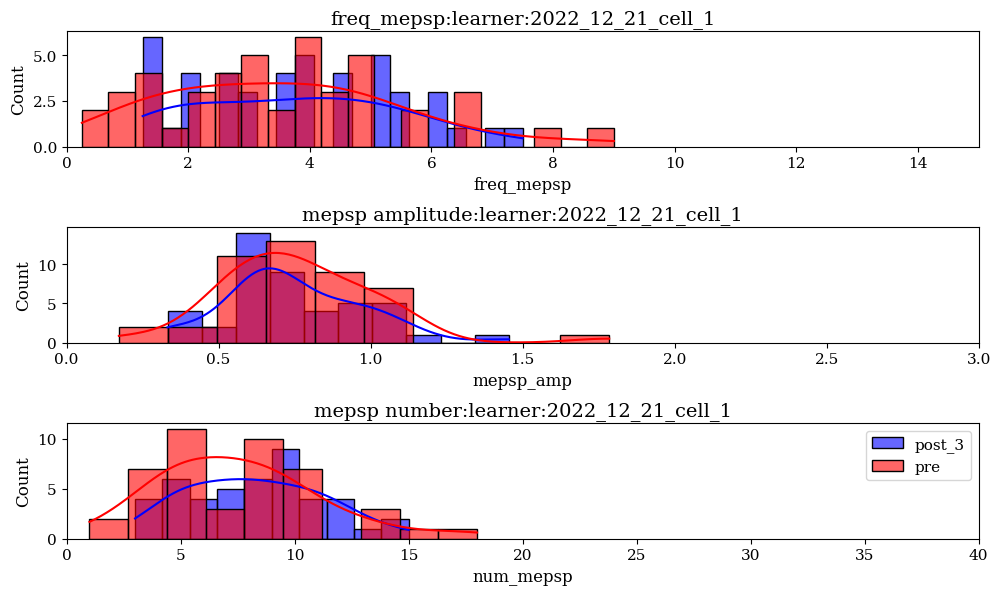

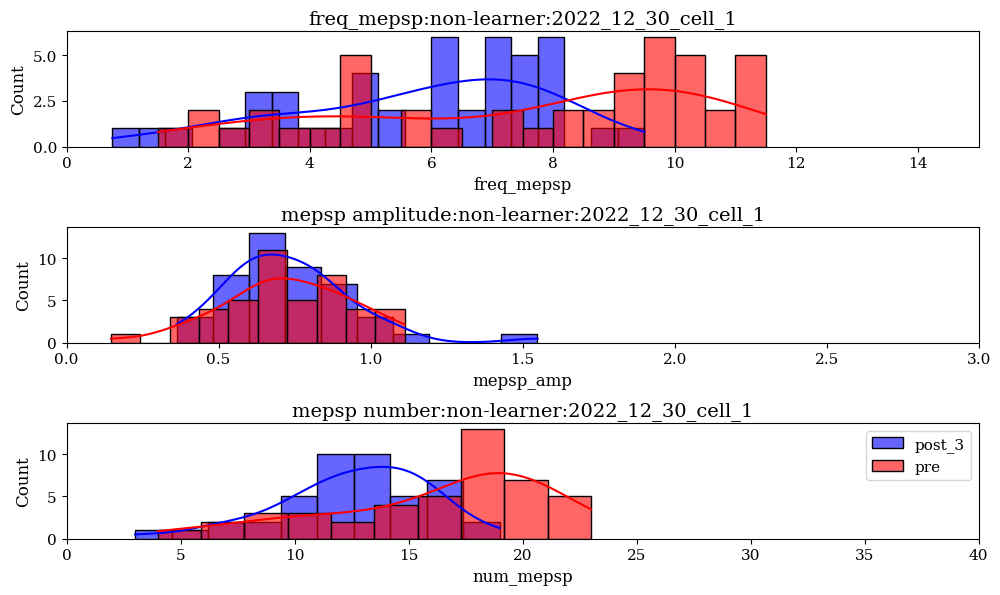

...

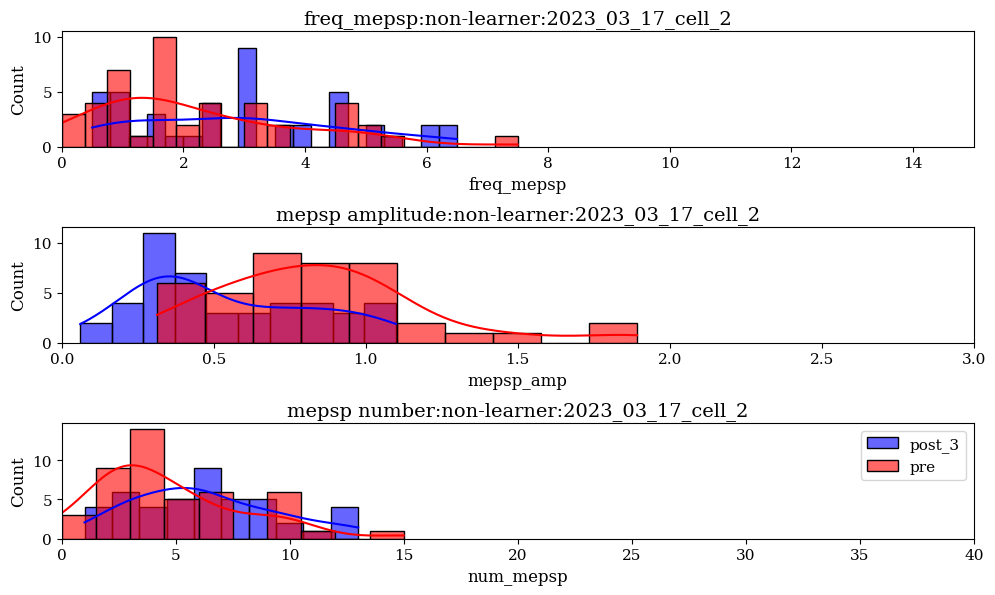

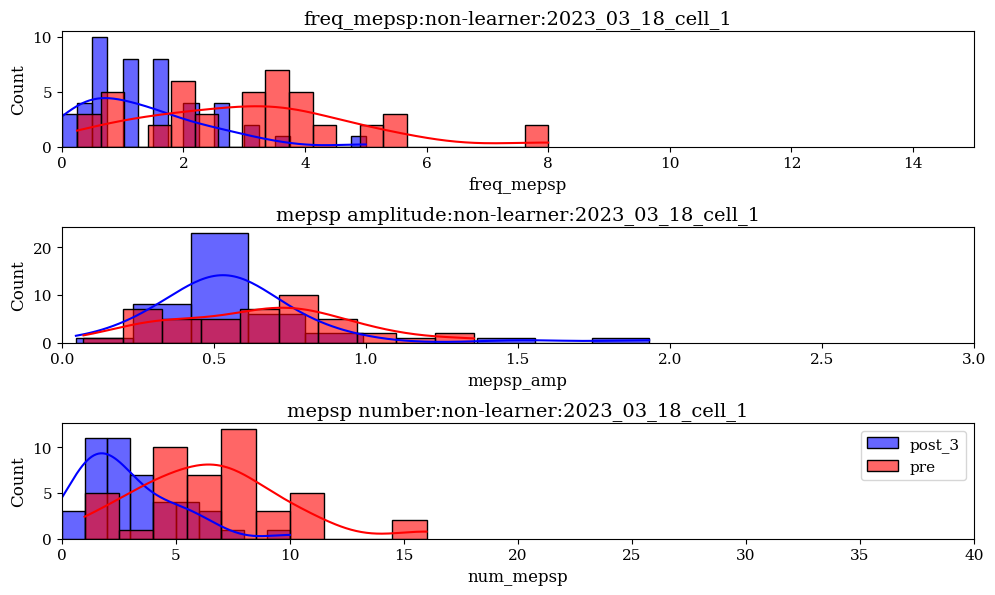

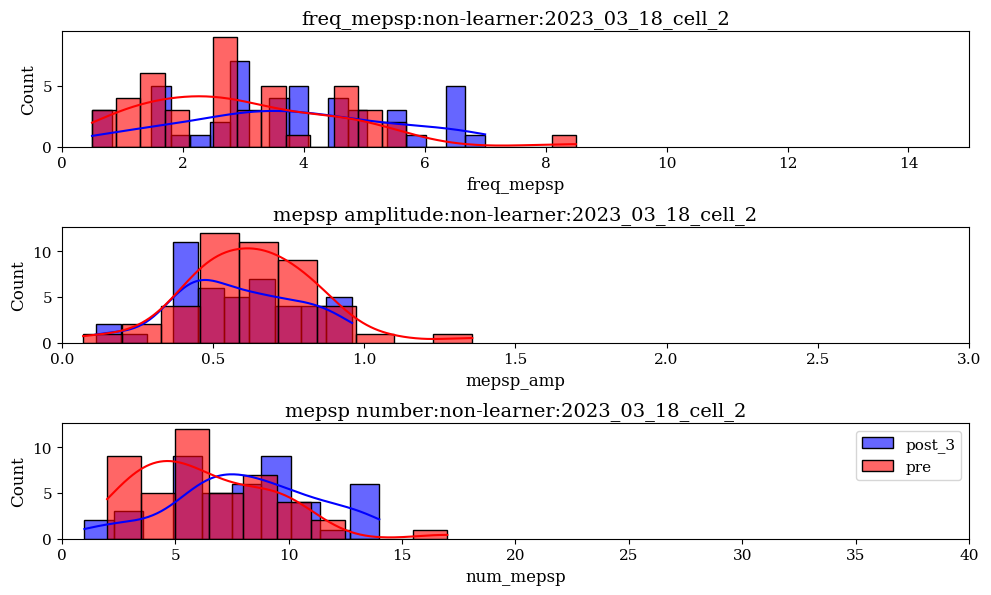

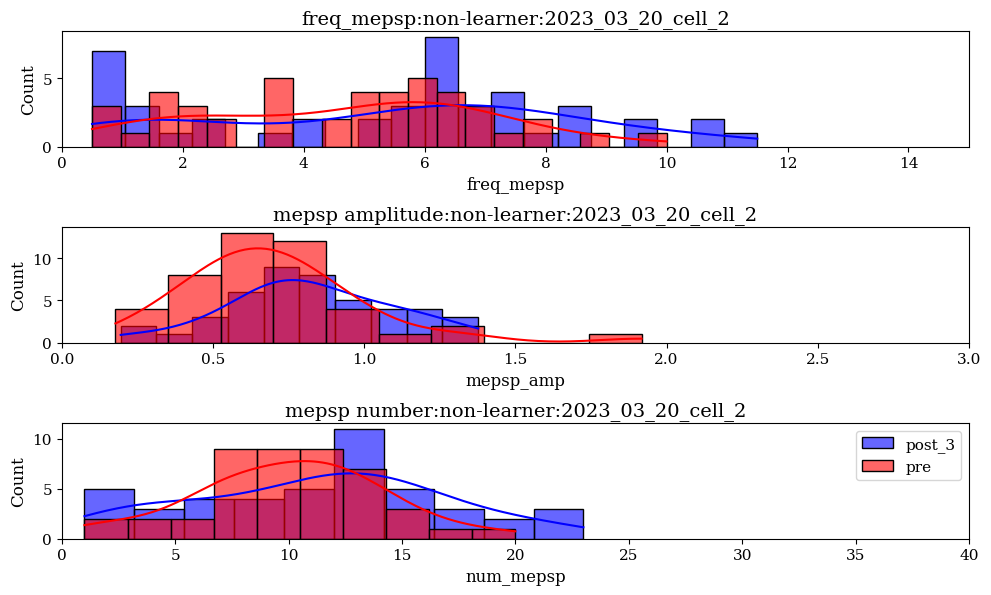

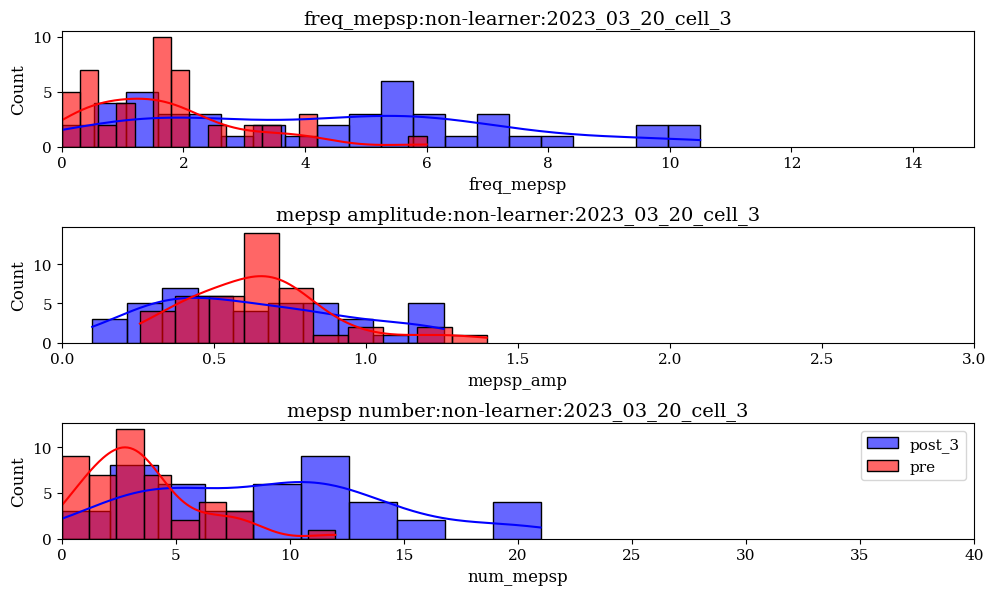

In [460]:
mepsp_distribution_plot(all_cells_all_trails_extracted_featrues,"freq_mepsp",learners,non_learners)

In [332]:
curve_fit_data = pd.read_hdf("/Users/anzalks/Documents/pattern_learning_paper/plotting_scripts/python_scripts_paper_ready/analysis_scripts/pickle_files_from_analysis/curvefir_results.h5")

In [134]:
curve_fit_data.columns

Index(['cell_ID', 'pre_post_status', 'frame_type', 'Epk', 'Etau', 'Ipk',
       'Itau', 'delay', 'initDelay', 'score'],
      dtype='object')

In [143]:
cell_dict_classified = pd.read_pickle("/Users/anzalks/Documents/pattern_learning_paper/plotting_scripts/python_scripts_paper_ready/analysis_scripts/pickle_files_from_analysis/all_cells_fnorm_classifeied_dict.pickle")

In [246]:
learners = cell_dict_classified["ap_cells"]["cell_ID"].unique()
non_learners = cell_dict_classified["an_cells"]["cell_ID"].unique()

In [136]:
def norm_values(cell_list,val_to_plot):
    cell_list = cell_list.copy()
    #print(f"cell list inside func : {cell_list}")
    cell_grp=cell_list.groupby(by="cell_ID")
    for c, cell in cell_grp:
        pat_grp = cell.groupby(by="frame_type")
        for p,pat in pat_grp:
            if "pattern" not in p:
                continue
            else:
                #print(f"c:{c}, p:{p}")
                pre_val= float(cell[(cell["cell_ID"]==c)&(cell["frame_type"]==p)&(cell["pre_post_status"]=="pre")][val_to_plot])
                pp_grp = pat.groupby(by="pre_post_status")
                for pr, pp in pp_grp:
                    norm_val = float(cell[(cell["cell_ID"]==c)&(cell["frame_type"]==p)&(cell["pre_post_status"]==pr)][val_to_plot])
                    norm_val = (norm_val/pre_val)*100
                    cell_list.loc[(cell_list["cell_ID"]==c)&(cell_list["frame_type"]==p)&(cell_list["pre_post_status"]==pr),val_to_plot]=norm_val
    return cell_list
   
def plot_cell_dist(catcell_dist,val_to_plot,fig,axs,pattern_number,y_lim,
                   x_label, cell_type,plt_color,resp_color):
    pat_num=int(pattern_number.split("_")[-1])
    num_cells= len(catcell_dist["cell_ID"].unique())
    pfd = catcell_dist.groupby(by="frame_type")
    for c, pat in pfd:
        pat[f"{val_to_plot}"].where(pat[f"{val_to_plot}"] <1000, np.nan, inplace=True)
        if c != pattern_number:
            continue
        else:
            order = np.array(('pre','post_0','post_1','post_2','post_3'),dtype=object)
            g=sns.stripplot(data=pat, x="pre_post_status",y=f"{val_to_plot}",
                            order=order,ax=axs,color=resp_color,
                            alpha=0.6,size=8, label='cell response')#alpha=0.8,
            sns.pointplot(data=pat, x="pre_post_status",y=f"{val_to_plot}",
                          errorbar="se",order=order,capsize=0.08,ax=axs,
                          color=plt_color, linestyles='dotted',scale = 0.8,
                         label="average cell response")
            g.set_title(None)
            #"""
            pvalList = []
            anotp_list = []
            for i in order[1:]:
                posti ="post{i}"
                #non parametric, paired and small sample size, hence used Wilcoxon signed-rank test
                #Wilcoxon signed-rank test
                posti= spst.wilcoxon(pat[pat["pre_post_status"]=='pre'][f"{val_to_plot}"],pat[pat["pre_post_status"]==i][f"{val_to_plot}"],
                                     zero_method="wilcox", correction=True)
                pvalList.append(posti.pvalue)
                anotp_list.append(("pre",i))
            annotator = Annotator(axs,anotp_list,data=pat, 
                                  x="pre_post_status",
                                  y=f"{val_to_plot}",
                                  order=order,
                                 fontsize=8)
            #annotator = Annotator(axs[pat_num],[("pre","post_0"),("pre","post_1"),("pre","post_2"),("pre","post_3")],data=cell, x="pre_post_status",y=f"{col_pl}")
            annotator.set_custom_annotations([bpf.convert_pvalue_to_asterisks(a) for a in pvalList])
            annotator.annotate()
            #"""
            axs.axhline(100, ls=':',color="k", alpha=0.4)
            if pat_num==0:
                sns.despine(fig=None, ax=axs, top=True, right=True, 
                            left=False, bottom=False, offset=None, trim=False)
                axs.set_ylabel("% change in\nEPSP amplitude")
                axs.set_xlabel(None)
                #axs[pat_num].set_yticks([])
            elif pat_num==1:
                sns.despine(fig=None, ax=axs, top=True, right=True, 
                            left=False, bottom=False, offset=None, trim=False)
                axs.set_ylabel(None)
                axs.set_yticklabels([])
                if cell_type=="dep_cells":
                    axs.set_xlabel(x_label)
                else:
                    axs.set_xlabel(None)
            elif pat_num==2:
                sns.despine(fig=None, ax=axs, top=True, right=True, 
                            left=False, bottom=False, offset=None, trim=False)
                axs.set_xlabel(None)
                axs.set_ylabel(None)
                axs.set_yticklabels([])
            else:
                pass 
            g.set(ylim=y_lim)
            g.set_xticklabels(time_points,rotation=0)
            g.legend_.remove()
            if cell_type!="dep_cells":
                axs.set_xticklabels([])
            else:
                pass 


    ax_pos = axs.get_position()
    #new_ax_pos = [ax_pos.x0-0.02, ax_pos.y0, ax_pos.width,
    #              ax_pos.height]
    #axs.set_position(new_ax_pos)




def plot_cell_category_classified_EPSP_features(esp_feat_cells_df,val_to_plot,
                                                fig,axs1,axs2,axs3,cell_type):
    cell_df= norm_values(esp_feat_cells_df,val_to_plot)
    if cell_type=="pot_cells":
        strp_color = bpf.CB_color_cycle[0]
        line_color = bpf.CB_color_cycle[5]
        y_lim = (-100,800)
        x_label = None
    elif cell_type=="dep_cells":
        strp_color = bpf.CB_color_cycle[1]
        line_color = bpf.CB_color_cycle[5]
        y_lim = (-200,500)
        x_label = "time points (mins)"
    else:
        y_lim=None
        strp_color = bpf.CB_color_cycle[1]
        line_color = bpf.CB_color_cycle[5]
        x_label = "time points (mins)"
        print("uncagerised cell")
        
    plot_cell_dist(cell_df,val_to_plot,fig,axs1,"pattern_0",
                   y_lim,x_label,cell_type,line_color,strp_color
                  )
    plot_cell_dist(cell_df,val_to_plot,fig,axs2,"pattern_1",
                   y_lim,x_label,cell_type,line_color,strp_color
                  )
    plot_cell_dist(cell_df,val_to_plot,fig,axs3,"pattern_2",
                   y_lim,x_label,cell_type,line_color,strp_color
                  )

In [119]:
def classify_cells_curve_fit(cell_dict_classified,curve_fit_data):
    cell_grps =curve_fit_data.groupby(by="cell_ID")
    learners_list = cell_dict_classified["ap_cells"]["cell_ID"].unique()
    non_learners_list = cell_dict_classified["an_cells"]["cell_ID"].unique()
    #print(non_learners_list)
    learners=[]
    non_learners =[]
    for cell, cell_data in cell_grps:
        if cell in learners_list:
            cell_data["cell_ID"]=cell
            learners.append(cell_data)
            #print("learner", cell)
        elif cell in non_learners_list:
            cell_data["cell_ID"]=cell
            non_learners.append(cell_data)
            #print("non-learner", cell)
        else:
            pass
            #print("uncategorised")
    learners=pd.concat(learners)
    non_learners = pd.concat(non_learners)
    return learners, non_learners
    

In [550]:
learners,non_learners = classify_cells_curve_fit(cell_dict_classified,curve_fit_data)

In [558]:
learners["cell_ID"].unique()

array(['2022_12_12_cell_5', '2022_12_21_cell_1', '2023_01_09_cell_2',
       '2023_01_09_cell_3', '2023_01_27_cell_1', '2023_02_24_cell_3',
       '2023_02_26_cell_1'], dtype=object)

In [140]:
def plot_feature_from_curve_fit(feature_to_plot):
    learners,non_learners = classify_cells_curve_fit(cell_dict_classified,curve_fit_data)
    fig = plt.figure()
    #plot patterns
    axs1 = fig.add_subplot(131)
    axs2 = fig.add_subplot(132)
    axs3 = fig.add_subplot(133)

    plot_cell_category_classified_EPSP_features(learners,feature_to_plot,fig,axs1,axs2,axs3,"pot_cells")

    axs2.set_title(f"learners: {feature_to_plot}")
    plt.show()
    plt.close(fig)
    
    fig = plt.figure()
    #plot patterns
    axs1 = fig.add_subplot(131)
    axs2 = fig.add_subplot(132)
    axs3 = fig.add_subplot(133)
    
    plot_cell_category_classified_EPSP_features(non_learners,feature_to_plot,fig,axs1,axs2,axs3,"dep_cells")
    
    axs2.set_title(f"non-learners: {feature_to_plot}")
    plt.show()
    plt.close(fig)


In [151]:
features_to_plot = list(curve_fit_data.columns)[3:-1]

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: *
pre vs. post_1: *
pre vs. post_2: *
pre vs. post_3: *
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: *
pre vs. post_1: ns
pre vs. post_2: *
pre vs. post_3: *
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns


/Users/anzalks/miniconda3/envs/lab_env/lib/python3.10/site-packages/statannotations/_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(


pre vs. post_2: ns
pre vs. post_3: ns


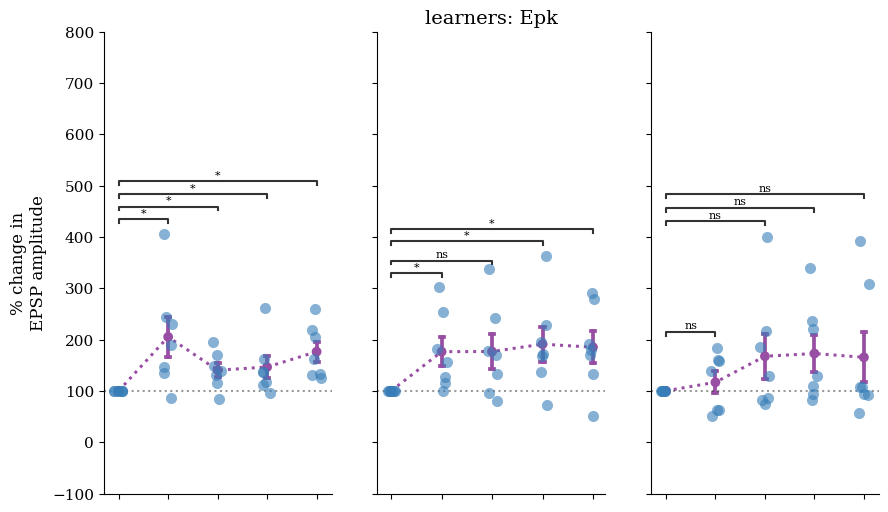

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: **
pre vs. post_3: ***
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: *
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns


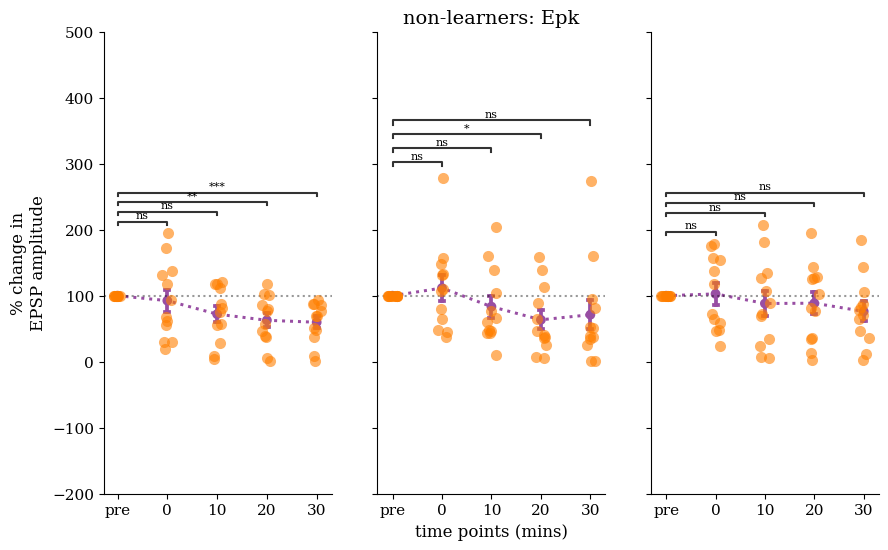

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: *
pre vs. post_1: ns
pre vs. post_2: *
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns


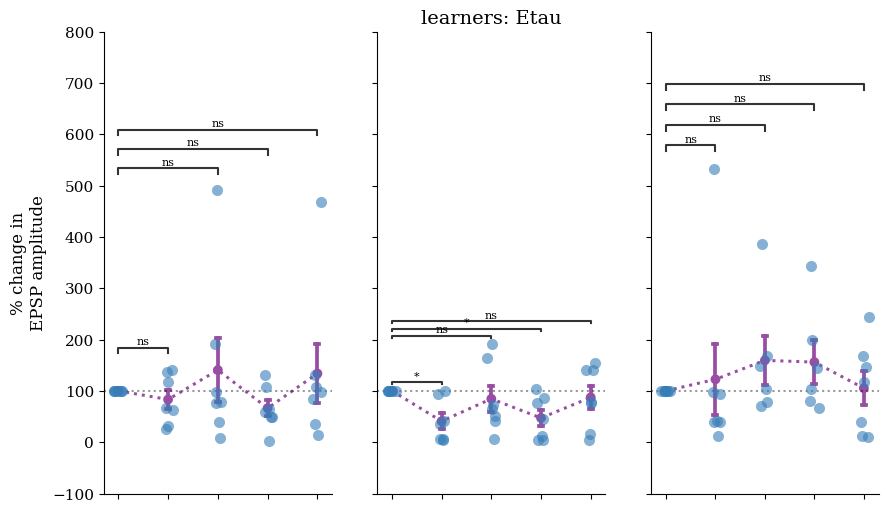

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: *
pre vs. post_3: **
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: *
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns


/Users/anzalks/miniconda3/envs/lab_env/lib/python3.10/site-packages/scipy/stats/_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns


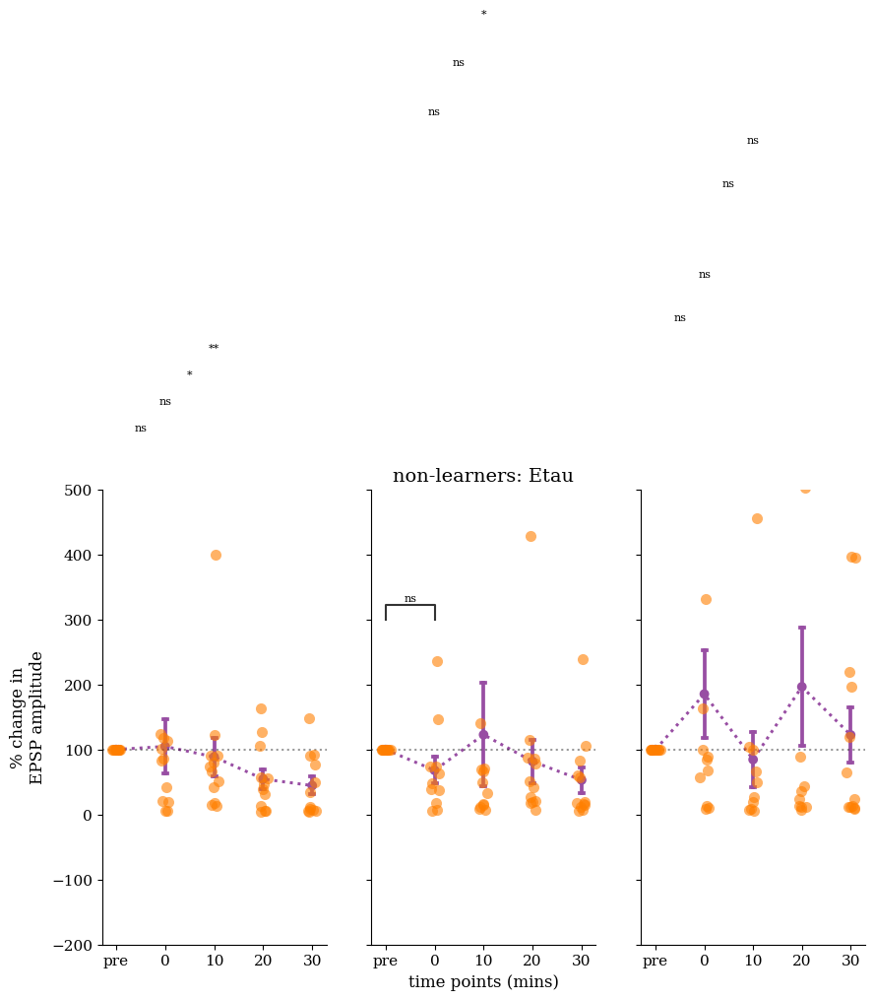

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: *
pre vs. post_2: *
pre vs. post_3: *


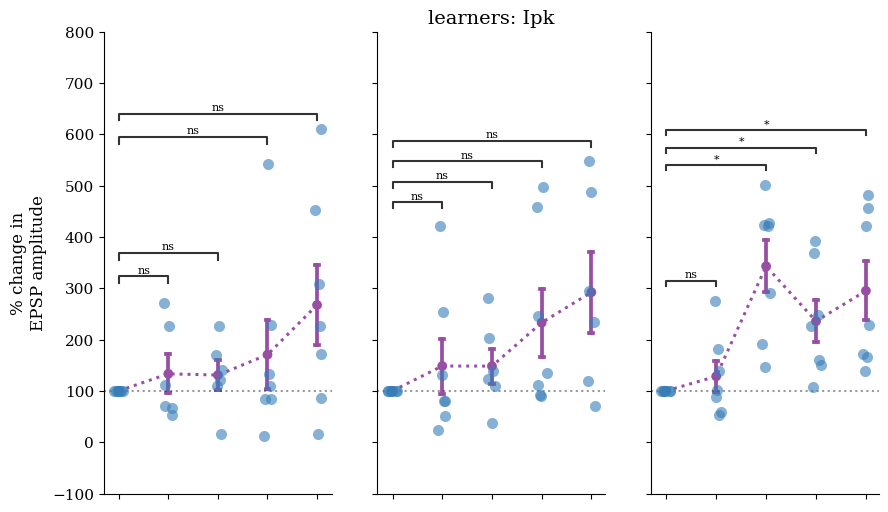

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: *
pre vs. post_3: *


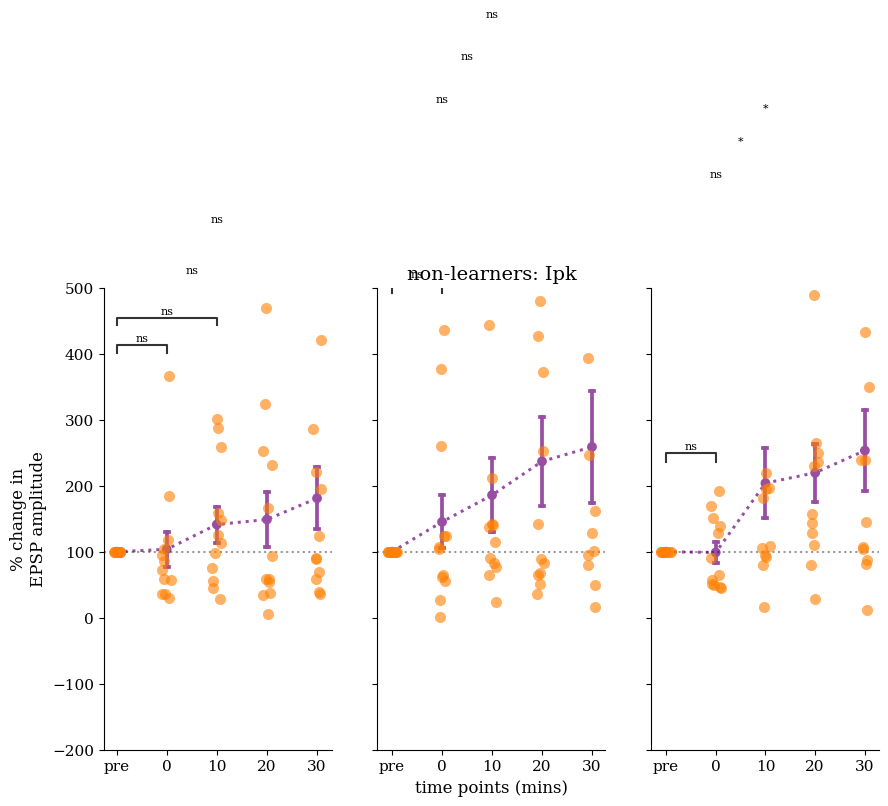

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: *
pre vs. post_3: ns


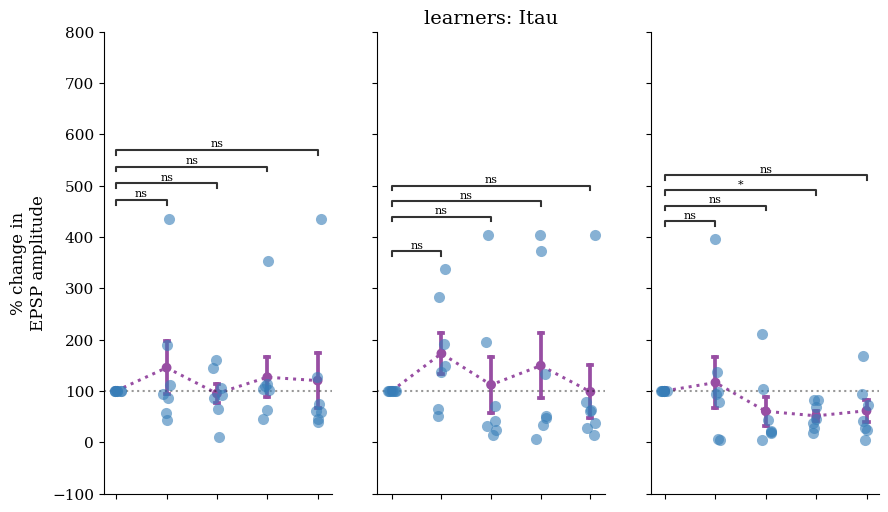

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: *
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: **
pre vs. post_3: ***
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns


/Users/anzalks/miniconda3/envs/lab_env/lib/python3.10/site-packages/scipy/stats/_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns


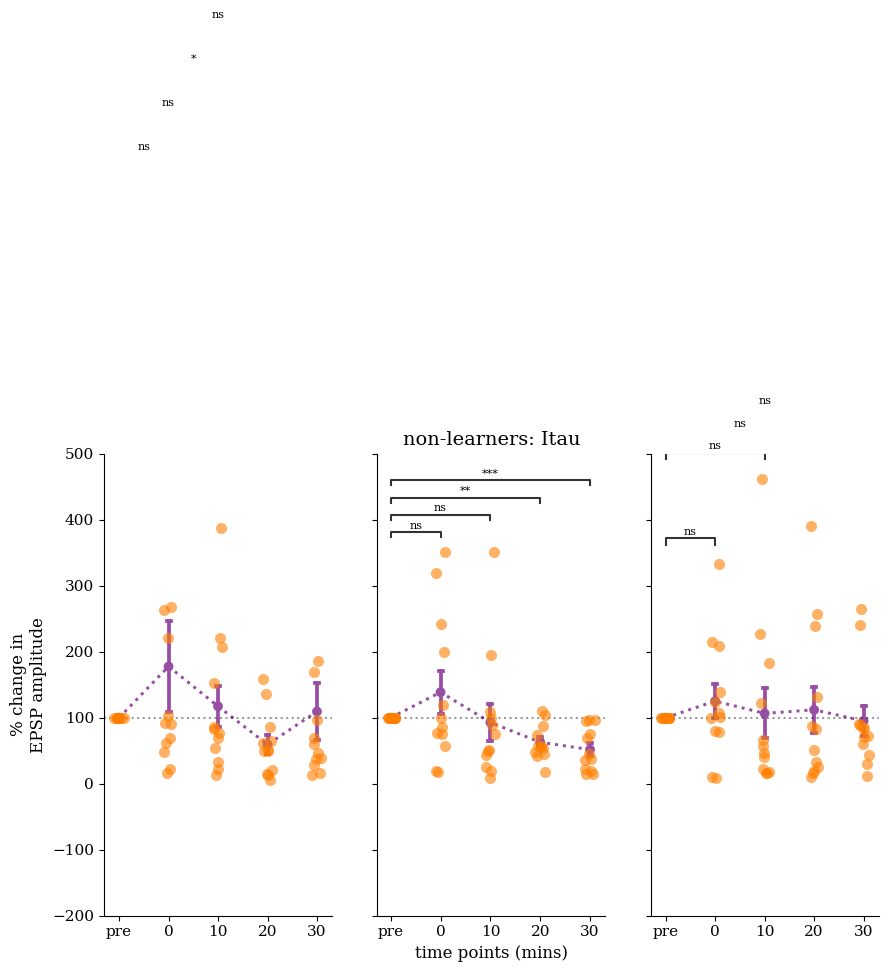

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns


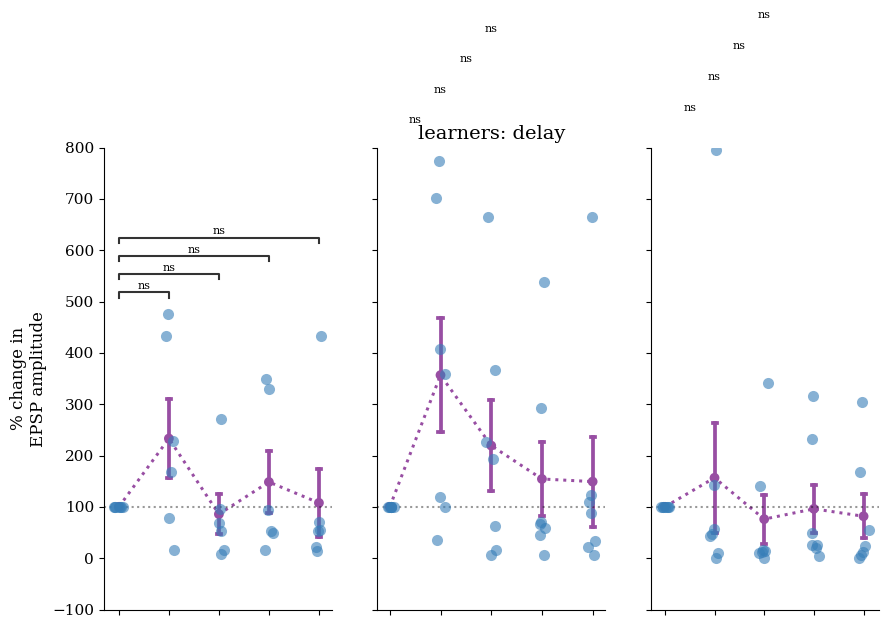

/Users/anzalks/miniconda3/envs/lab_env/lib/python3.10/site-packages/scipy/stats/_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: **
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns


/Users/anzalks/miniconda3/envs/lab_env/lib/python3.10/site-packages/scipy/stats/_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


pre vs. post_1: *
pre vs. post_2: ns
pre vs. post_3: ns


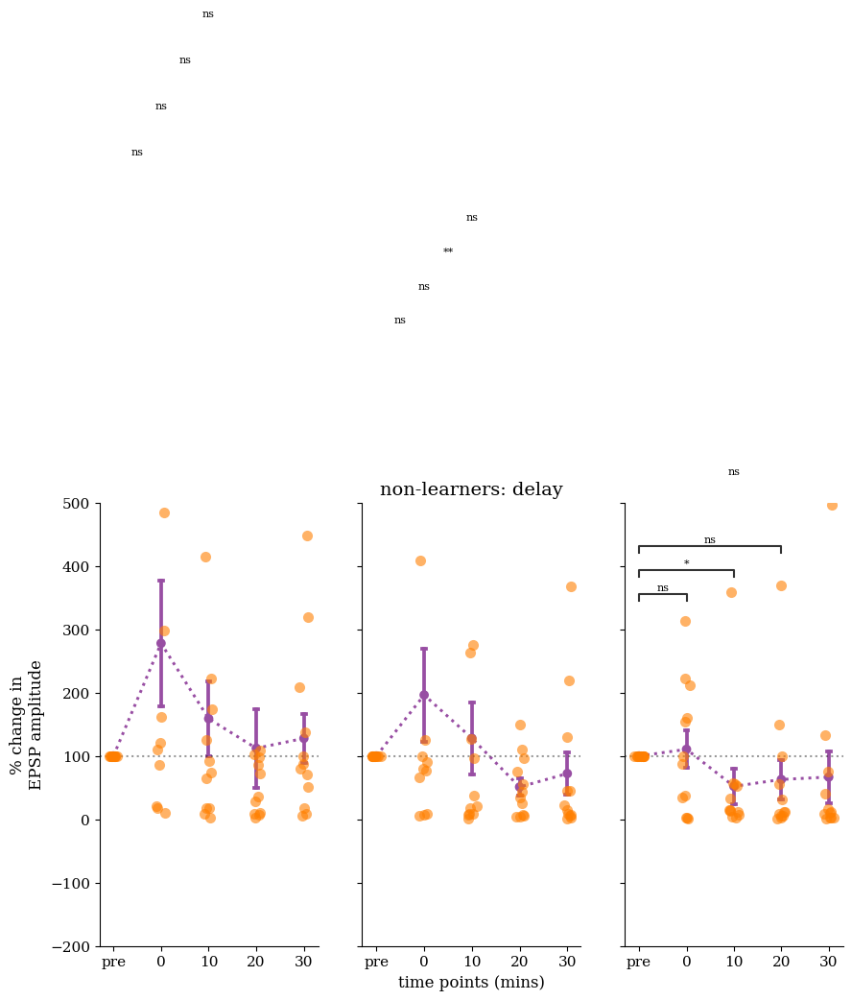

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns


/Users/anzalks/miniconda3/envs/lab_env/lib/python3.10/site-packages/scipy/stats/_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/Users/anzalks/miniconda3/envs/lab_env/lib/python3.10/site-packages/scipy/stats/_morestats.py:4102: UserWarning: Sample size too small for normal approximation.
  warnings.warn("Sample size too small for normal approximation.")


pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns


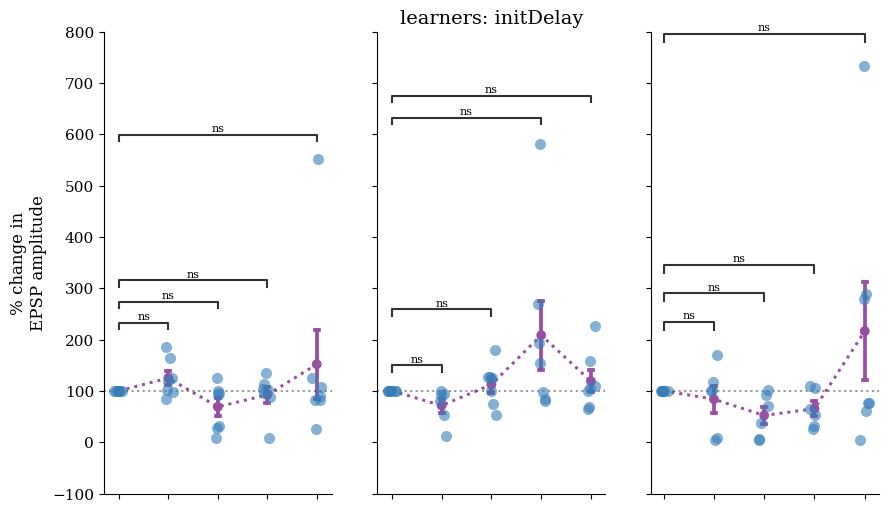

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns


/Users/anzalks/miniconda3/envs/lab_env/lib/python3.10/site-packages/scipy/stats/_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/Users/anzalks/miniconda3/envs/lab_env/lib/python3.10/site-packages/scipy/stats/_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

pre vs. post_0: ns
pre vs. post_1: ns
pre vs. post_2: ns
pre vs. post_3: ns


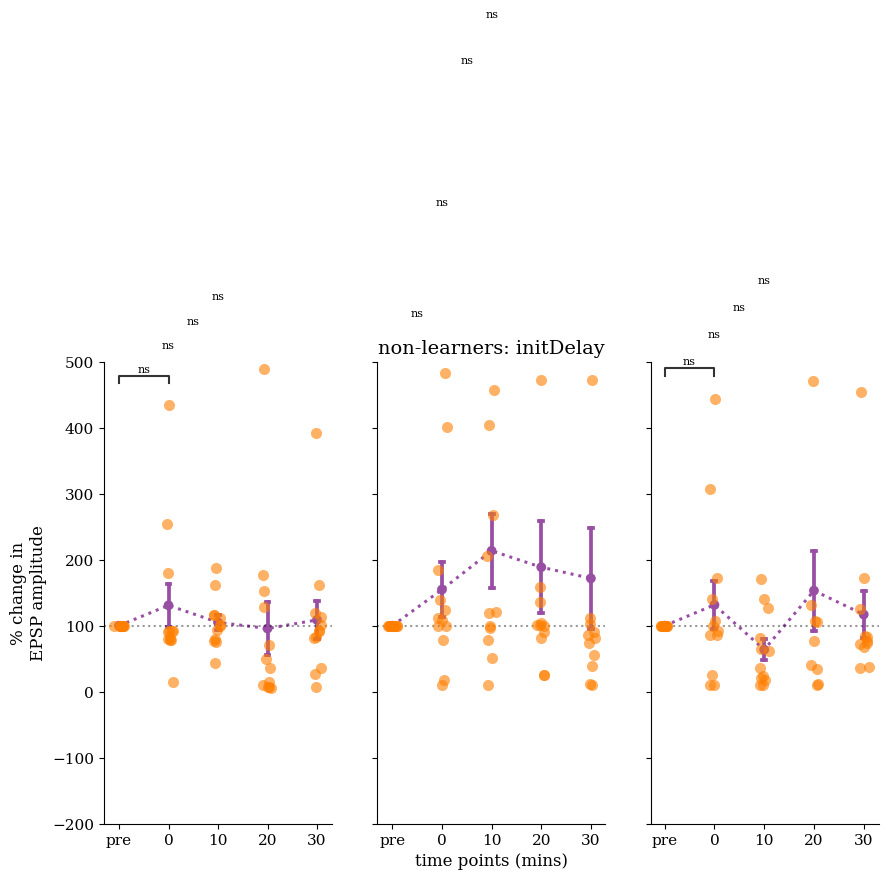

In [153]:
for feature in features_to_plot:
    plot_feature_from_curve_fit(feature)

In [2]:
raw_data_df =pd.read_pickle("/Users/anzalks/Documents/pattern_learning_paper/plotting_scripts/python_scripts_paper_ready/data/pickle_files/all_data_with_training_df.pickle")

In [3]:
training_data= raw_data_df[raw_data_df["frame_id"].str.contains("training", case=False, na=False)]

In [36]:
training_data

,cell_ID,trial_no,trigger_time,trigger_val,cell_thresh_time,cell_thresh_val,trace
0,2022_12_12_cell_5,0,0.2,1.569519,6.30,0.266388,"[-0.032684326, -0.023529053, -0.032684326, -0...."
0,2022_12_12_cell_5,1,0.2,1.569519,8.00,0.252472,"[-0.1076355, -0.08932495, -0.083221436, -0.089..."
0,2022_12_12_cell_5,2,0.2,1.569519,9.30,0.251892,"[-0.06854248, -0.06854248, -0.059387207, -0.05..."
0,2022_12_12_cell_5,3,0.2,1.569519,5.80,0.274109,"[-0.3637085, -0.37591553, -0.38201904, -0.3515..."
0,2022_12_12_cell_5,4,0.2,1.569519,9.80,0.254730,"[-0.0077209473, -0.013824463, -0.013824463, -0..."
...,...,...,...,...,...,...,...
0,2023_03_20_cell_3,0,0.2,1.567383,15.05,1.352173,"[-0.008911133, -0.02722168, -0.005859375, -0.0..."
0,2023_03_20_cell_3,1,0.2,1.567383,9.95,0.256493,"[-0.03037262, -0.012062073, 0.006248474, -0.00..."
0,2023_03_20_cell_3,2,0.2,1.567383,9.35,0.251740,"[-0.056488037, -0.056488037, -0.041229248, -0...."
0,2023_03_20_cell_3,3,0.2,1.567383,9.65,0.254364,"[-0.029449463, -0.02029419, -0.023345947, -0.0..."


In [27]:
def extract_training_data(cell_data):
    cell_data = cell_data[cell_data["frame_id"].str.contains("training", case=False, na=False)]
    cell_grp = cell_data.groupby(by="cell_ID")
    cell_list = []
    for cell, cell_data in cell_grp[:1]:
        sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())
        trial_grp = cell_data.groupby(by="trial_no")
        for trial, trial_data in trial_grp[:1]:
            trace=trial_data["cell_trace(mV)"].to_numpy()
            trace=substract_baseline(trace,sampling_rate, 5)
            ttl=trial_data["ttl_trace(V)"].to_numpy()
            trigger=np.argmax(ttl>0.5)
            trigger_time = (trigger/sampling_rate)*1000
            trigger_val = ttl[trigger]
            cell_thresh=np.argmax(trace>0.25)
            cell_thresh_time = (cell_thresh/sampling_rate)*1000
            cell_thresh_val = trace[cell_thresh]
            cell_list.append([cell,trial,trigger_time,trigger_val,cell_thresh_time,cell_thresh_val,trace])
            clist_header=["cell_ID","trial_no","trigger_time","trigger_val","cell_thresh_time","cell_thresh_val","trace"]
    pd_cell_list =pd.concat(pd.DataFrame([i],columns=clist_header) for i in tqdm(cell_list))
    return pd_cell_list

In [26]:
training_data = extract_training_data(raw_data_df)

KeyboardInterrupt: 

In [ ]:
def slice_ttl_segment(sampling_rate,ttl_trace,voltage_trace,field_trace):
    trigger=np.argmax(ttl>0.5)
    trigger_time = (trigger/sampling_rate)*1000
    trigger_val = ttl[trigger]
    
    

In [66]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

def subtract_baseline(trace, sampling_rate, bl_period_in_ms):
    bl_period = bl_period_in_ms / 1000
    bl_duration = int(sampling_rate * bl_period)
    bl = np.mean(trace[:bl_duration])
    bl_trace = trace - bl
    return bl_trace

def detect_ttl_rising_edges(ttl_signal, threshold=0.5):
    """Detects the rising edges of the TTL signal based on a threshold."""
    rising_edges = np.where((ttl_signal[:-1] < threshold) & (ttl_signal[1:] >= threshold))[0]
    return rising_edges

def detect_first_spike(trace, ttl_rising_edge, window=200, min_height=40):
    """Detect the first spike in the trace after the TTL rising edge within a 10ms (200 points) window.
       Only spikes above 40 mV will be considered."""
    if ttl_rising_edge + window < len(trace):  # Ensure we don't go out of bounds
        trace_section = trace[ttl_rising_edge: ttl_rising_edge + window]
        peaks, properties = find_peaks(trace_section, height=min_height)
        if len(peaks) > 0:
            # Return the first peak detected above 40 mV
            peak_idx = peaks[0] + ttl_rising_edge  # Preserve the original index location
            peak_val = trace[peak_idx]
            return peak_idx, peak_val
    return None, None

def detect_most_minimal(field_trace, ttl_rising_edge, window=200):
    """Detect the most minimal value (lowest point) in the field trace after the TTL rising edge within a 10ms (200 points) window."""
    if ttl_rising_edge + window < len(field_trace):  # Ensure we don't go out of bounds
        trace_section = field_trace[ttl_rising_edge: ttl_rising_edge + window]
        if len(trace_section) > 0:
            min_idx = np.argmin(trace_section)  # Find the index of the most minimal value
            minima_val = trace_section[min_idx]
            return min_idx + ttl_rising_edge, minima_val  # Preserve the original index location
    return None, None

def plot_raw_training_data(cell_data, plot_limit=None):
    """
    Plots the raw training data.
    
    Parameters:
    cell_data (DataFrame): The input data containing the traces.
    plot_limit (int or None): The number of points to plot. If None, plot the entire data.
    """
    
    cell_data = cell_data[cell_data["frame_id"].str.contains("training", case=False, na=False)]
    cell_grp = cell_data.groupby(by="cell_ID")
    
    for cell, cell_data in cell_grp:
        fig, axs = plt.subplots(3, 1, figsize=(10, 8))  # Adjust figure size as needed
        sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())
        trial_grp = cell_data.groupby(by="trial_no")
        
        for trial, trial_data in trial_grp:
            # Process cell trace and field trace
            trace = trial_data["cell_trace(mV)"].to_numpy()
            trace = subtract_baseline(trace, sampling_rate, 5)
            
            field_trace = trial_data["field_trace(mV)"].to_numpy()
            field_trace = subtract_baseline(field_trace, sampling_rate, 5)
            
            ttl = trial_data["ttl_trace(V)"].to_numpy()

            # Detect rising edges in TTL
            ttl_rising_edges = detect_ttl_rising_edges(ttl)

            # Define the range to plot
            if plot_limit is not None:
                trace_range = plot_limit
            else:
                trace_range = len(trace)

            # Plot TTL, trace, and field trace
            axs[1].plot(ttl[:trace_range])
            axs[0].plot(trace[:trace_range])
            axs[2].plot(field_trace[:trace_range])

            for edge in ttl_rising_edges:
                if edge < trace_range:  # Make sure the detected edge is within the plot range
                    # Detect the first spike in the cell trace (within 10ms, spikes above 40 mV)
                    spike_idx, spike_val = detect_first_spike(trace, edge, min_height=40)

                    # Detect the most minimal value (lowest point) in the field trace (within 10ms)
                    minima_idx, minima_val = detect_most_minimal(field_trace, edge)

                    # Plot TTL trace with detected rising edges
                    axs[1].scatter(edge, ttl[edge], color='red', label='TTL Rising Edge')

                    # Plot cell trace with detected spike
                    if spike_idx is not None and spike_idx < trace_range:  # Ensure within range
                        axs[0].scatter(spike_idx, spike_val, color='red', label='Spike Peak')

                    # Plot field trace with detected minima
                    if minima_idx is not None and minima_idx < trace_range:  # Ensure within range
                        axs[2].scatter(minima_idx, minima_val, color='blue', label='Field Minima')

        # Label and show the plot
        axs[0].set_title(f"Cell: {cell}, Trial: {trial} - Cell Trace")
        axs[0].set_ylabel("Voltage (mV)")
        axs[1].set_title("TTL Trace")
        axs[1].set_ylabel("Voltage (V)")
        axs[2].set_title("Field Trace")
        axs[2].set_ylabel("Voltage (mV)")

        plt.tight_layout()
        plt.show()
        plt.close()


/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


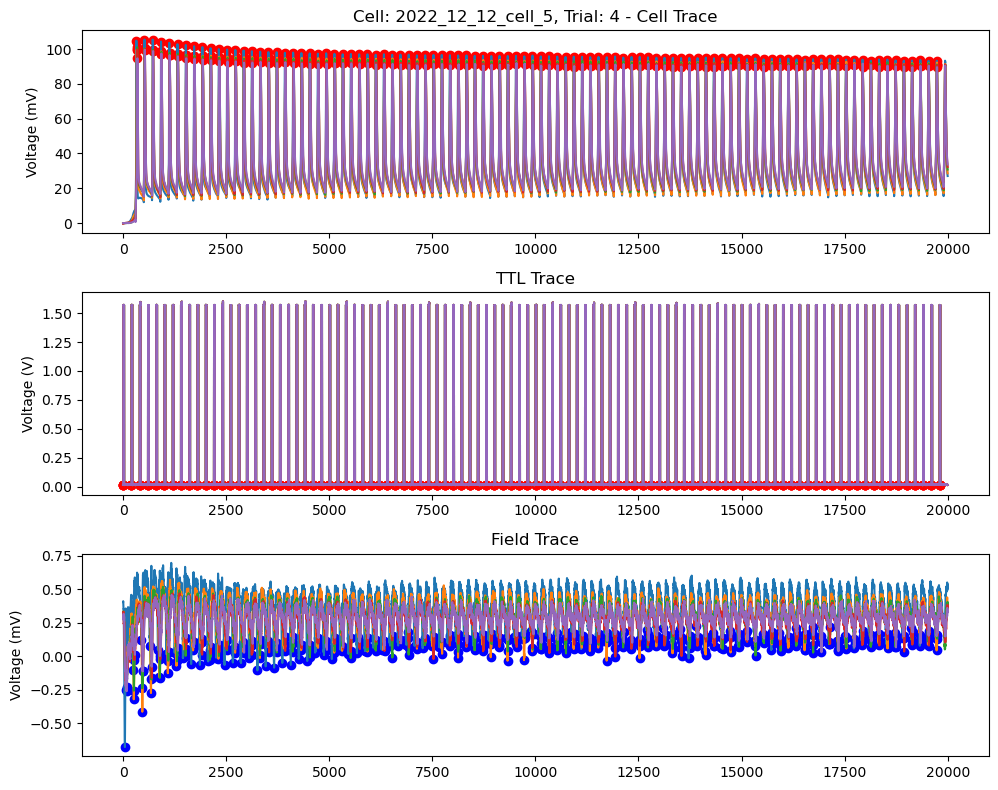

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


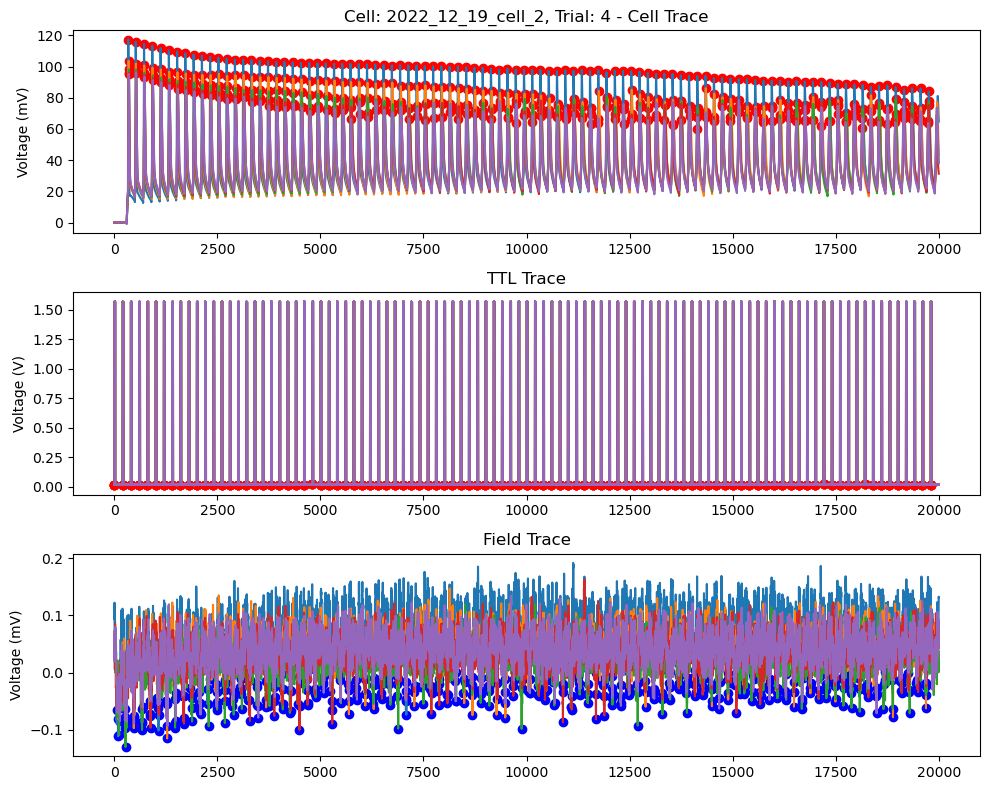

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


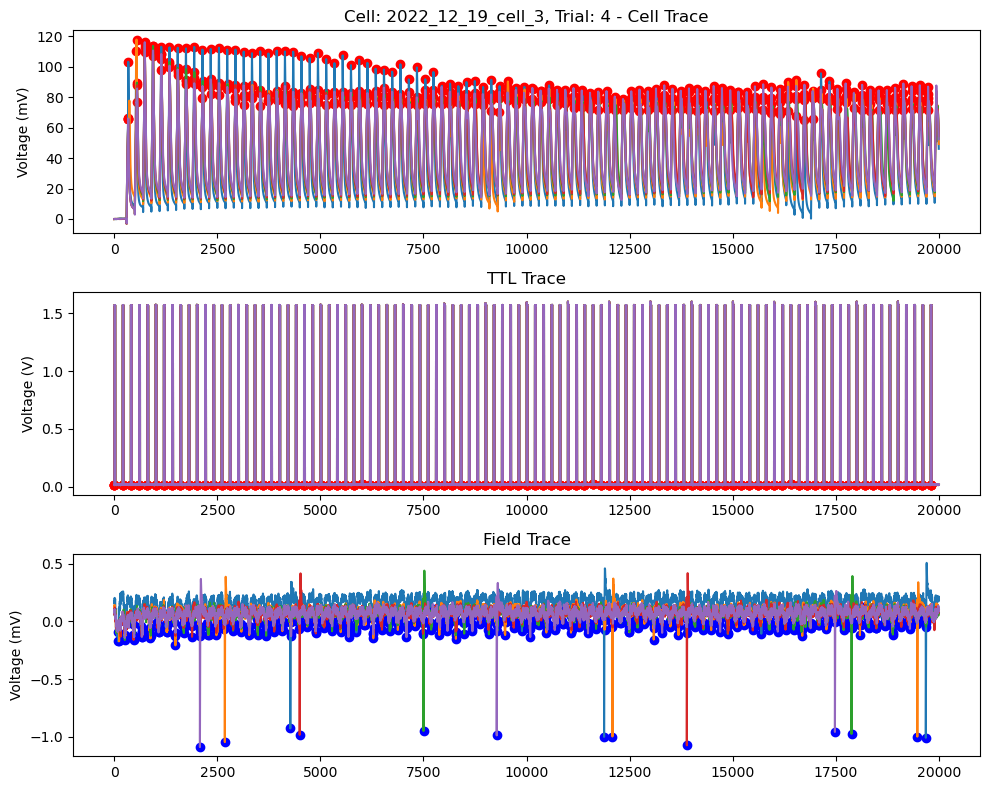

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


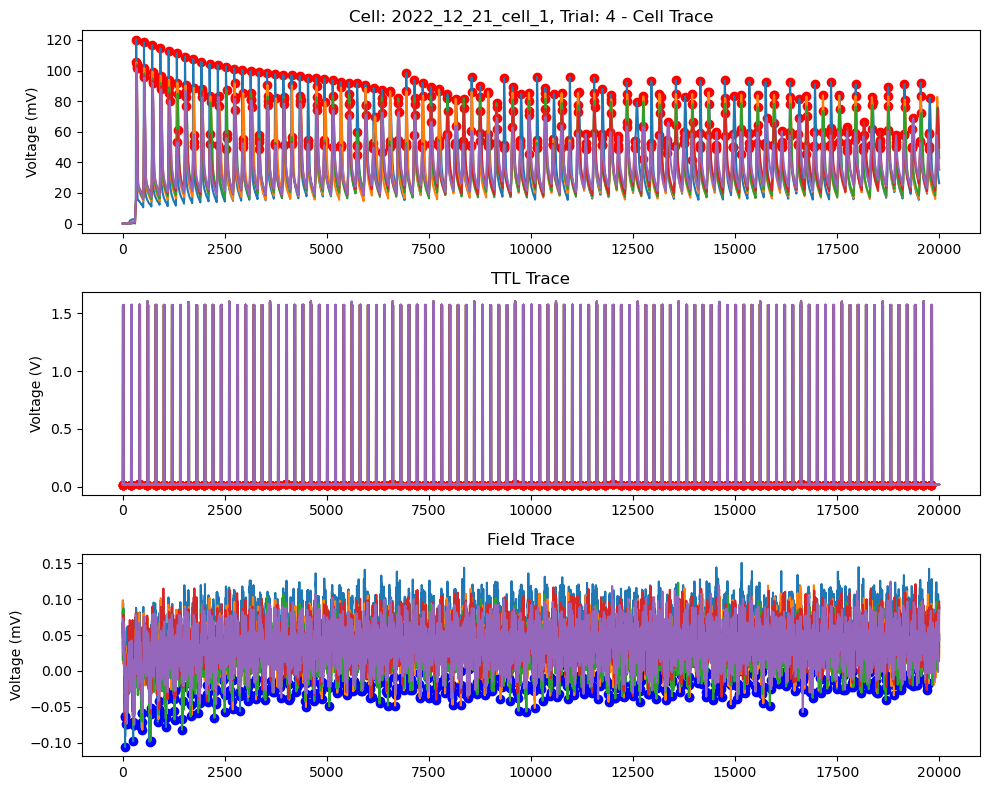

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


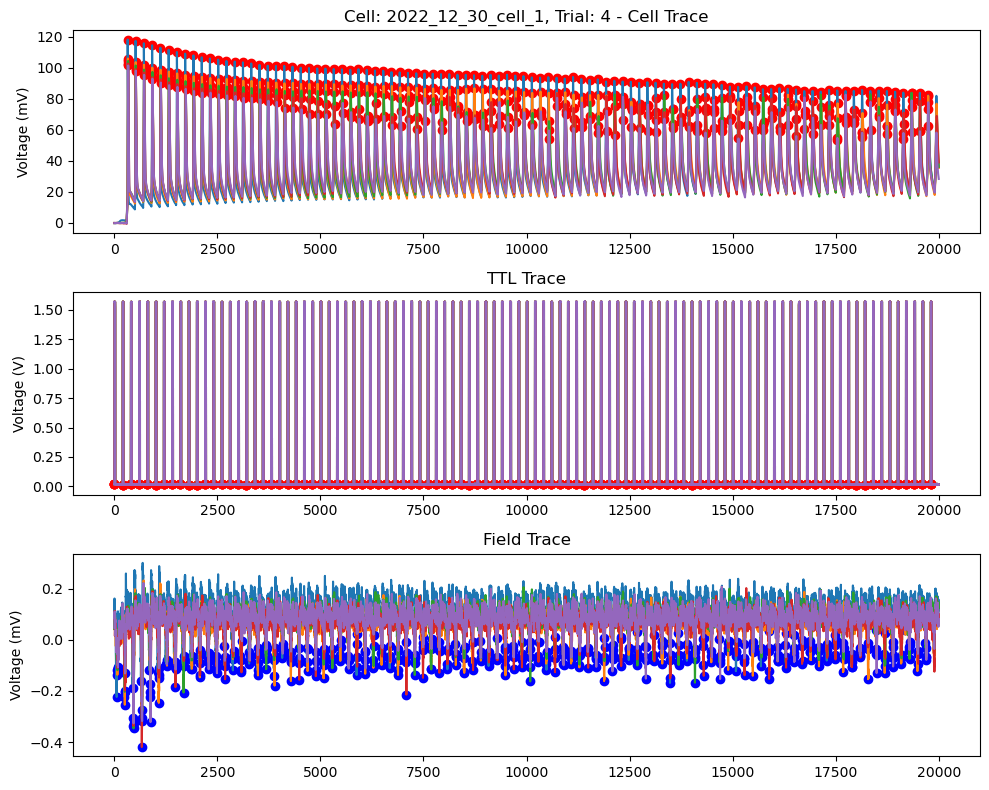

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


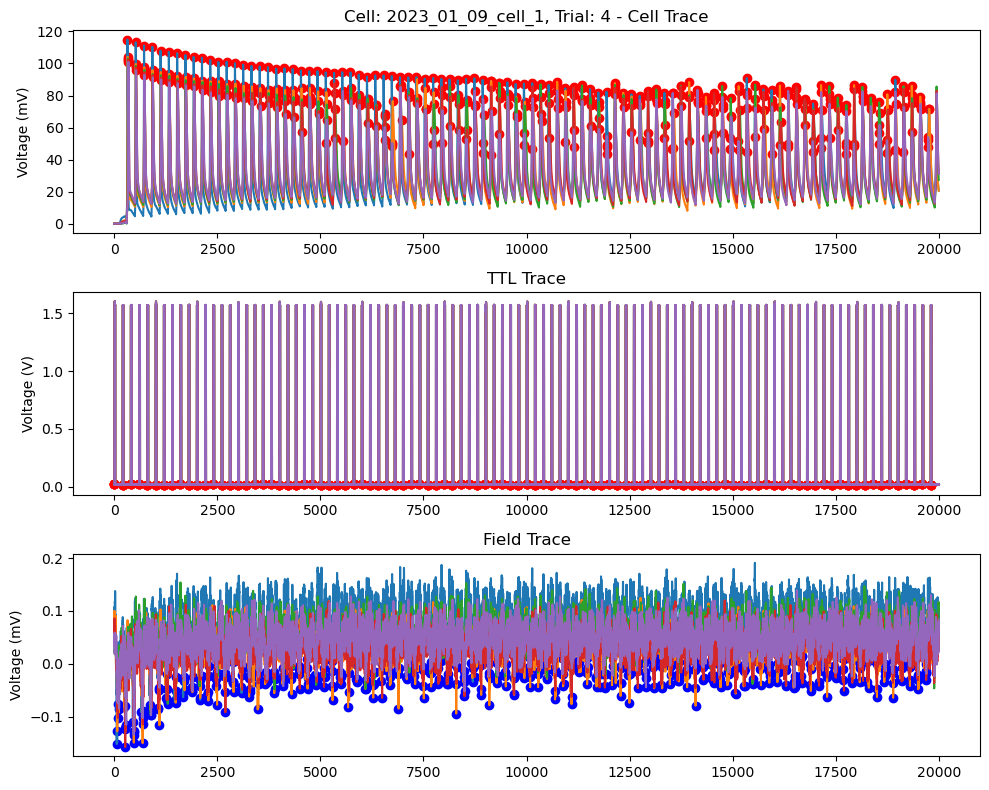

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


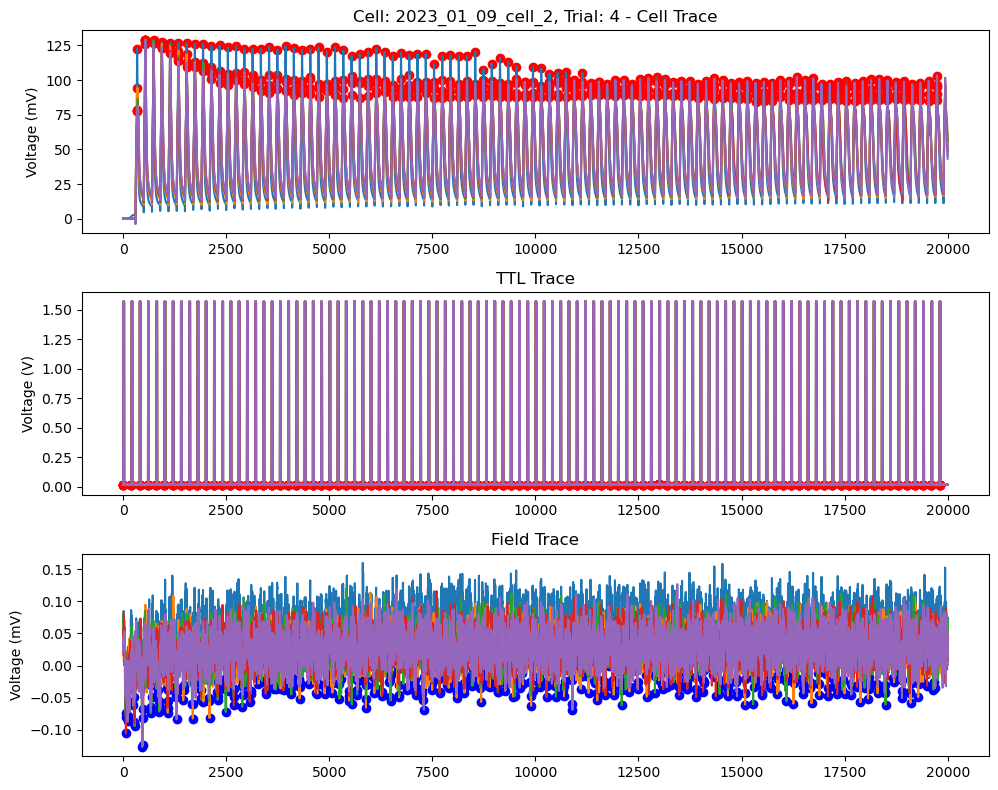

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


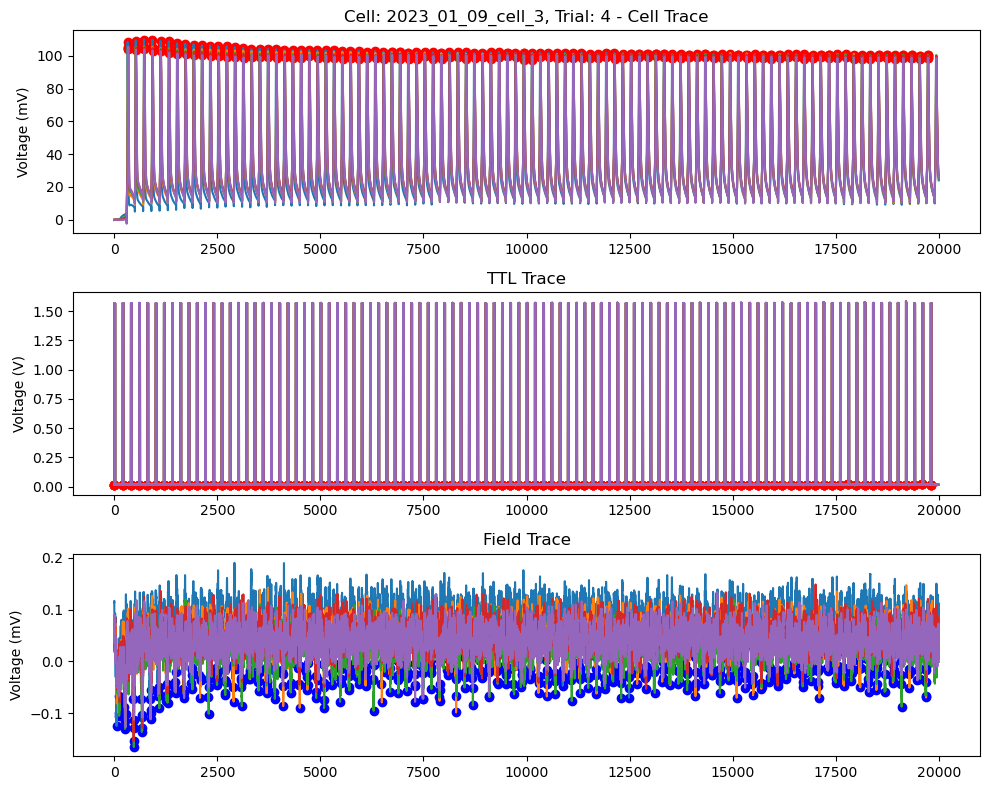

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


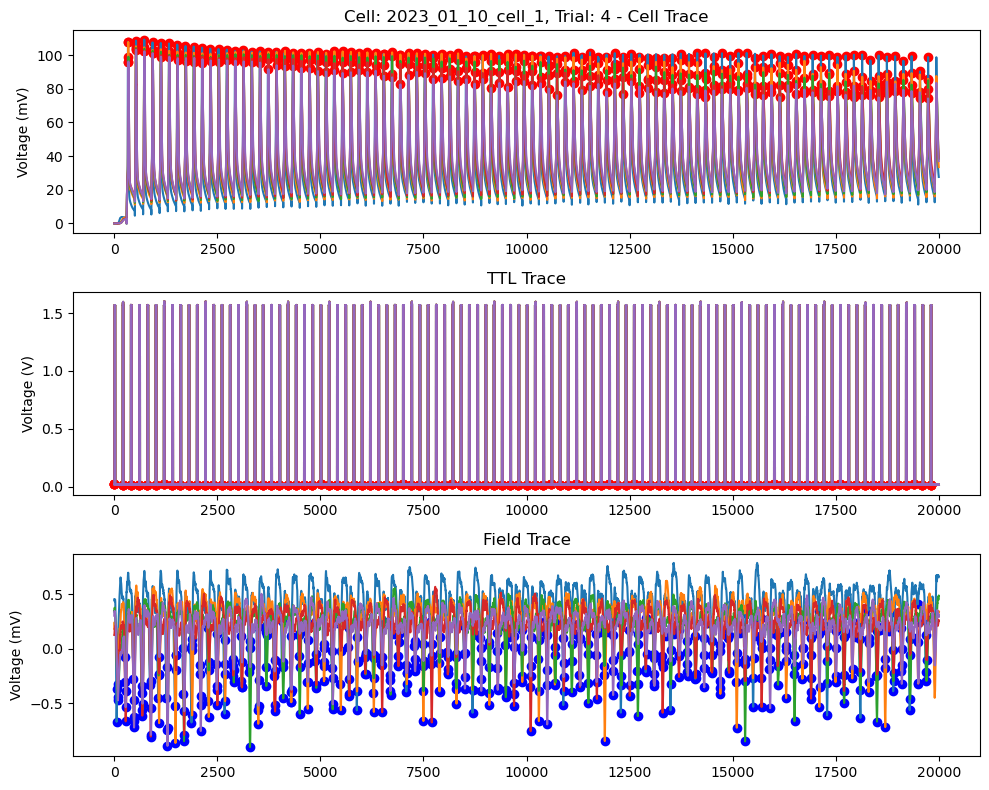

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


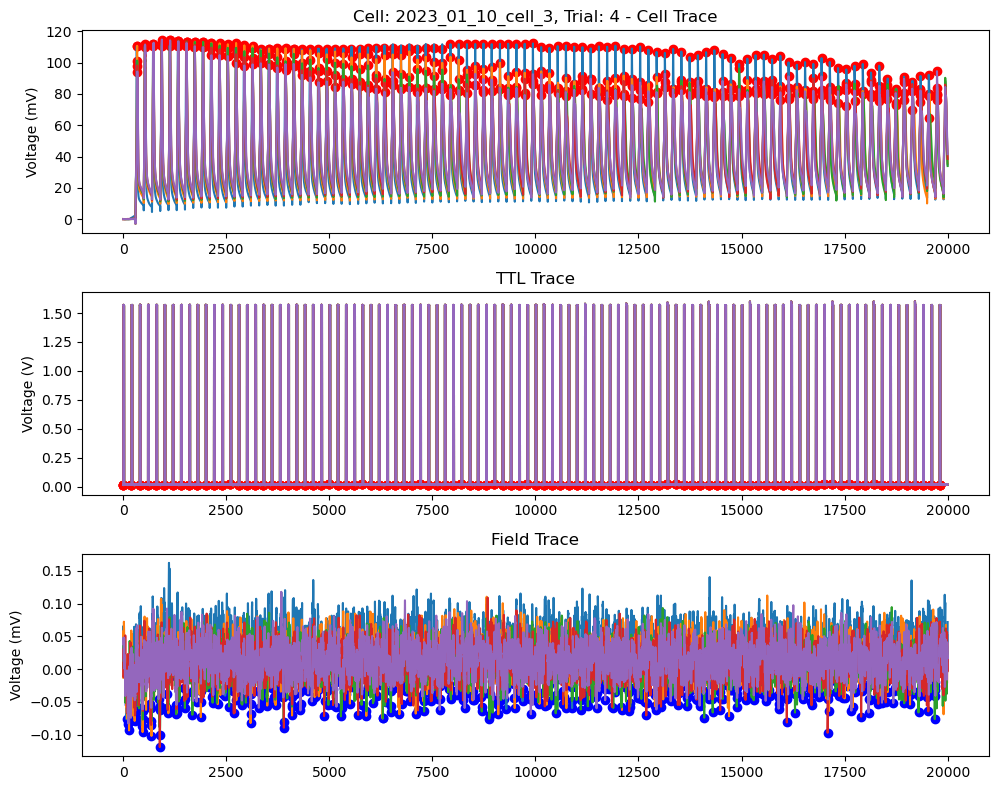

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


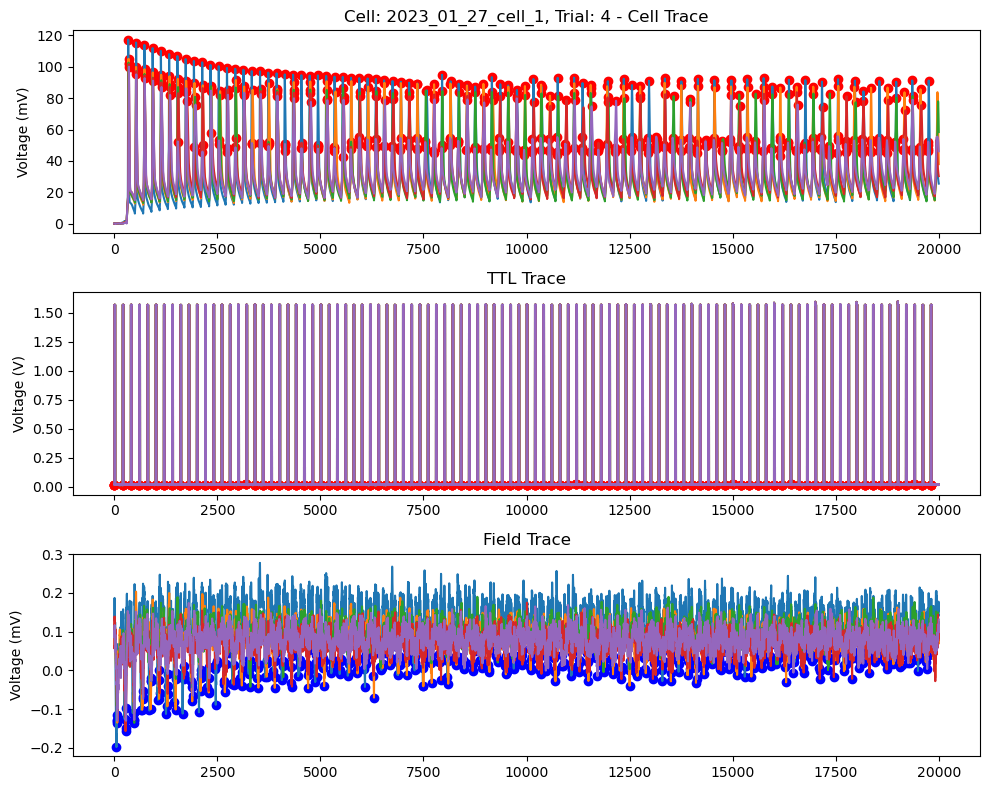

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


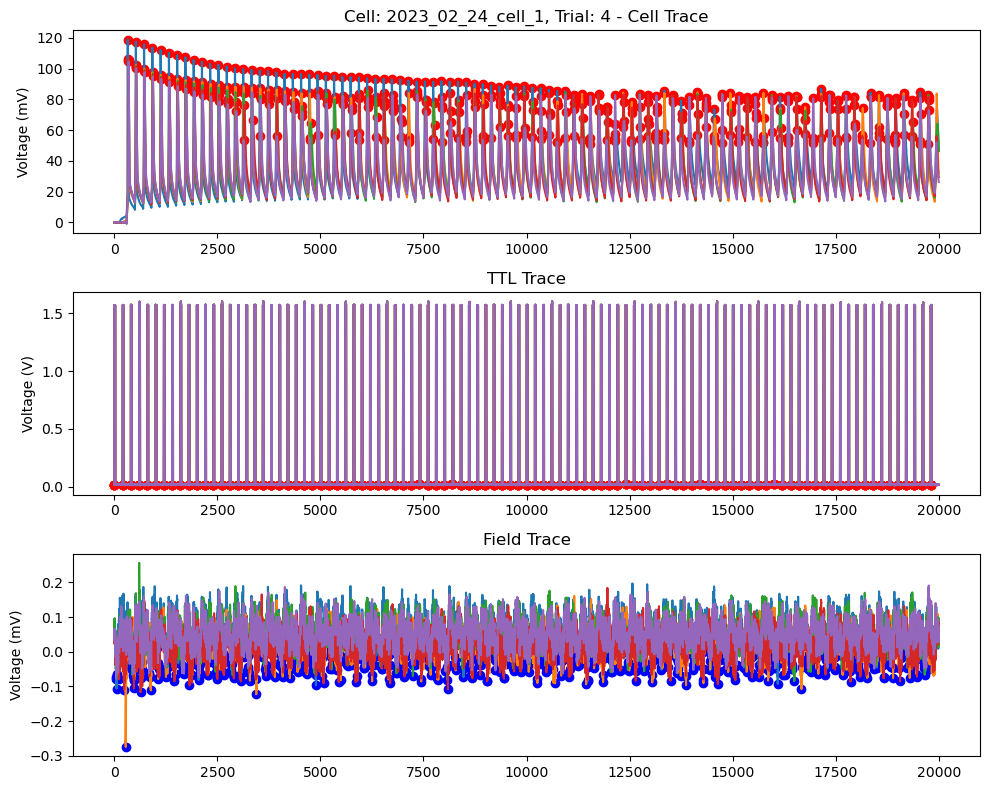

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


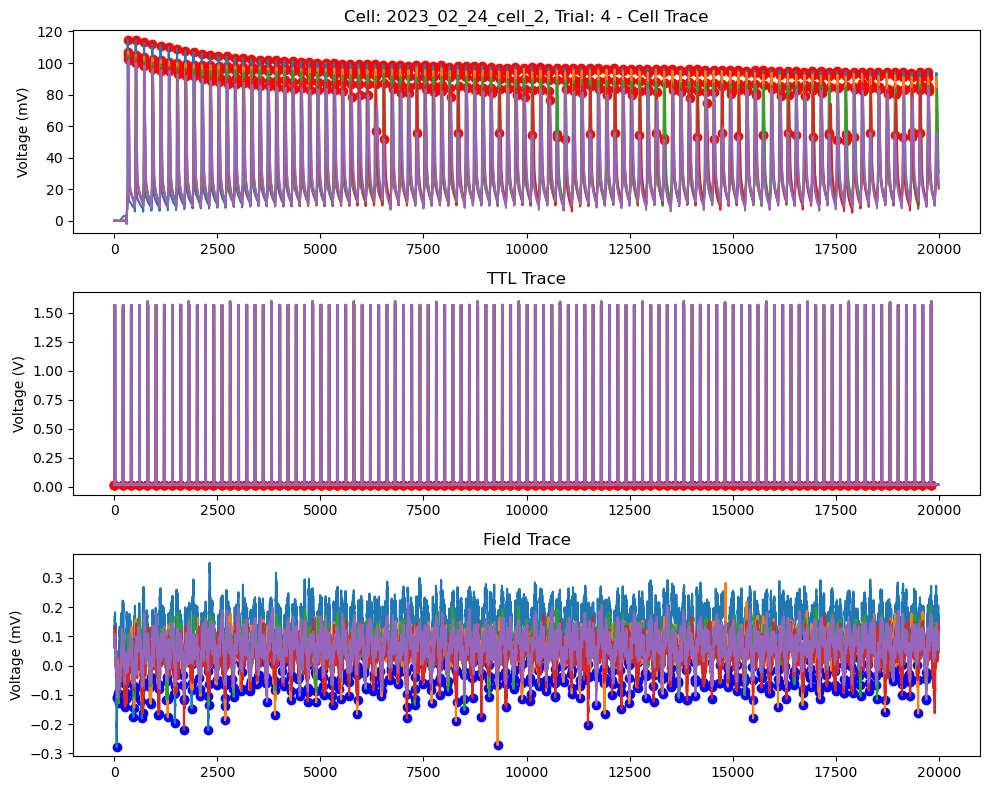

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


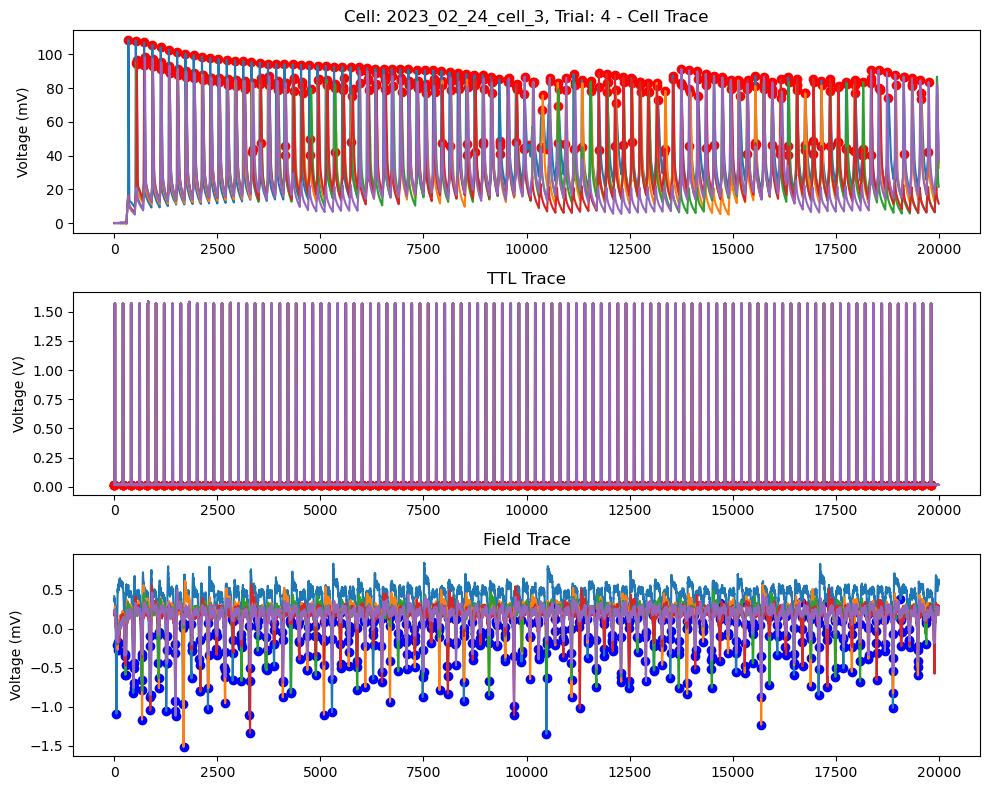

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


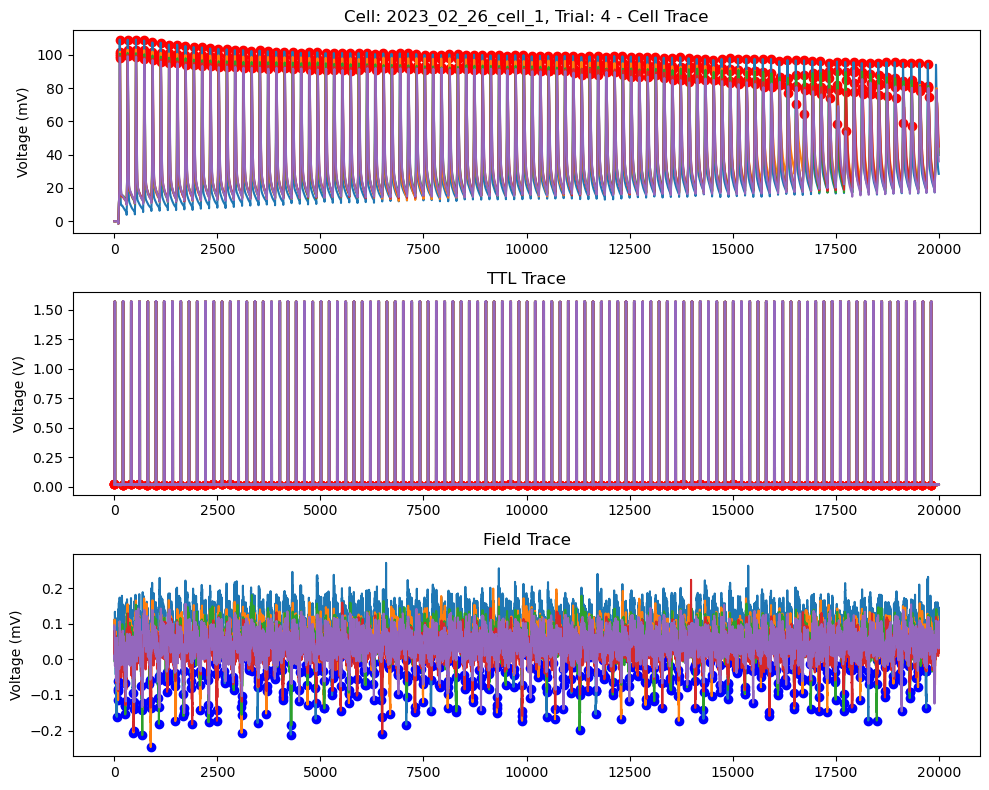

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


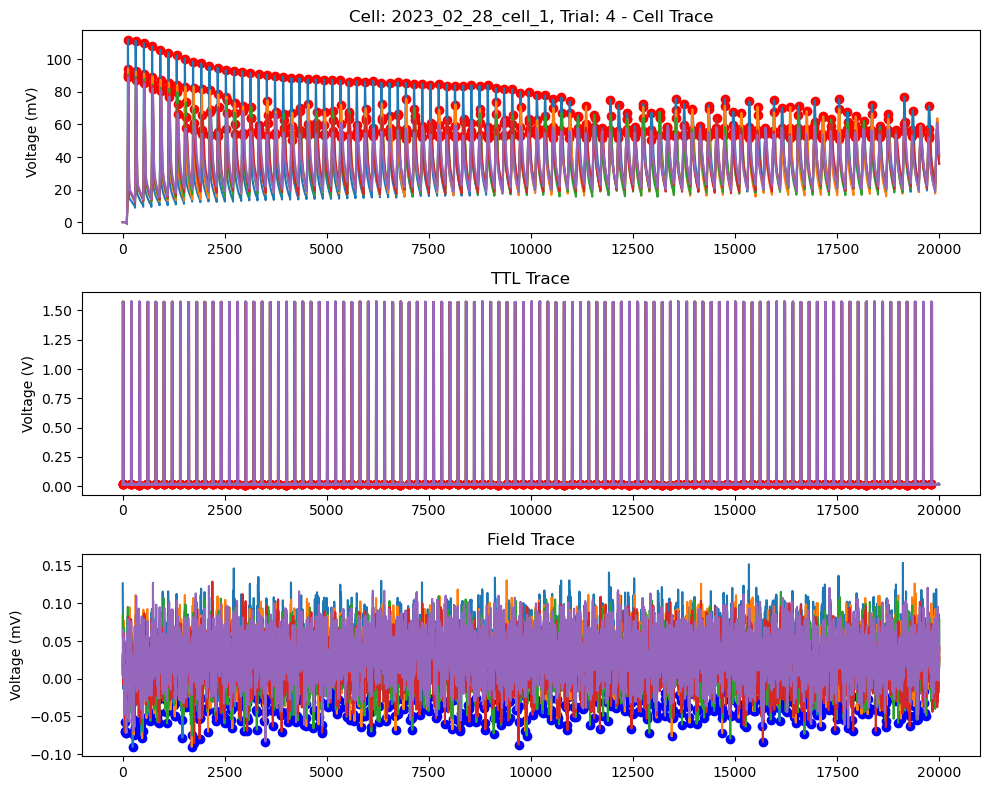

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


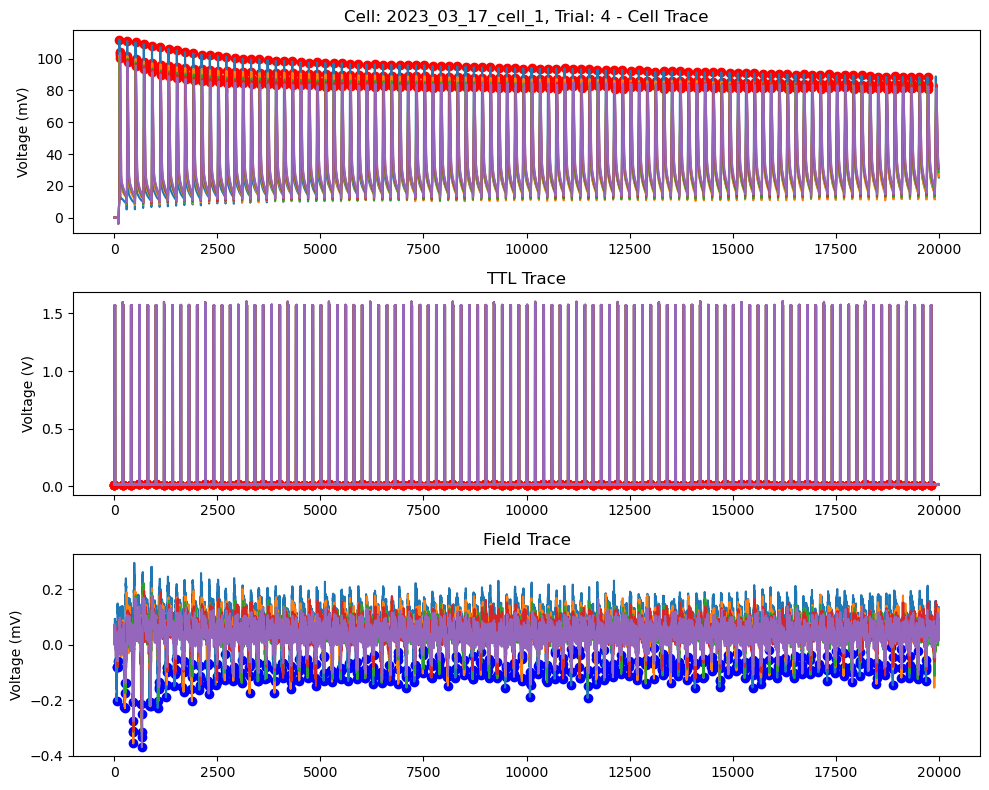

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


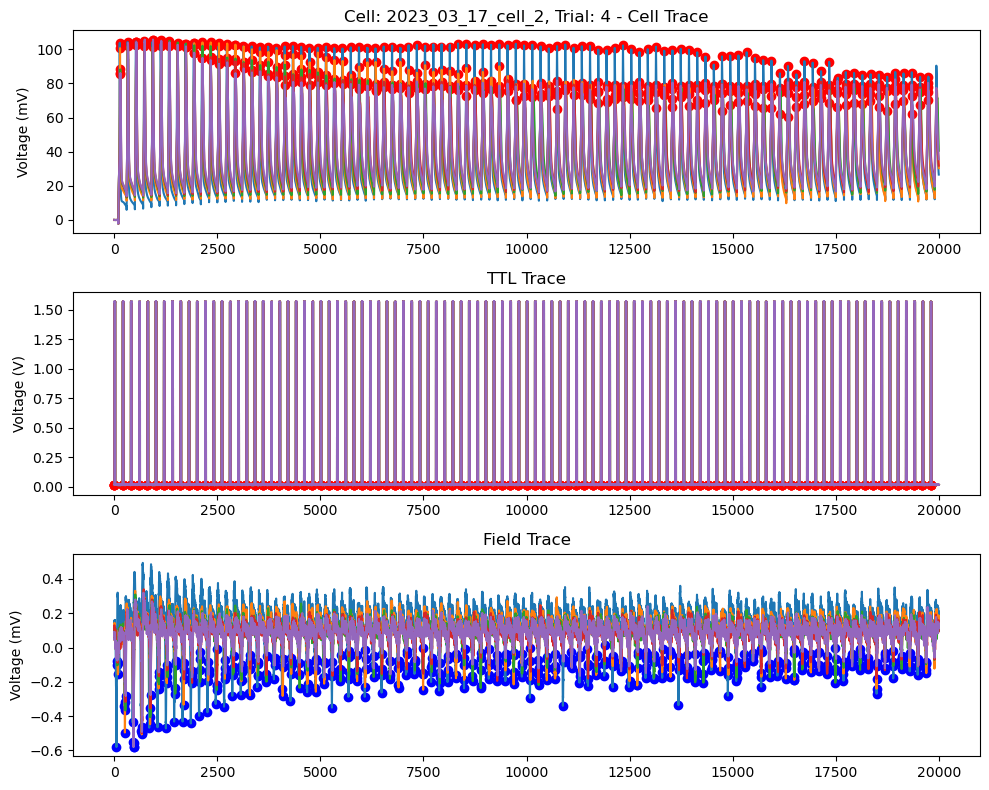

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


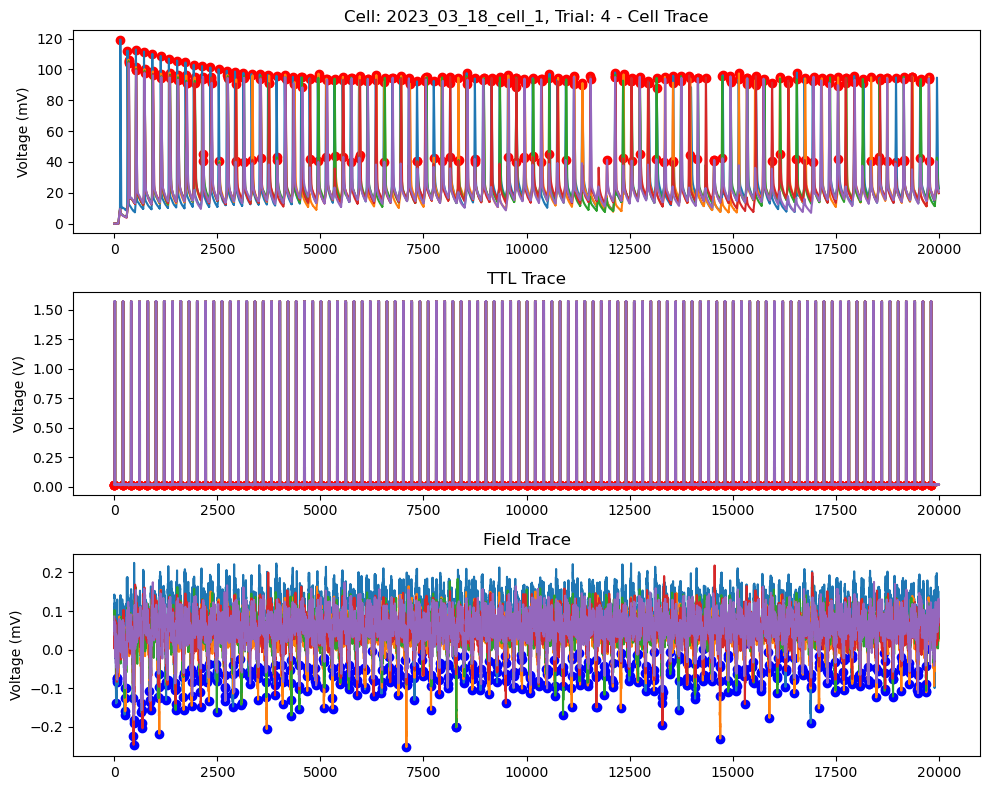

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


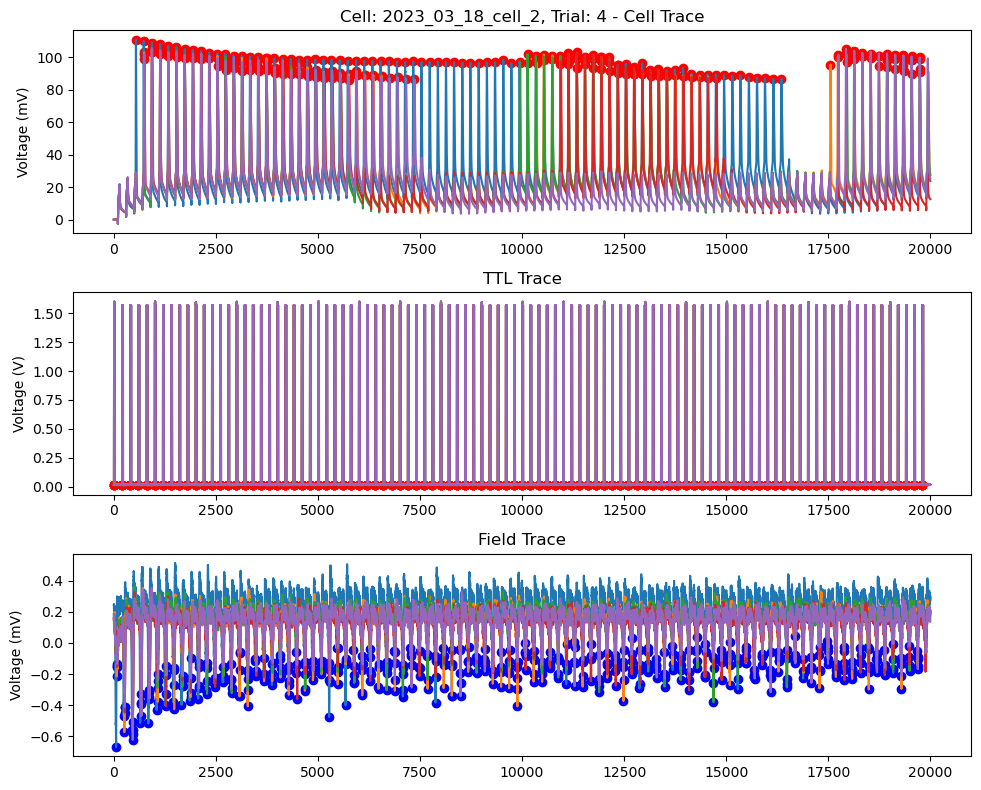

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


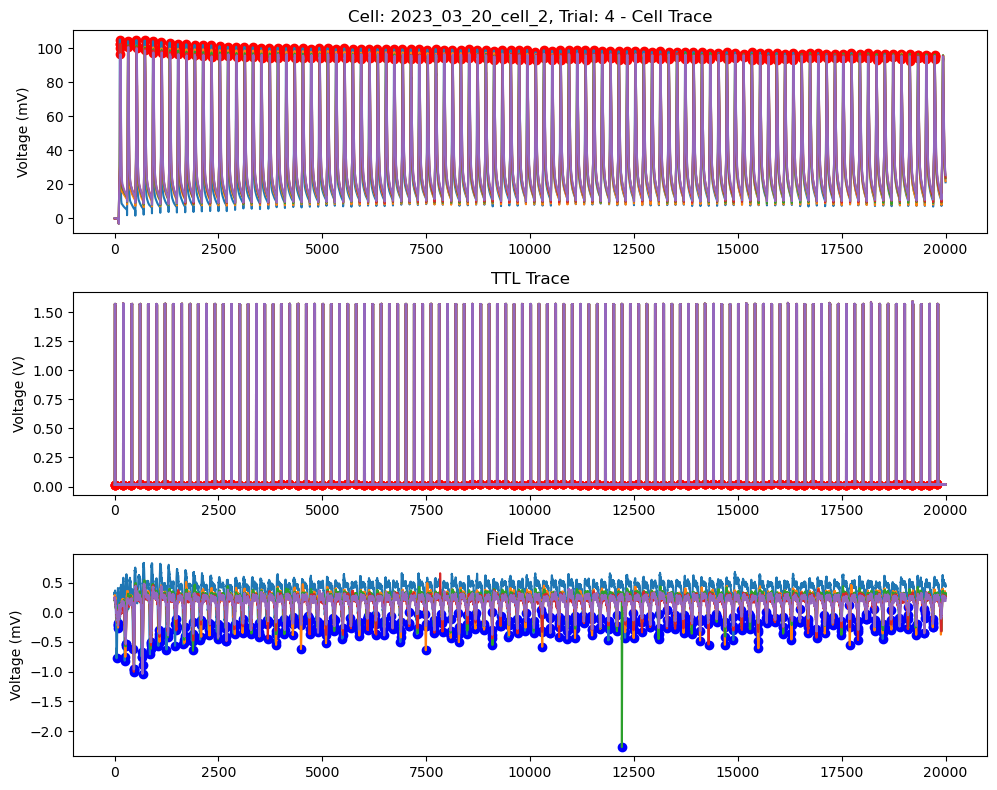

/var/folders/sc/cpss_44j20qbqjd8khtbyldc0000gn/T/ipykernel_19509/2104442406.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sampling_rate = int(cell_data["sampling_rate(Hz)"].unique())


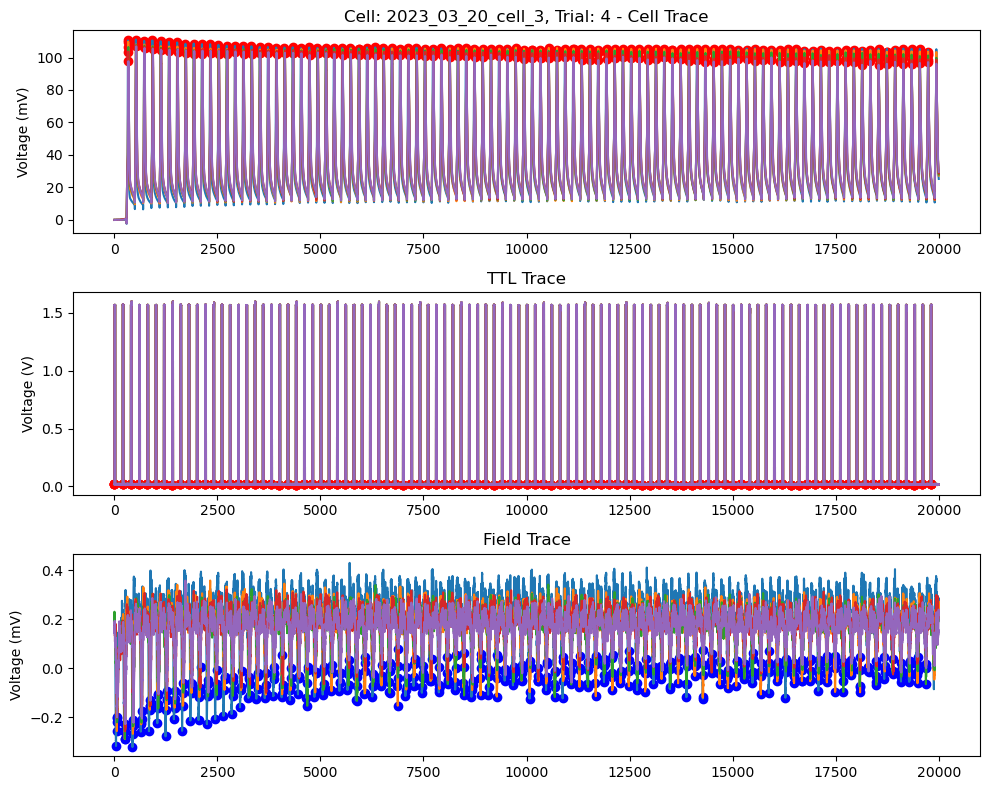

In [67]:
plot_raw_training_data(raw_data_df)

In [88]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import pickle

def subtract_baseline(trace, sampling_rate, bl_period_in_ms):
    bl_period = bl_period_in_ms / 1000
    bl_duration = int(sampling_rate * bl_period)
    bl = np.mean(trace[:bl_duration])
    bl_trace = trace - bl
    return bl_trace

def detect_ttl_rising_edges(ttl_signal, threshold=0.5):
    """Detects the rising edges of the TTL signal based on a threshold."""
    rising_edges = np.where((ttl_signal[:-1] < threshold) & (ttl_signal[1:] >= threshold))[0]
    return rising_edges

def detect_first_spike(trace, ttl_rising_edge, window=200, min_height=40):
    """
    Detect the first spike in the trace after the TTL rising edge within a 10ms (200 points) window.
    Only spikes above both 40 mV and 0 mV will be considered.
    
    Parameters:
    - trace: The voltage trace.
    - ttl_rising_edge: The index where the TTL signal rises.
    - window: The window size (default 200 points) to search for the spike after the TTL rising edge.
    - min_height: The minimum height (in mV) for spikes to be considered (default 40 mV).
    
    Returns:
    - spike_idx: The index of the first detected spike above 40 mV and 0 mV.
    - spike_val: The value of the detected spike.
    """
    if ttl_rising_edge + window < len(trace):  # Ensure we don't go out of bounds
        trace_section = trace[ttl_rising_edge: ttl_rising_edge + window]
        peaks, properties = find_peaks(trace_section, height=min_height)
        if len(peaks) > 0:
            # Return the first peak detected above 40 mV and 0 mV
            for peak_idx in peaks:
                peak_val = trace[peak_idx + ttl_rising_edge]
                if peak_val > 0:  # Ensure the peak is above 0 mV
                    return peak_idx + ttl_rising_edge, peak_val
    return None, None

def detect_most_minimal(field_trace, ttl_rising_edge, window=200):
    """Detect the most minimal value (lowest point) in the field trace after the TTL rising edge within a 10ms (200 points) window."""
    if ttl_rising_edge + window < len(field_trace):  # Ensure we don't go out of bounds
        trace_section = field_trace[ttl_rising_edge: ttl_rising_edge + window]
        if len(trace_section) > 0:
            min_idx = np.argmin(trace_section)  # Find the index of the most minimal value
            minima_val = trace_section[min_idx]
            return min_idx + ttl_rising_edge, minima_val  # Preserve the original index location
    return None, None

def save_plot_data_to_pickle(cell_data, filename="plot_data.pkl"):
    """
    Saves the required plot data into a pickle file, including spike and minima detection results.
    Only saves data where "frame_id" contains "training". Baseline subtraction is applied to all traces.
    
    Parameters:
    cell_data (DataFrame): The input data containing the traces.
    filename (str): The name of the pickle file where the data will be saved.
    """
    plot_data = []
    
    # Filter to include only rows where "frame_id" contains "training"
    cell_data = cell_data[cell_data["frame_id"].str.contains("training", case=False, na=False)]
    
    # Group by cell_ID and trial_no, preserving important information
    cell_grp = cell_data.groupby(by="cell_ID")
    
    for cell, cell_data in cell_grp:
        pre_post_status = cell_data["pre_post_status"].unique()[0]  # Assuming one status per cell
        sampling_rate = int(cell_data["sampling_rate(Hz)"].unique()[0])
        trial_grp = cell_data.groupby(by="trial_no")
        
        for trial, trial_data in trial_grp:
            # Extract trace data and apply baseline subtraction
            trace = trial_data["cell_trace(mV)"].to_numpy()
            trace = subtract_baseline(trace, sampling_rate, 5)
            
            field_trace = trial_data["field_trace(mV)"].to_numpy()
            field_trace = subtract_baseline(field_trace, sampling_rate, 2)
            
            ttl_trace = trial_data["ttl_trace(V)"].to_numpy()
            ttl_trace = subtract_baseline(ttl_trace, sampling_rate, 5)

            # Detect TTL rising edges
            ttl_rising_edges = detect_ttl_rising_edges(ttl_trace)

            # Detect spikes and minima (after baseline subtraction)
            spikes = []
            minimas = []
            for edge in ttl_rising_edges:
                spike_idx, spike_val = detect_first_spike(trace, edge)
                minima_idx, minima_val = detect_most_minimal(field_trace, edge)
                if spike_idx is not None:
                    spikes.append((spike_idx, spike_val))
                if minima_idx is not None:
                    minimas.append((minima_idx, minima_val))

            # Collect all relevant information for this trial
            plot_data.append({
                'cell_ID': cell,
                'pre_post_status': pre_post_status,
                'trial_no': trial,
                'sampling_rate': sampling_rate,
                'cell_trace': trace,
                'field_trace': field_trace,
                'ttl_trace': ttl_trace,
                'ttl_rising_edges': ttl_rising_edges,
                'spikes': spikes,
                'minimas': minimas
            })
    
    # Save the plot data to a pickle file
    with open(filename, 'wb') as f:
        pickle.dump(plot_data, f)
    
    print(f"Plot data saved to {filename}")

In [89]:
save_plot_data_to_pickle(raw_data_df, filename="plot_data.pkl")

Plot data saved to plot_data.pkl


In [27]:
def plot_from_pickle(filename="plot_data.pkl", plot_limit=None):
    """
    Loads plot data from a pickle file and generates the plot, including spikes and minima.
    
    Parameters:
    filename (str): The name of the pickle file to load the data from.
    plot_limit (int or None): The number of points to plot. If None, plot the entire data.
    """
    # Load the plot data from the pickle file
    with open(filename, 'rb') as f:
        plot_data = pickle.load(f)
    
    fig, axs = plt.subplots(3, 1, figsize=(10, 8))  # Create a single plot for all cells

    for data in plot_data:
        cell_ID = data['cell_ID']
        trial_no = data['trial_no']
        trace = data['cell_trace']
        field_trace = data['field_trace']
        ttl_trace = data['ttl_trace']
        ttl_rising_edges = data['ttl_rising_edges']
        spikes = data['spikes']
        minimas = data['minimas']

        # Define the range to plot
        if plot_limit is not None:
            trace_range = plot_limit
        else:
            trace_range = len(trace)
        
        # Plot TTL, trace, and field trace with alpha of 0.2
        axs[1].plot(ttl_trace[:trace_range], alpha=0.2, label=f'Cell {cell_ID}, Trial {trial_no}')
        axs[0].plot(trace[:trace_range], alpha=0.2)
        axs[2].plot(field_trace[:trace_range], alpha=0.2)

        # Plot TTL rising edges
        for edge in ttl_rising_edges:
            if edge < trace_range:
                axs[1].scatter(edge, ttl_trace[edge], color='red', alpha=0.2, label='TTL Rising Edge')

        # Plot spikes
        for spike_idx, spike_val in spikes:
            if spike_idx < trace_range:
                axs[0].scatter(spike_idx, spike_val, color='red', alpha=0.2, label='Spike Peak')

        # Plot minimas
        for minima_idx, minima_val in minimas:
            if minima_idx < trace_range:
                axs[2].scatter(minima_idx, minima_val, color='blue', alpha=0.2, label='Field Minima')

    # Label and show the plot
    axs[0].set_title("All Cells - Cell Trace")
    axs[0].set_ylabel("Voltage (mV)")
    axs[1].set_title("TTL Trace")
    axs[1].set_ylabel("Voltage (V)")
    axs[2].set_title("Field Trace")
    axs[2].set_ylabel("Voltage (mV)")
    
    plt.tight_layout()
    plt.show()

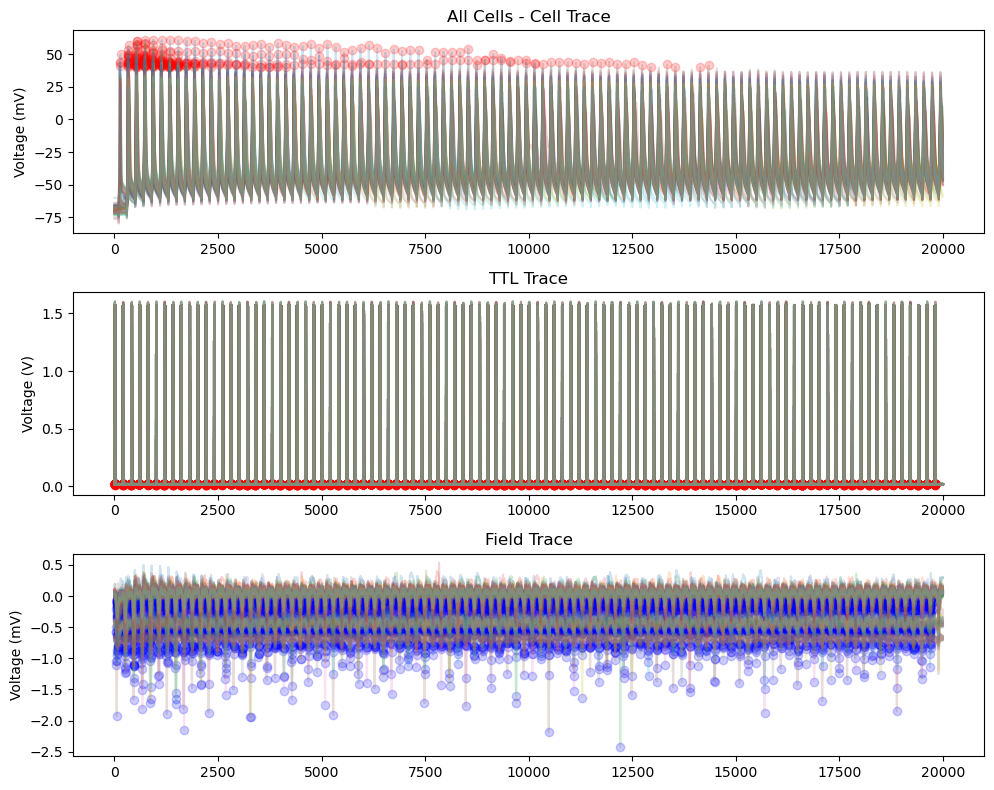

In [83]:
plot_from_pickle(filename="plot_data.pkl", plot_limit=None)

In [90]:
def plot_from_pickle(filename="plot_data.pkl", plot_limit=None):
    """
    Loads plot data from a pickle file and generates the plot, including spikes and minima.
    
    Parameters:
    filename (str): The name of the pickle file to load the data from.
    plot_limit (int or None): The number of points to plot. If None, plot the entire data.
    """
    # Load the plot data from the pickle file
    with open(filename, 'rb') as f:
        plot_data = pickle.load(f)
    
    fig, axs = plt.subplots(3, 1, figsize=(10, 8))  # Create a single plot for all cells

    all_ttl_traces = []
    all_cell_traces = []
    all_field_traces = []
    
    ttl_rising_edge_points = []
    spike_points = []
    minima_points = []

    # Loop over the plot data to gather data points for efficient plotting
    for data in plot_data:
        cell_ID = data['cell_ID']
        trial_no = data['trial_no']
        trace = data['cell_trace']
        field_trace = data['field_trace']
        ttl_trace = data['ttl_trace']
        ttl_rising_edges = data['ttl_rising_edges']
        spikes = data['spikes']
        minimas = data['minimas']

        # Define the range to plot
        if plot_limit is not None:
            trace_range = plot_limit
        else:
            trace_range = len(trace)
        
        # Accumulate traces for all cells and trials for faster plotting
        all_ttl_traces.append(ttl_trace[:trace_range])
        all_cell_traces.append(trace[:trace_range])
        all_field_traces.append(field_trace[:trace_range])

        # Accumulate points for spikes, minima, and TTL rising edges
        for edge in ttl_rising_edges:
            if edge < trace_range:
                ttl_rising_edge_points.append((edge, ttl_trace[edge]))

        for spike_idx, spike_val in spikes:
            if spike_idx < trace_range:
                spike_points.append((spike_idx, spike_val))

        for minima_idx, minima_val in minimas:
            if minima_idx < trace_range:
                minima_points.append((minima_idx, minima_val))

    # Plot accumulated traces for TTL, cell, and field data
    for ttl_trace in all_ttl_traces:
        axs[1].plot(ttl_trace, alpha=0.2)
        
    for cell_trace in all_cell_traces:
        axs[0].plot(cell_trace, alpha=0.2)

    for field_trace in all_field_traces:
        axs[2].plot(field_trace, alpha=0.2)

    # Unpack and plot scatter points for TTL rising edges, spikes, and minima
    if ttl_rising_edge_points:
        x, y = zip(*ttl_rising_edge_points)
        axs[1].scatter(x, y, color='red', alpha=0.2, label='TTL Rising Edge')

    if spike_points:
        x, y = zip(*spike_points)
        axs[0].scatter(x, y, color='red', alpha=0.2, label='Spike Peak')

    if minima_points:
        x, y = zip(*minima_points)
        axs[2].scatter(x, y, color='blue', alpha=0.2, label='Field Minima')

    # Label and show the plot
    axs[0].set_title("All Cells - Cell Trace")
    axs[0].set_ylabel("Voltage (mV)")
    axs[1].set_title("TTL Trace")
    axs[1].set_ylabel("Voltage (V)")
    axs[2].set_title("Field Trace")
    axs[2].set_ylabel("Voltage (mV)")
    
    plt.tight_layout()
    plt.show()

In [11]:
import pickle
import matplotlib.pyplot as plt
import numpy as np

def plot_from_pickle(filename="plot_data.pkl", plot_limit=None):
    """
    Loads plot data from a pickle file and generates the plot, including spikes, minima, and an overlaid pointplot.
    
    Parameters:
    filename (str): The name of the pickle file to load the data from.
    plot_limit (int or None): The number of points to plot. If None, plot the entire data.
    """
    # Load the plot data from the pickle file
    with open(filename, 'rb') as f:
        plot_data = pickle.load(f)
    
    fig, axs = plt.subplots(3, 1, figsize=(10, 8))  # Create a single plot for all cells

    all_ttl_traces = []
    all_cell_traces = []
    all_field_traces = []
    
    ttl_rising_edge_points = []
    spike_points = []
    minima_points = []

    # Loop over the plot data to gather data points for efficient plotting
    for data in plot_data:
        cell_ID = data['cell_ID']
        trial_no = data['trial_no']
        trace = data['cell_trace']
        field_trace = data['field_trace']
        ttl_trace = data['ttl_trace']
        ttl_rising_edges = data['ttl_rising_edges']
        spikes = data['spikes']
        minimas = data['minimas']

        # Define the range to plot
        if plot_limit is not None:
            trace_range = plot_limit
        else:
            trace_range = len(trace)
        
        # Accumulate traces for all cells and trials for faster plotting
        all_ttl_traces.append(ttl_trace[:trace_range])
        all_cell_traces.append(trace[:trace_range])
        all_field_traces.append(field_trace[:trace_range])

        # Accumulate points for spikes, minima, and TTL rising edges
        for edge in ttl_rising_edges:
            if edge < trace_range:
                ttl_rising_edge_points.append((edge, ttl_trace[edge]))

        for spike_idx, spike_val in spikes:
            if spike_idx < trace_range:
                spike_points.append((spike_idx, spike_val))

        for minima_idx, minima_val in minimas:
            if minima_idx < trace_range:
                minima_points.append((minima_idx, minima_val))

    # Plot accumulated traces for TTL, cell, and field data
    for ttl_trace in all_ttl_traces:
        axs[1].plot(ttl_trace, alpha=0.2)
        
    for cell_trace in all_cell_traces:
        axs[0].plot(cell_trace, alpha=0.2)

    for field_trace in all_field_traces:
        axs[2].plot(field_trace, alpha=0.2)

    # Unpack and plot scatter points for TTL rising edges, spikes, and minima
    if ttl_rising_edge_points:
        x, y = zip(*ttl_rising_edge_points)
        axs[1].scatter(x, y, color='red', alpha=0.2, label='TTL Rising Edge')

    if spike_points:
        x, y = zip(*spike_points)
        axs[0].scatter(x, y, color='red', alpha=0.2, label='Spike Peak')

    if minima_points:
        x, y = zip(*minima_points)
        axs[2].scatter(x, y, color='blue', alpha=0.2, label='Field Minima')

    # Create point plots (averages) and overlay them for only the first, middle, and last points
    def overlay_pointplot(ax, data_points, color='black'):
        """
        Overlays a point plot on the given axes with the first, middle, and last data points,
        using nearby 50 points on x-axis to calculate the average and standard deviation.
        """
        if data_points:
            x, y = zip(*data_points)
            unique_x = sorted(set(x))

            if len(unique_x) >= 50:
                # Define ranges for first, middle, and last point groups
                first_range = unique_x[:50]
                middle_range = unique_x[len(unique_x) // 2 - 25 : len(unique_x) // 2 + 25]
                last_range = unique_x[-50:]

                selected_ranges = [first_range, middle_range, last_range]

                for selected_x in selected_ranges:
                    avg_y = [np.mean([y[i] for i in range(len(x)) if x[i] in selected_x])]
                    std_y = [np.std([y[i] for i in range(len(x)) if x[i] in selected_x])]

                    # Plot using the midpoint of the range for x and the calculated average for y
                    midpoint_x = np.mean(selected_x)
                    midpoint_y = np.mean(avg_y)
                    error_y = np.mean(std_y)
                    
                    # Overlay point plot with error bars (std)
                    ax.errorbar(midpoint_x, midpoint_y, yerr=error_y, fmt='o', color=color, label='Average with STD', capsize=5)

    # Overlay point plots on each axis
    overlay_pointplot(axs[0], spike_points, color='green')  # Point plot for spikes
    overlay_pointplot(axs[1], ttl_rising_edge_points, color='purple')  # Point plot for TTL rising edges
    overlay_pointplot(axs[2], minima_points, color='orange')  # Point plot for minima

    # Label and show the plot
    axs[0].set_title("All Cells - Cell Trace with Overlayed Point Plot")
    axs[0].set_ylabel("Voltage (mV)")
    axs[1].set_title("TTL Trace")
    axs[1].set_ylabel("Voltage (V)")
    axs[2].set_title("Field Trace")
    axs[2].set_ylabel("Voltage (mV)")

    
    plt.tight_layout()
    plt.show()


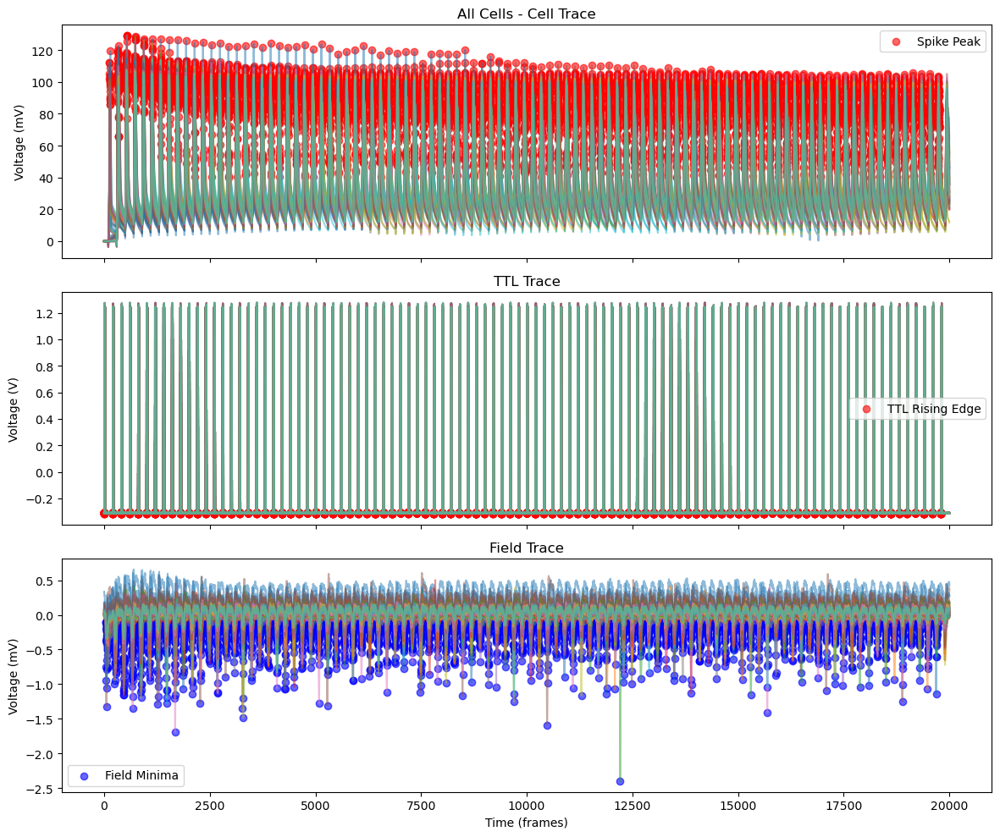

In [28]:
import pickle
import matplotlib.pyplot as plt

def plot_from_pickle(filename="plot_data.pkl", plot_limit=None):
    """
    Loads plot data from a pickle file and generates the plot, including spikes and minima.

    Parameters:
    filename (str): The name of the pickle file to load the data from.
    plot_limit (int or None): The number of points to plot. If None, plot the entire data.
    """
    try:
        # Load the plot data from the pickle file
        with open(filename, 'rb') as f:
            plot_data = pickle.load(f)
    except FileNotFoundError:
        print(f"Error: File '{filename}' not found.")
        return
    except Exception as e:
        print(f"Error loading data: {e}")
        return

    fig, axs = plt.subplots(3, 1, figsize=(12, 10), sharex=True)
    
    # Set titles and labels outside the loop
    axs[0].set_title("All Cells - Cell Trace")
    axs[0].set_ylabel("Voltage (mV)")
    axs[1].set_title("TTL Trace")
    axs[1].set_ylabel("Voltage (V)")
    axs[2].set_title("Field Trace")
    axs[2].set_ylabel("Voltage (mV)")
    axs[2].set_xlabel("Time (frames)")

    # Loop over the data for each cell
    for data in plot_data:
        cell_ID = data['cell_ID']
        trial_no = data['trial_no']
        trace = data['cell_trace']
        field_trace = data['field_trace']
        ttl_trace = data['ttl_trace']
        ttl_rising_edges = data['ttl_rising_edges']
        spikes = data['spikes']
        minimas = data['minimas']

        # Define the range to plot
        trace_range = plot_limit if plot_limit is not None else len(trace)

        # Plot the main traces with alpha transparency
        axs[0].plot(trace[:trace_range], alpha=0.5)
        axs[1].plot(ttl_trace[:trace_range], alpha=0.5)
        axs[2].plot(field_trace[:trace_range], alpha=0.5)

        # Plot TTL rising edges, spikes, and minimas
        axs[1].scatter(ttl_rising_edges, [ttl_trace[i] for i in ttl_rising_edges if i < trace_range],
                       color='red', alpha=0.6, label='TTL Rising Edge' if 'TTL Rising Edge' not in axs[1].get_legend_handles_labels()[1] else "")
        
        axs[0].scatter(*zip(*[(i, v) for i, v in spikes if i < trace_range]), 
                       color='red', alpha=0.6, label='Spike Peak' if 'Spike Peak' not in axs[0].get_legend_handles_labels()[1] else "")

        axs[2].scatter(*zip(*[(i, v) for i, v in minimas if i < trace_range]), 
                       color='blue', alpha=0.6, label='Field Minima' if 'Field Minima' not in axs[2].get_legend_handles_labels()[1] else "")
    
    # Show legends only once
    for ax in axs:
        if ax.get_legend_handles_labels()[1]:
            ax.legend()

    plt.tight_layout()
    plt.show()
plot_from_pickle(filename="plot_data.pkl", plot_limit=None)

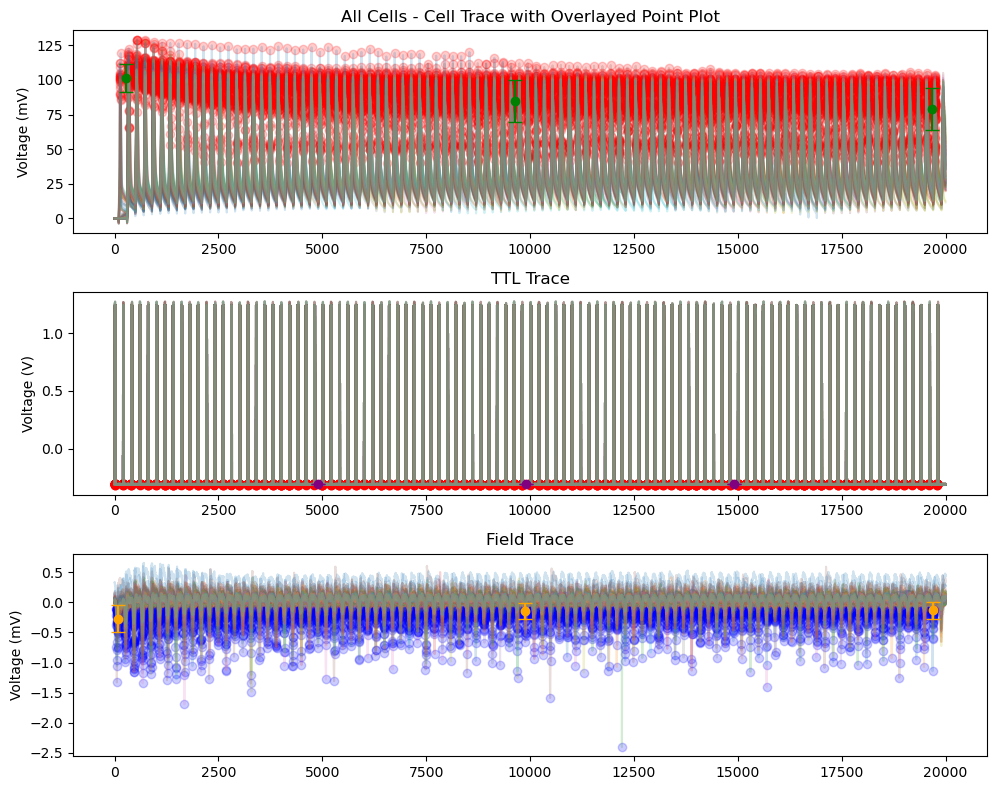

In [20]:
plot_from_pickle(filename="plot_data.pkl", plot_limit=None)

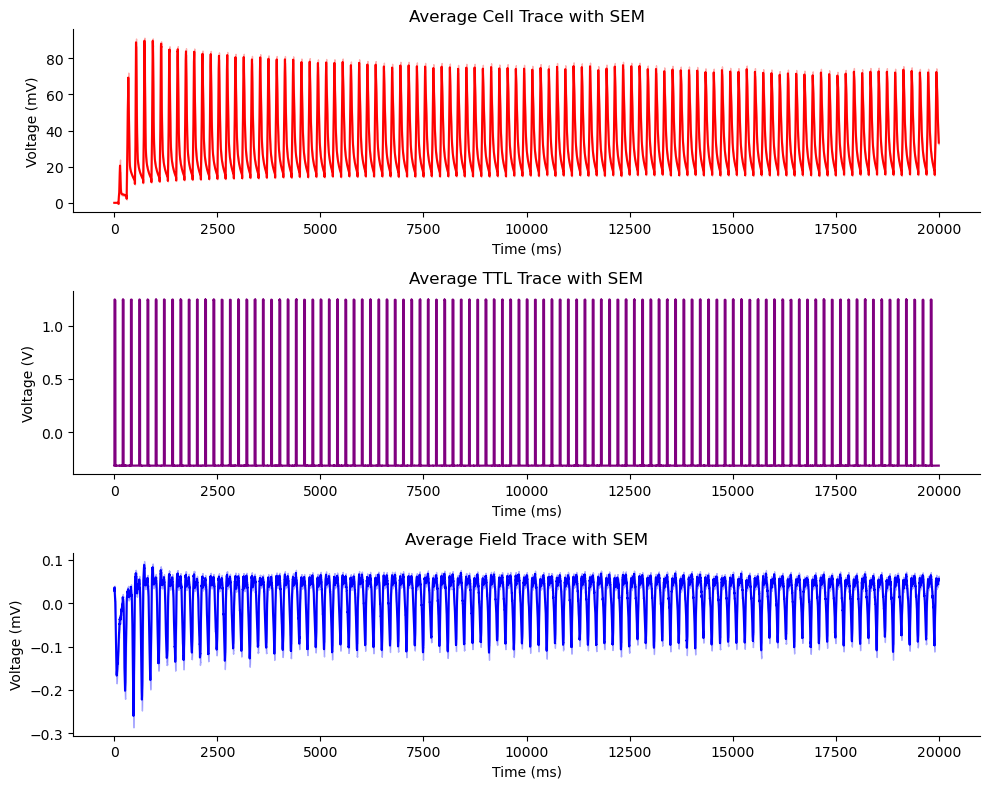

In [13]:
import pickle
import matplotlib.pyplot as plt
import numpy as np

def plot_average_with_sem(filename="plot_data.pkl", plot_limit=None):
    """
    Loads plot data from a pickle file and generates the plot, including the average trace with SEM.
    
    Parameters:
    filename (str): The name of the pickle file to load the data from.
    plot_limit (int or None): The number of points to plot. If None, plot the entire data.
    """
    # Load the plot data from the pickle file
    with open(filename, 'rb') as f:
        plot_data = pickle.load(f)
    
    fig, axs = plt.subplots(3, 1, figsize=(10, 8))  # Create subplots for each trace type

    all_ttl_traces = []
    all_cell_traces = []
    all_field_traces = []

    # Loop over the plot data to gather data points for averaging
    for data in plot_data:
        cell_trace = data['cell_trace']
        field_trace = data['field_trace']
        ttl_trace = data['ttl_trace']

        # Define the range to plot
        if plot_limit is not None:
            trace_range = plot_limit
        else:
            trace_range = len(cell_trace)
        
        # Accumulate traces for averaging
        all_ttl_traces.append(ttl_trace[:trace_range])
        all_cell_traces.append(cell_trace[:trace_range])
        all_field_traces.append(field_trace[:trace_range])

    def plot_with_sem(ax, traces, color, label):
        """
        Plots the average trace with SEM as a shaded region.
        """
        traces = np.array(traces)
        mean_trace = np.mean(traces, axis=0)
        sem_trace = np.std(traces, axis=0) / np.sqrt(traces.shape[0])
        
        # Plot the average trace
        ax.plot(mean_trace, color=color, label=label)
        
        # Plot the SEM as a shaded region
        ax.fill_between(range(len(mean_trace)), 
                        mean_trace - sem_trace, 
                        mean_trace + sem_trace, 
                        color=color, alpha=0.3)

    # Plot for cell, TTL, and field traces
    plot_with_sem(axs[0], all_cell_traces, color='red', label='Cell Trace')
    axs[0].set_title("Average Cell Trace with SEM")
    axs[0].set_ylabel("Voltage (mV)")

    plot_with_sem(axs[1], all_ttl_traces, color='purple', label='TTL Trace')
    axs[1].set_title("Average TTL Trace with SEM")
    axs[1].set_ylabel("Voltage (V)")

    plot_with_sem(axs[2], all_field_traces, color='blue', label='Field Trace')
    axs[2].set_title("Average Field Trace with SEM")
    axs[2].set_ylabel("Voltage (mV)")

    # Set common labels and layout
    for ax in axs:
        ax.spines[['right', 'top']].set_visible(False)
        ax.set_xlabel("Time (ms)")
    
    plt.tight_layout()
    plt.show()

# Run the function with your desired pickle file
plot_average_with_sem(filename="plot_data.pkl")


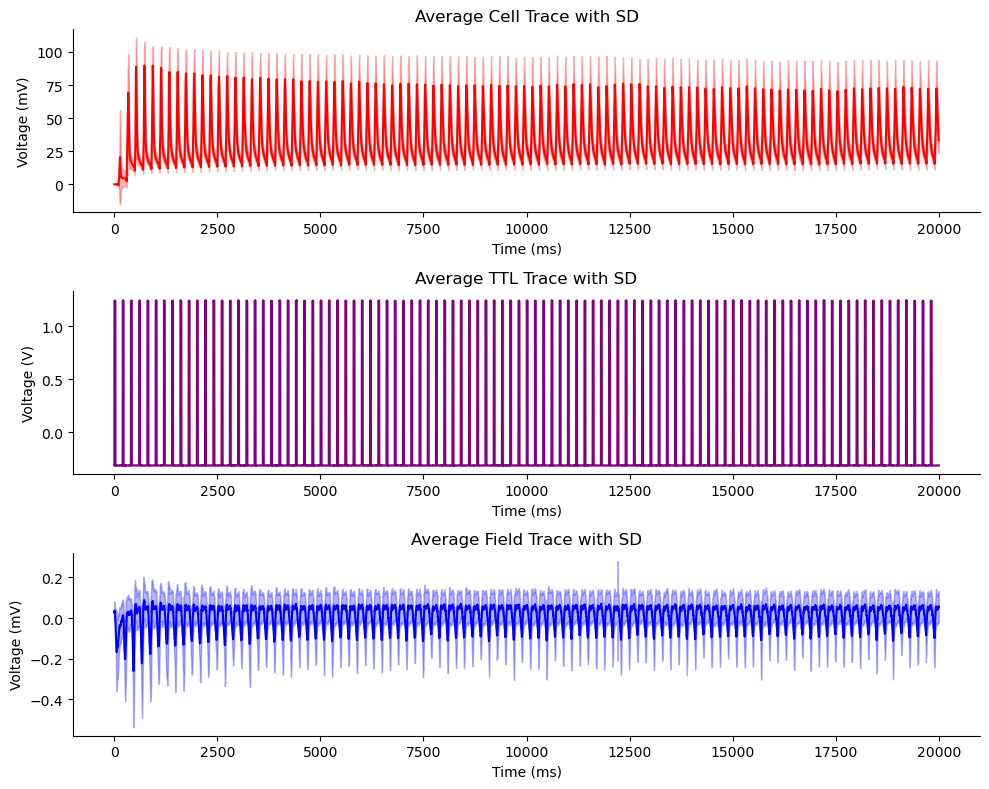

In [14]:
import pickle
import matplotlib.pyplot as plt
import numpy as np

def plot_average_with_sd(filename="plot_data.pkl", plot_limit=None):
    """
    Loads plot data from a pickle file and generates the plot, including the average trace with SD.
    
    Parameters:
    filename (str): The name of the pickle file to load the data from.
    plot_limit (int or None): The number of points to plot. If None, plot the entire data.
    """
    # Load the plot data from the pickle file
    with open(filename, 'rb') as f:
        plot_data = pickle.load(f)
    
    fig, axs = plt.subplots(3, 1, figsize=(10, 8))  # Create subplots for each trace type

    all_ttl_traces = []
    all_cell_traces = []
    all_field_traces = []

    # Loop over the plot data to gather data points for averaging
    for data in plot_data:
        cell_trace = data['cell_trace']
        field_trace = data['field_trace']
        ttl_trace = data['ttl_trace']

        # Define the range to plot
        if plot_limit is not None:
            trace_range = plot_limit
        else:
            trace_range = len(cell_trace)
        
        # Accumulate traces for averaging
        all_ttl_traces.append(ttl_trace[:trace_range])
        all_cell_traces.append(cell_trace[:trace_range])
        all_field_traces.append(field_trace[:trace_range])

    def plot_with_sd(ax, traces, color, label):
        """
        Plots the average trace with SD as a shaded region.
        """
        traces = np.array(traces)
        mean_trace = np.mean(traces, axis=0)
        sd_trace = np.std(traces, axis=0)
        
        # Plot the average trace
        ax.plot(mean_trace, color=color, label=label)
        
        # Plot the SD as a shaded region
        ax.fill_between(range(len(mean_trace)), 
                        mean_trace - sd_trace, 
                        mean_trace + sd_trace, 
                        color=color, alpha=0.3)

    # Plot for cell, TTL, and field traces
    plot_with_sd(axs[0], all_cell_traces, color='red', label='Cell Trace')
    axs[0].set_title("Average Cell Trace with SD")
    axs[0].set_ylabel("Voltage (mV)")

    plot_with_sd(axs[1], all_ttl_traces, color='purple', label='TTL Trace')
    axs[1].set_title("Average TTL Trace with SD")
    axs[1].set_ylabel("Voltage (V)")

    plot_with_sd(axs[2], all_field_traces, color='blue', label='Field Trace')
    axs[2].set_title("Average Field Trace with SD")
    axs[2].set_ylabel("Voltage (mV)")

    # Set common labels and layout
    for ax in axs:
        ax.spines[['right', 'top']].set_visible(False)
        ax.set_xlabel("Time (ms)")
    
    plt.tight_layout()
    plt.show()

# Run the function with your desired pickle file
plot_average_with_sd(filename="plot_data.pkl")


In [72]:
plot_all_cells_together(raw_data_df, plot_limit=None)

KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x122a8b1c0> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x147c92320> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

In [9]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import pickle

def plot_pointplot_with_stripplot(filename="plot_data.pkl", plot_limit=None):
    """
    Plots point plots for spikes, minima, and TTL rising edges with overlaid point plots.
    Only the scatter points considered for the point plots are displayed, and they are colored grey.
    The point plots maintain their original colors and are plotted on top of the scatter plots.
    The Kruskal-Wallis significance test is performed pairwise to compare the first, middle, and last groups,
    and the p-values for pairwise comparisons are displayed on top of the plot between each pair.
    
    Parameters:
    filename (str): The name of the pickle file to load the data from.
    plot_limit (int or None): The number of points to plot. If None, plot the entire data.
    """
    
    # Load the plot data from the pickle file
    with open(filename, 'rb') as f:
        plot_data = pickle.load(f)
    
    fig, axs = plt.subplots(3, 1, figsize=(10, 8))  # Create subplots for point plots
    
    ttl_rising_edge_points = []
    spike_points = []
    minima_points = []

    # Loop over the plot data to gather scatter points
    for data in plot_data:
        ttl_trace = data['ttl_trace']
        ttl_rising_edges = data['ttl_rising_edges']
        spikes = data['spikes']
        minimas = data['minimas']

        # Collect TTL rising edges, spikes, and minima
        ttl_rising_edge_points.extend([(edge, ttl_trace[edge]) for edge in ttl_rising_edges])
        spike_points.extend(spikes)
        minima_points.extend(minimas)

    def collect_data_for_regions(data_points):
        """
        Collects data points for the first, middle, and last 50 points.
        """
        x, y = zip(*data_points)
        unique_x = sorted(set(x))

        if len(unique_x) >= 50:
            first_range = unique_x[:50]
            middle_range = unique_x[len(unique_x) // 2 - 25 : len(unique_x) // 2 + 25]
            last_range = unique_x[-50:]

            first_data = [y[i] for i in range(len(x)) if x[i] in first_range]
            middle_data = [y[i] for i in range(len(x)) if x[i] in middle_range]
            last_data = [y[i] for i in range(len(x)) if x[i] in last_range]

            return first_data, middle_data, last_data
        return [], [], []

    # Create point plots (averages) and overlay them
    def overlay_pointplot(ax, data_points, scatter_color='grey', point_color='black'):
        """
        Overlays a point plot on the given axes with the provided data points,
        using nearby 50 points for calculating the average and standard deviation.
        Only plots scatter points for the points considered for the point plot.
        Scatter plots are in grey, and point plots retain their original colors.
        """
        if data_points:
            x, y = zip(*data_points)
            unique_x = sorted(set(x))

            if len(unique_x) >= 50:
                first_range = unique_x[:50]
                middle_range = unique_x[len(unique_x) // 2 - 25 : len(unique_x) // 2 + 25]
                last_range = unique_x[-50:]

                selected_ranges = [first_range, middle_range, last_range]
                first_data, middle_data, last_data = [], [], []

                for selected_x in selected_ranges:
                    selected_data = [(x[i], y[i]) for i in range(len(x)) if x[i] in selected_x]
                    x_selected, y_selected = zip(*selected_data)

                    # Plot the scatter points in grey for the selected data
                    ax.scatter(x_selected, y_selected, color=scatter_color, alpha=0.5)

                    # Calculate average and std for the point plot
                    avg_y = np.mean(y_selected)
                    std_y = np.std(y_selected)

                    midpoint_x = np.mean(selected_x)

                    # Overlay point plot with error bars (std) on top of the scatter plot
                    ax.errorbar(midpoint_x, avg_y, yerr=std_y, fmt='o', color=point_color, label='Average with STD', capsize=5, zorder=5)

                    if selected_x == first_range:
                        first_data = y_selected
                    elif selected_x == middle_range:
                        middle_data = y_selected
                    else:
                        last_data = y_selected

                return first_data, middle_data, last_data
        return [], [], []

    # Perform pairwise Kruskal-Wallis test and overlay p-values between each pair
    def perform_pairwise_kruskal_and_overlay(ax, first_data, middle_data, last_data):
        """
        Performs pairwise Kruskal-Wallis tests to compare first vs. middle, middle vs. last, and first vs. last.
        Overlays p-values above the respective comparison locations on the plot.
        """
        if first_data and middle_data and last_data:
            # Perform pairwise comparisons
            first_middle = stats.kruskal(first_data, middle_data).pvalue
            middle_last = stats.kruskal(middle_data, last_data).pvalue
            first_last = stats.kruskal(first_data, last_data).pvalue

            # Annotate the p-values for the comparisons
            ax.text(0.25, 0.95, f'p (First-Middle): {first_middle:.3e}', horizontalalignment='center', 
                    verticalalignment='center', transform=ax.transAxes, fontsize=10, color='black', bbox=dict(facecolor='white', alpha=0.6))
            ax.text(0.75, 0.95, f'p (Middle-Last): {middle_last:.3e}', horizontalalignment='center', 
                    verticalalignment='center', transform=ax.transAxes, fontsize=10, color='black', bbox=dict(facecolor='white', alpha=0.6))
            ax.text(0.5, 0.85, f'p (First-Last): {first_last:.3e}', horizontalalignment='center', 
                    verticalalignment='center', transform=ax.transAxes, fontsize=10, color='black', bbox=dict(facecolor='white', alpha=0.6))

    # Overlay point plots and scatter points for spikes, TTL rising edges, and minima
    spike_first, spike_middle, spike_last = overlay_pointplot(axs[0], spike_points, scatter_color='grey', point_color='green')  # Spikes
    ttl_first, ttl_middle, ttl_last = overlay_pointplot(axs[1], ttl_rising_edge_points, scatter_color='grey', point_color='purple')  # TTL Rising Edges
    minima_first, minima_middle, minima_last = overlay_pointplot(axs[2], minima_points, scatter_color='grey', point_color='orange')  # Minimas

    # Perform pairwise significance tests and overlay p-values
    perform_pairwise_kruskal_and_overlay(axs[0], spike_first, spike_middle, spike_last)
    perform_pairwise_kruskal_and_overlay(axs[1], ttl_first, ttl_middle, ttl_last)
    perform_pairwise_kruskal_and_overlay(axs[2], minima_first, minima_middle, minima_last)

    # Label the axes
    axs[0].set_ylabel("Voltage (mV)")
    axs[1].set_ylabel("Voltage (V)")
    axs[2].set_ylabel("Voltage (mV)")


    
    plt.tight_layout()
    plt.show()


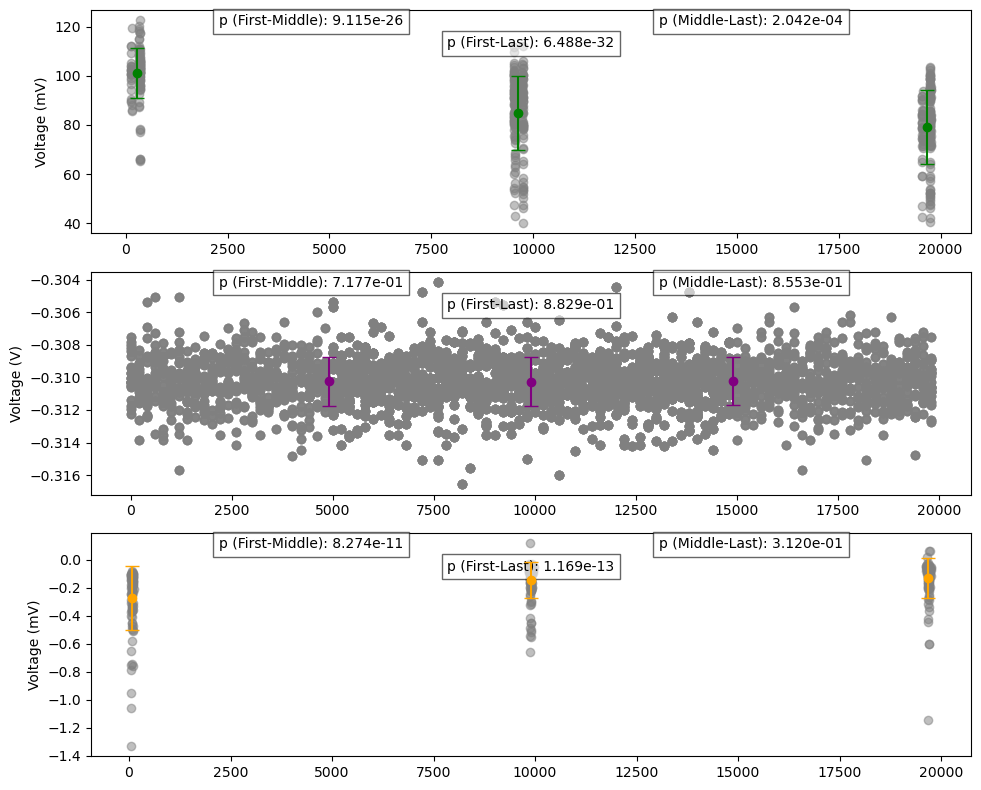

In [10]:
plot_pointplot_with_stripplot(filename="plot_data.pkl")

2022_12_19_cell_2 no selection
2022_12_19_cell_3 no selection
2023_02_28_cell_1 no selection
[0.2]


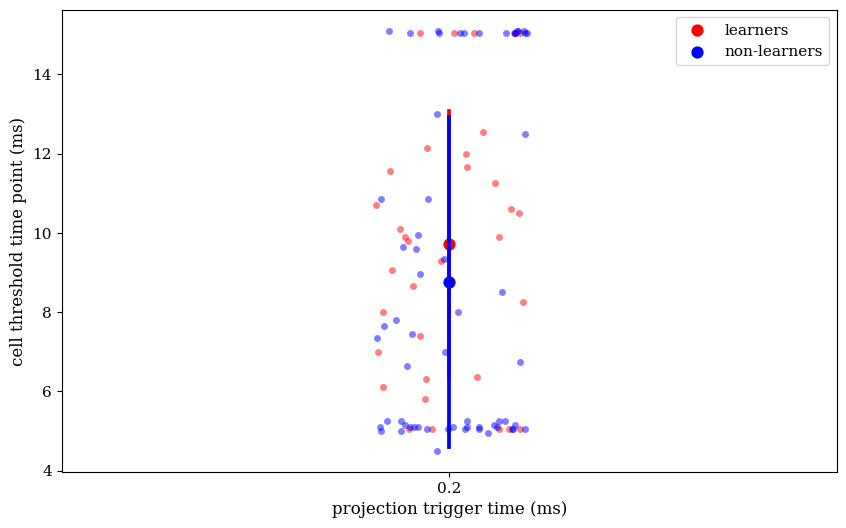

In [582]:
def plot_threshold_timing(training_data,learners,non_learners):
    fig,axs =plt.subplots(1,1)
    cell_grp = training_data.groupby(by="cell_ID")
    lrns=[]
    non_lrns=[]
    for cell, cell_data in cell_grp:
        if cell in learners:
            lrns.append(cell_data)
        elif cell in non_learners:
            non_lrns.append(cell_data)
        else:
            print(cell,"no selection")
            continue
    #print(lrns)
    #print(non_lrns)
    lrns = pd.concat(lrns)
    non_lrns = pd.concat(non_lrns)
    print(non_lrns["trigger_time"].unique())

    sns.pointplot(data=lrns,x="trigger_time", y="cell_thresh_time", color="red",errorbar="sd",dodge=True,ax=axs, label="learners")
    sns.pointplot(data=non_lrns,x="trigger_time", y="cell_thresh_time",color="blue",errorbar="sd" ,dodge=True,ax=axs, label="non-learners")

    sns.stripplot(data=lrns,x="trigger_time", y="cell_thresh_time", color="red",alpha=0.5)
    sns.stripplot(data=non_lrns,x="trigger_time", y="cell_thresh_time",color="blue",alpha=0.5)
    axs.set_ylabel("cell threshold time point (ms)")
    axs.set_xlabel("projection trigger time (ms)")
    plt.legend()
    plt.show()
    plt.close()
plot_threshold_timing(training_data,learners,non_learners)

In [34]:
from pathlib import Path
import neo.io as nio
folder_path = Path("/Users/anzalks/Documents/Expt_data/CA1_recordings/x_spread_recording_02Hz_30mins/cells_cumulated/cells_min_30mins_long")
cell_stats= pd.read_hdf("/Users/anzalks/Documents/pattern_learning_paper/plotting_scripts/python_scripts_paper_ready/data/pickle_files/cell_stats.h5")

In [285]:
def list_folder(p):
    f_list = []
    f_list = list(p.glob('*_cell_*'))
    f_list.sort()
    return f_list

def list_files(p):
    f_list = []
    f_list=list(p.glob('**/*abf'))
    f_list.sort()
    return f_list

def protocol_file_name(file_name):
    f = str(file_name)
    reader = nio.AxonIO(f)
    protocol_name = reader._axon_info['sProtocolPath']
    protocol_name = str(protocol_name).split('\\')[-1]
    protocol_name = protocol_name.split('.')[-2]
    #print(f"protocol_name:{protocol_name}.....")
    return protocol_name

def current_injected(reader):
    protocol_raw = reader.read_raw_protocol()
    protocol_raw = protocol_raw[0]
    protocol_trace = []
    for n in protocol_raw:
        protocol_trace.append(n[0])
    #i_min = np.abs(np.min(protocol_trace))
    #i_max = np.abs(np.max(protocol_trace))
    #i_av = np.around((i_max-i_min),2)
    return protocol_trace#i_av

def abf_to_df(file_name):
    df_from_abf = []
    f = str(file_name)
    reader = nio.AxonIO(f)
    channels = reader.header['signal_channels']
    chan_count = len(channels)
    file_id = file_name.stem
    block  = reader.read_block(signal_group_mode='split-all')
    segments = block.segments
    sample_trace = segments[0].analogsignals[0]
    sampling_rate = sample_trace.sampling_rate.magnitude
    sampling_rate_unit = str(sample_trace.sampling_rate.units).split()[-1]
    ti = sample_trace.t_start
    tf = sample_trace.t_stop
    protocol_trace_list=current_injected(reader)
    #print(protocol_trace_list)
    for s, segment in enumerate(segments):
        df_segment = pd.DataFrame()                                                   
        cell_signal = segment.analogsignals[0]
        cell_Signal_unit = str(cell_signal.units).split()[-1]
        cell_trace = np.hstack(np.ravel(np.array(cell_signal)))                        
        t = np.linspace(0,float(tf-ti),len(cell_trace))
        trial_no = s
        trial_no = [trial_no]*len(t)
        df_segment['trial_no']=trial_no
        df_segment[f'cell_trace({cell_Signal_unit})']=cell_trace
        df_segment["injected_current(pA)"]=protocol_trace_list[s]
        df_segment['time(s)']=t
        df_from_abf.append(df_segment)
    df_from_abf = pd.concat(df_from_abf,ignore_index=True)
    df_from_abf.insert(loc=0, column=f'sampling_rate({sampling_rate_unit})', value=sampling_rate)
    return df_from_abf

def extract_first_spike(cell_data):
    trace = cell_data["cell_trace(mV)"].to_numpy()
    peaks, properties = scipy.signal.find_peaks(trace, height=0)
    first_spike_idx=peaks[0]
    first_spike = [cell_data.iloc[first_spike_idx],first_spike_idx]
    first_spike_data = first_spike[0]
    return first_spike

def extract_spike_frequency(trial_data,traial_no):
    sampling_rate=trial_data["sampling_rate(Hz)"].unique()[0]
    i_trace = trial_data["injected_current(pA)"].to_numpy()
    cell_trace = trial_data["cell_trace(mV)"].to_numpy()
    injected_current = np.max(i_trace)
    start_idx_injection = np.argmax(i_trace)
    end_idx_injection = start_idx_injection+int(0.25*sampling_rate) # 250 ms injection time for all protocols
    spike_trace=cell_trace[start_idx_injection:end_idx_injection]
    peaks, properties = scipy.signal.find_peaks(spike_trace, height=0)
    number_spikes = len(peaks)
    time_current_inj = (end_idx_injection-start_idx_injection)/sampling_rate
    spike_frequency = number_spikes/time_current_inj

    #print(f"idx_len_c_inj: {idx_len_c_inj[0][0]}")
    #plt.plot(cell_trace)
    #plt.scatter(peaks+start_idx_injection,cell_trace[peaks+start_idx_injection],c='r')
    #plt.axvline(start_idx_injection,c='r')
    #plt.axvline(end_idx_injection,c='r')
    #plt.ylim(-90,100)
    #plt.show()
    #plt.close()
    #print(f"injected_current: {injected_current}, time injection : {time_current_inj}, number_spikes: {number_spikes}, spike_frequency: {spike_frequency}")
    return spike_frequency, injected_current
    

In [102]:
cells = list_folder(folder_path) 

In [103]:
h_cells=list(cell_stats.index)
cell_firing_data_all_cells=[]
for cell in tqdm(cells):
    if cell.stem in h_cells:
        abf_list =list_files(cell)
        for abf in abf_list:
            protocol_name = protocol_file_name(abf)
            #print(protocol_name)
            if "cell_threshold" not in protocol_name:
                continue
            else:
                #print(protocol_name,abf)
                firing_data_df = abf_to_df(abf)
                firing_data_df.insert(loc=0, column='cell_ID', value=cell.stem)
                cell_firing_data_all_cells.append(firing_data_df)
cell_firing_data_all_cells= pd.concat(cell_firing_data_all_cells,ignore_index=True)
cell_firing_data_all_cells.reset_index(drop=True)

100%|█████████████████████████████████████████████████████████████████████████████████| 32/32 [00:07<00:00,  4.30it/s]


,cell_ID,sampling_rate(Hz),trial_no,cell_trace(mV),injected_current(pA),time(s)
0,2022_12_12_cell_2,20000.0,0,-65.921021,0.0,0.00000
1,2022_12_12_cell_2,20000.0,0,-65.917969,0.0,0.00005
2,2022_12_12_cell_2,20000.0,0,-65.924072,0.0,0.00010
3,2022_12_12_cell_2,20000.0,0,-65.933228,0.0,0.00015
4,2022_12_12_cell_2,20000.0,0,-65.914917,0.0,0.00020
...,...,...,...,...,...,...
6399995,2023_03_22_cell_2,20000.0,19,-72.689819,0.0,0.49980
6399996,2023_03_22_cell_2,20000.0,19,-72.686768,0.0,0.49985
6399997,2023_03_22_cell_2,20000.0,19,-72.650146,0.0,0.49990
6399998,2023_03_22_cell_2,20000.0,19,-72.653198,0.0,0.49995


In [286]:
cell_grp = cell_firing_data_all_cells.groupby(by="cell_ID")
firing_properties=[]
for cell, cell_data in cell_grp:
    trial_grp = cell_data.groupby(by="trial_no")
    for trial, trial_data in trial_grp:
        trial_df=pd.DataFrame()
        spike_frequency, injected_current = extract_spike_frequency(trial_data,trial)
        trial_df["cell_ID"]=[cell]
        trial_df["trial_no"]=trial
        trial_df["spike_frequency"]=spike_frequency
        trial_df["injected_current"]=injected_current
        firing_properties.append(trial_df)
firing_properties = pd.concat(firing_properties).reset_index(drop=True)        
        
"""    
    
    first_spike = extract_first_spike(cell_data)
    first_spike_data = first_spike[0]
    first_spike_idx=first_spike[1]
    injected_current=first_spike_data['injected_current(pA)']
    cell_df["cell_ID"]=[cell]
    cell_df["spike_frequency"]=spike_frequency
    cell_df["cell_threshold"]=injected_current
    firing_properties.append(cell_df)
firing_properties = pd.concat(firing_properties).reset_index(drop=True)
"""

'    \n    \n    first_spike = extract_first_spike(cell_data)\n    first_spike_data = first_spike[0]\n    first_spike_idx=first_spike[1]\n    injected_current=first_spike_data[\'injected_current(pA)\']\n    cell_df["cell_ID"]=[cell]\n    cell_df["spike_frequency"]=spike_frequency\n    cell_df["cell_threshold"]=injected_current\n    firing_properties.append(cell_df)\nfiring_properties = pd.concat(firing_properties).reset_index(drop=True)\n'

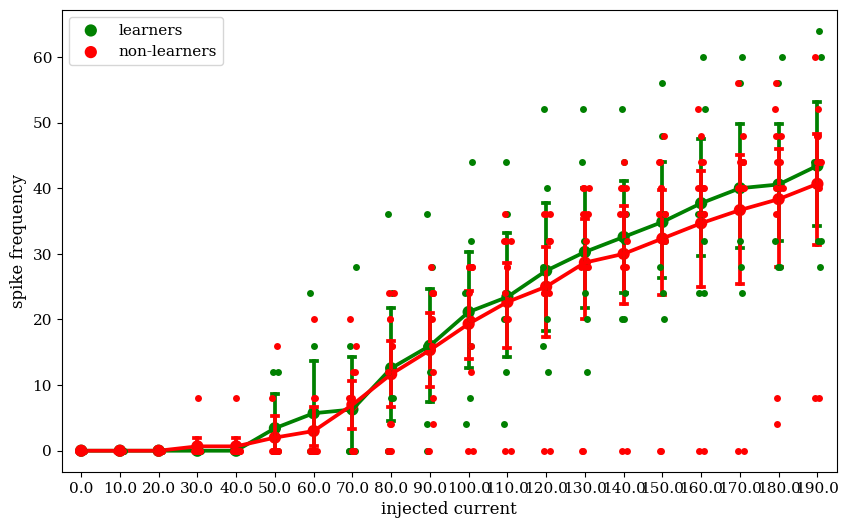

In [324]:
sns.stripplot(data=firing_properties[firing_properties["cell_ID"].isin(learners)],x="injected_current",y="spike_frequency",color="green")
sns.pointplot(data=firing_properties[firing_properties["cell_ID"].isin(learners)],x="injected_current",y="spike_frequency",color="green", capsize=0.15,label="learners")
sns.stripplot(data=firing_properties[firing_properties["cell_ID"].isin(non_learners)],x="injected_current",y="spike_frequency",color="red")
sns.pointplot(data=firing_properties[firing_properties["cell_ID"].isin(non_learners)],x="injected_current",y="spike_frequency",color="red",capsize=0.15, label="non-learners")
plt.ylabel("spike frequency")
plt.xlabel("injected current")
plt.legend()

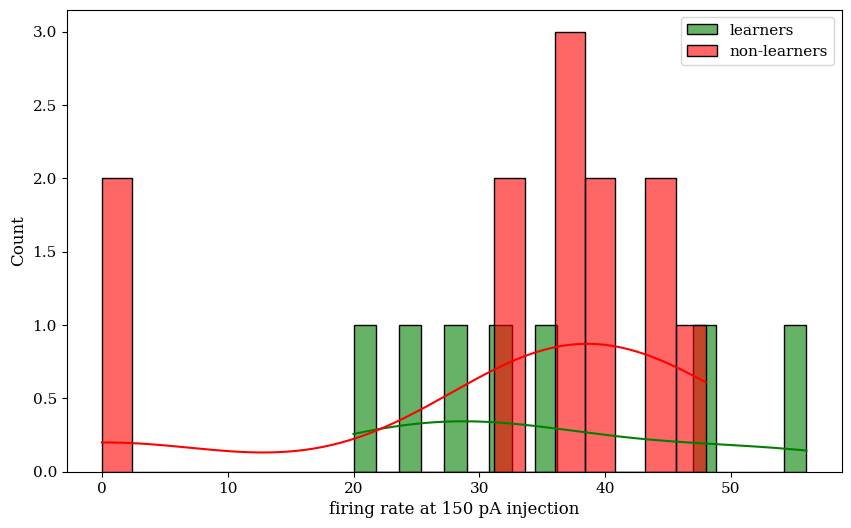

In [305]:
sns.histplot(data= firing_properties[(firing_properties["cell_ID"].isin(learners))&(firing_properties["injected_current"]==150)], x="spike_frequency", bins=20, kde=True, color="green", edgecolor='black',alpha=0.6,label="learners")
sns.histplot(data= firing_properties[(firing_properties["cell_ID"].isin(non_learners))&(firing_properties["injected_current"]==150)], x="spike_frequency", bins=20, kde=True, color="red", edgecolor='black',alpha=0.6,label="non-learners")
plt.xlabel("firing rate at 150 pA injection")
plt.legend()

In [256]:
firing_properties["cell_ID"]

0     2022_12_12_cell_2
1     2022_12_12_cell_5
2     2022_12_19_cell_2
3     2022_12_19_cell_3
4     2022_12_21_cell_1
5     2022_12_29_cell_1
6     2022_12_30_cell_1
7     2023_01_09_cell_1
8     2023_01_09_cell_2
9     2023_01_09_cell_3
10    2023_01_10_cell_1
11    2023_01_10_cell_2
12    2023_01_10_cell_3
13    2023_01_27_cell_1
14    2023_01_27_cell_2
15    2023_02_23_cell_1
16    2023_02_24_cell_1
17    2023_02_24_cell_2
18    2023_02_24_cell_3
19    2023_02_26_cell_1
20    2023_02_27_cell_1
21    2023_02_27_cell_2
22    2023_02_28_cell_1
23    2023_03_17_cell_1
24    2023_03_17_cell_2
25    2023_03_18_cell_1
26    2023_03_18_cell_2
27    2023_03_20_cell_1
28    2023_03_20_cell_2
29    2023_03_20_cell_3
30    2023_03_22_cell_1
31    2023_03_22_cell_2
Name: cell_ID, dtype: object

In [147]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageDraw

def load_image_pillow(image_path):
    # Load the tiff image using Pillow
    img = Image.open(image_path)
    return img

def prompt_for_points_pillow(image):
    # Convert the image to numpy array for display with matplotlib
    img_array = np.array(image)
    
    fig, ax = plt.subplots()
    ax.imshow(img_array, cmap='gray')
    
    points = []

    def onclick(event):
        if event.xdata and event.ydata:
            print(f"Point selected at: ({event.xdata}, {event.ydata})")  # Debug print
            points.append((event.xdata, event.ydata))
            ax.plot(event.xdata, event.ydata, 'ro')
            plt.draw()
        if len(points) == 2:
            plt.close(fig)

    # Connect the event to the figure for mouse input
    cid = fig.canvas.mpl_connect('button_press_event', onclick)
    
    plt.show()
    
    if len(points) != 2:
        raise ValueError("Exactly two points must be selected.")
    
    return points

def calculate_scaling_factor(physical_dist_in_um, physical_dist_in_pix):
    # Calculate scaling factor
    scaling_factor = physical_dist_in_pix / physical_dist_in_um
    return scaling_factor

def plot_tick_line_pillow(image, point1, point2, physical_dist_in_um, physical_dist_in_pix):
    draw = ImageDraw.Draw(image)
    
    # Draw arrowhead line between point1 and point2
    draw.line([point1, point2], fill="red", width=3)
    
    # Add arrowheads manually
    draw.text(point1, f'{physical_dist_in_um} um ({physical_dist_in_pix:.2f} pix)', fill="white")
    
    # Show the image with the tick line overlay
    image.show()

def overlay_scale_bar_pillow(image, scaling_factor, bar_length_um):
    # Calculate the bar length in pixels using the scaling factor
    bar_length_pix = bar_length_um * scaling_factor

    draw = ImageDraw.Draw(image)

    # Define the scale bar location (bottom right)
    x_bar_start = image.width - 100 - bar_length_pix
    x_bar_end = image.width - 100
    y_bar = image.height - 50

    # Draw the scale bar
    draw.line([x_bar_start, x_bar_end], [y_bar, y_bar], fill="white", width=5)
    draw.text((x_bar_start, y_bar - 20), f'{bar_length_um} um', fill="white")

    # Show the image with the scale bar overlay
    image.show()

def process_image_pillow(image_path, magnification, physical_dist_in_um):
    # Step 1: Load the image using Pillow
    image = load_image_pillow(image_path)

    # Step 2: Prompt user to select two points on the image
    point1, point2 = prompt_for_points_pillow(image)
    
    # Step 3: Calculate the distance in pixels between the two points
    physical_dist_in_pix = np.sqrt((point2[0] - point1[0])**2 + (point2[1] - point1[1])**2)
    
    # Step 4: Calculate the scaling factor
    scaling_factor = calculate_scaling_factor(physical_dist_in_um, physical_dist_in_pix)
    
    # Step 5: Plot the tick line with the distances using Pillow
    plot_tick_line_pillow(image, point1, point2, physical_dist_in_um, physical_dist_in_pix)
    
    return scaling_factor

# Function to overlay scale bar on an image
def overlay_scale_bar_on_image_pillow(image_path, scaling_factor, bar_length_um):
    # Step 1: Load the image
    image = load_image_pillow(image_path)

    # Step 2: Overlay the scale bar using Pillow
    overlay_scale_bar_pillow(image, scaling_factor, bar_length_um)

# Example usage:
# scaling_factor = process_image_pillow('microscope_image.tiff', magnification=40, physical_dist_in_um=100)
# overlay_scale_bar_on_image_pillow('microscope_image.tiff', scaling_factor, bar_length_um=50)


In [148]:
%matplotlib notebook
image_path = "/Users/anzalks/Documents/pattern_learning_paper/plotting_scripts/python_scripts_paper_ready/data/40X1mm_micrometerslide_01mm_div.tiff"
magnification = 40
physical_dist_in_um =10
process_image_pillow(image_path, magnification, physical_dist_in_um)

<IPython.core.display.Javascript object>

ValueError: Exactly two points must be selected.

In [2]:
data= pd.read_pickle("/Users/anzalks/Documents/pattern_learning_paper/plotting_scripts/python_scripts_paper_ready/analysis_scripts/pickle_files_from_analysis/pd_all_cells_all_trials.pickle")

In [3]:
data.columns

Index(['cell_ID', 'frame_status', 'pre_post_status', 'frame_id', 'trial_no',
       'min_trace', 'max_trace', 'abs_area', 'pos_area', 'neg_area',
       'onset_time', 'max_field', 'min_field', 'slope', 'intercept',
       'min_trace_t', 'max_trace_t', 'max_field_t', 'min_field_t', 'trace',
       'field', 'ttl', 'mean_rmp', 'mepsp_amp', 'mepsp_time', 'num_mepsp',
       'freq_mepsp'],
      dtype='object')

In [ ]:
# Load the dataframe (assuming it has already been loaded)
column_name = 'onset_time'

plt.figure(figsize=(10, 6))
sns.histplot(data=data, x='onset_time', kde=True, bins=30)
plt.title('Distribution of Onset Time')
plt.xlabel('Onset Time (ms)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [8]:
list_of_variables = ['abs_area', 'pos_area', 'neg_area', 'onset_time','slope']
y_labels = ['% change in\nabsolute area', '% change in\npositive area', '% change in\nnegativearea', '% change in\nonset time','% change in slope']
subplot_titles = ['absolute area', 'positive area', 'negativearea', 'onset time','slope']

In [29]:
import pickle
import matplotlib.pyplot as plt

def plot_from_pickle(filename="plot_data.pkl", plot_limit=None):
    """
    Loads plot data from a pickle file and generates the plot, including spikes and minima.

    Parameters:
    filename (str): The name of the pickle file to load the data from.
    plot_limit (int or None): The number of points to plot. If None, plot the entire data.
    """
    try:
        # Load the plot data from the pickle file
        with open(filename, 'rb') as f:
            plot_data = pickle.load(f)
    except FileNotFoundError:
        print(f"Error: File '{filename}' not found.")
        return
    except Exception as e:
        print(f"Error loading data: {e}")
        return

    fig, axs = plt.subplots(3, 1, figsize=(12, 10), sharex=True)
    
    # Set titles and labels outside the loop
    axs[0].set_title("All Cells - Cell Trace")
    axs[0].set_ylabel("Voltage (mV)")
    axs[1].set_title("TTL Trace")
    axs[1].set_ylabel("Voltage (V)")
    axs[2].set_title("Field Trace")
    axs[2].set_ylabel("Voltage (mV)")
    axs[2].set_xlabel("Time (frames)")

    # Loop over the data for each cell
    for data in plot_data:
        cell_ID = data['cell_ID']
        trial_no = data['trial_no']
        trace = data['cell_trace']
        field_trace = data['field_trace']
        ttl_trace = data['ttl_trace']
        ttl_rising_edges = data['ttl_rising_edges']
        spikes = data['spikes']
        minimas = data['minimas']

        # Define the range to plot
        trace_range = plot_limit if plot_limit is not None else len(trace)

        # Plot the main traces with alpha transparency
        axs[0].plot(trace[:trace_range], alpha=0.5)
        axs[1].plot(ttl_trace[:trace_range], alpha=0.5)
        axs[2].plot(field_trace[:trace_range], alpha=0.5)

        # Plot TTL rising edges, spikes, and minimas
        axs[1].scatter(ttl_rising_edges, [ttl_trace[i] for i in ttl_rising_edges if i < trace_range],
                       color='red', alpha=0.6, label='TTL Rising Edge' if 'TTL Rising Edge' not in axs[1].get_legend_handles_labels()[1] else "")
        
        axs[0].scatter(*zip(*[(i, v) for i, v in spikes if i < trace_range]), 
                       color='red', alpha=0.6, label='Spike Peak' if 'Spike Peak' not in axs[0].get_legend_handles_labels()[1] else "")

        axs[2].scatter(*zip(*[(i, v) for i, v in minimas if i < trace_range]), 
                       color='blue', alpha=0.6, label='Field Minima' if 'Field Minima' not in axs[2].get_legend_handles_labels()[1] else "")
    
    # Show legends only once
    for ax in axs:
        if ax.get_legend_handles_labels()[1]:
            ax.legend()

    plt.tight_layout()
    plt.show()

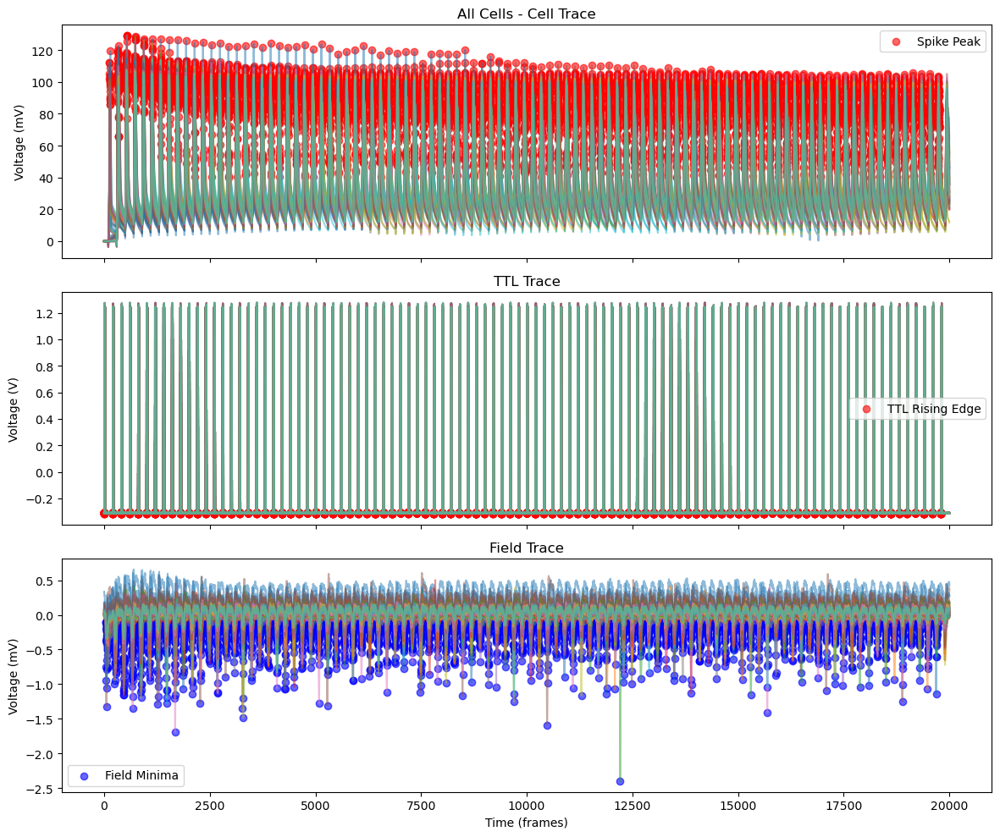

In [30]:
plot_from_pickle(filename="plot_data.pkl", plot_limit=None)

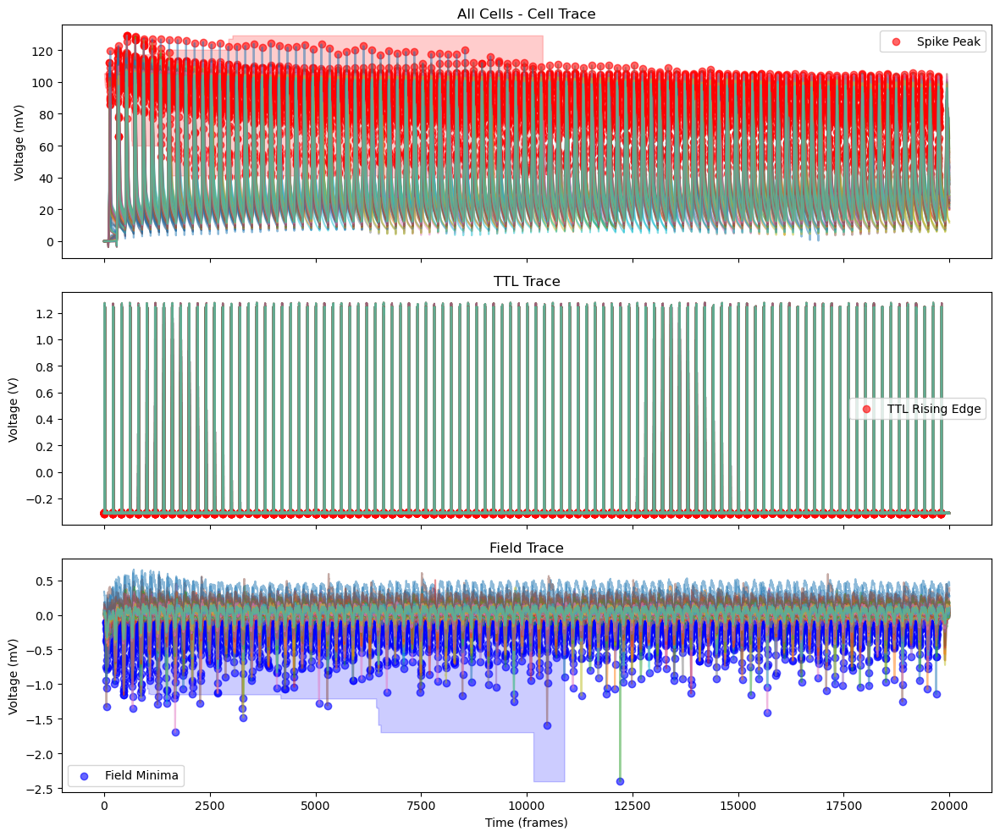

In [32]:
plot_from_pickle(filename="plot_data.pkl", plot_limit=None)

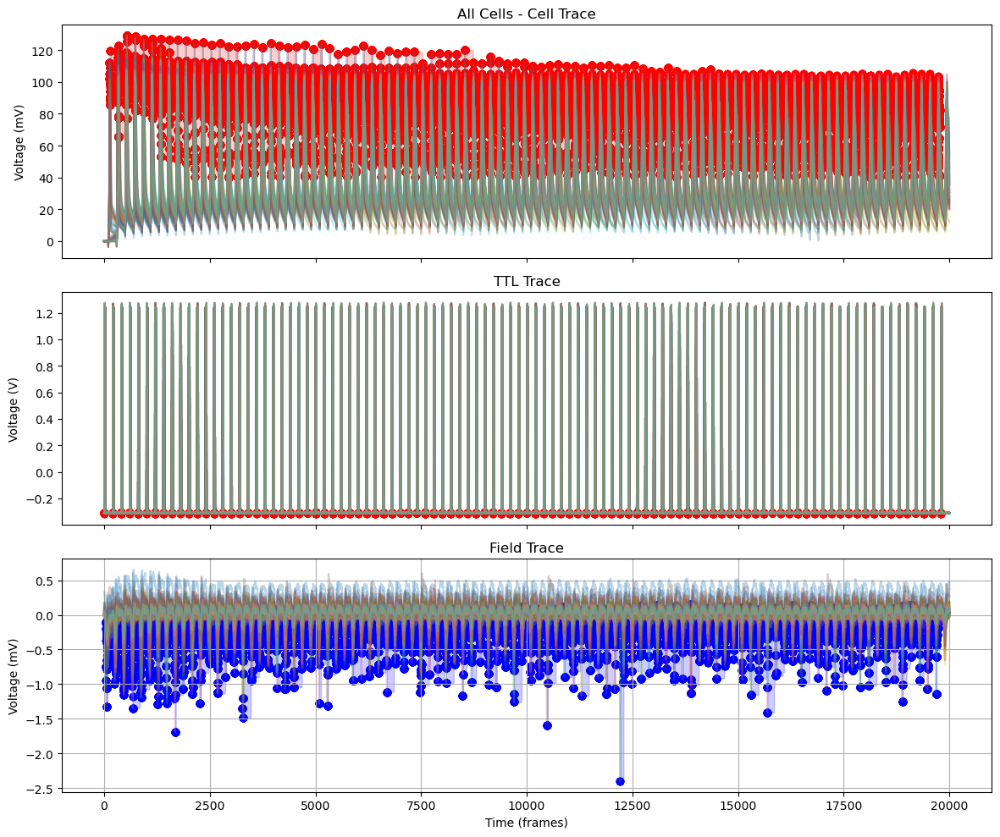

In [33]:
import pickle
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def plot_from_pickle(filename="plot_data.pkl", plot_limit=None, window_size=50):
    """
    Loads plot data from a pickle file and generates the plot, including spikes, minima, and envelopes.

    Parameters:
    filename (str): The name of the pickle file to load the data from.
    plot_limit (int or None): The number of points to plot. If None, plot the entire data.
    window_size (int): The size of the rolling window for smoothing the envelope.
    """
    try:
        with open(filename, 'rb') as f:
            plot_data = pickle.load(f)
    except FileNotFoundError:
        print(f"Error: File '{filename}' not found.")
        return
    except Exception as e:
        print(f"Error loading data: {e}")
        return

    fig, axs = plt.subplots(3, 1, figsize=(12, 10), sharex=True)

    # Set titles and labels
    axs[0].set_title("All Cells - Cell Trace")
    axs[0].set_ylabel("Voltage (mV)")
    axs[1].set_title("TTL Trace")
    axs[1].set_ylabel("Voltage (V)")
    axs[2].set_title("Field Trace")
    axs[2].set_ylabel("Voltage (mV)")
    axs[2].set_xlabel("Time (frames)")

    # Data to collect for envelope calculation
    spike_x, spike_y = [], []
    minima_x, minima_y = [], []

    for data in plot_data:
        cell_ID = data['cell_ID']
        trial_no = data['trial_no']
        trace = data['cell_trace']
        field_trace = data['field_trace']
        ttl_trace = data['ttl_trace']
        ttl_rising_edges = data['ttl_rising_edges']
        spikes = data['spikes']
        minimas = data['minimas']

        trace_range = plot_limit if plot_limit is not None else len(trace)

        # Plot traces
        axs[0].plot(trace[:trace_range], alpha=0.3)
        axs[1].plot(ttl_trace[:trace_range], alpha=0.3)
        axs[2].plot(field_trace[:trace_range], alpha=0.3)

        # Collect spike and minima points
        spike_x.extend([i for i, v in spikes if i < trace_range])
        spike_y.extend([v for i, v in spikes if i < trace_range])
        minima_x.extend([i for i, v in minimas if i < trace_range])
        minima_y.extend([v for i, v in minimas if i < trace_range])

        # Plot scatter points
        axs[1].scatter(ttl_rising_edges, [ttl_trace[i] for i in ttl_rising_edges if i < trace_range],
                       color='red', alpha=0.6)
        axs[0].scatter(spike_x, spike_y, color='red', alpha=0.6)
        axs[2].scatter(minima_x, minima_y, color='blue', alpha=0.6)

    # Create envelopes using rolling window smoothing
    if spike_x and spike_y:
        spike_df = pd.DataFrame({'x': spike_x, 'y': spike_y}).sort_values('x')
        spike_df['upper'] = spike_df['y'].rolling(window_size, min_periods=1).max()
        spike_df['lower'] = spike_df['y'].rolling(window_size, min_periods=1).min()
        axs[0].fill_between(spike_df['x'], spike_df['lower'], spike_df['upper'], color='red', alpha=0.2)

    if minima_x and minima_y:
        minima_df = pd.DataFrame({'x': minima_x, 'y': minima_y}).sort_values('x')
        minima_df['upper'] = minima_df['y'].rolling(window_size, min_periods=1).max()
        minima_df['lower'] = minima_df['y'].rolling(window_size, min_periods=1).min()
        axs[2].fill_between(minima_df['x'], minima_df['lower'], minima_df['upper'], color='blue', alpha=0.2)

    plt.grid(True)
    plt.tight_layout()
    plt.show()
plot_from_pickle(filename="plot_data.pkl", plot_limit=None)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy.stats import mannwhitneyu
import pickle

def plot_pointplot_with_stripplot(filename="plot_data.pkl", plot_limit=None):
    """
    Plots point plots for spikes, minima, and TTL rising edges with overlaid point plots.
    The Mann-Whitney U test is performed pairwise to compare the three groups,
    and the p-values for pairwise comparisons are displayed on top of the plot with annotation lines.
    The error bars now represent the standard error of the mean (SEM).
    """
    
    # Load the plot data from the pickle file
    with open(filename, 'rb') as f:
        plot_data = pickle.load(f)
    
    # Prepare lists to store categorized data
    ttl_rising_edge_points = []
    spike_points = []
    minima_points = []

    # Extract data points from the loaded pickle file
    for data in plot_data:
        ttl_trace = data['ttl_trace']
        ttl_rising_edges = data['ttl_rising_edges']
        spikes = data['spikes']
        minimas = data['minimas']

        ttl_rising_edge_points.extend([(edge, ttl_trace[edge]) for edge in ttl_rising_edges])
        spike_points.extend(spikes)
        minima_points.extend(minimas)

    time_points = ["0s", "0.5s", "1s"]

    def categorize_by_time(data_points):
        categorized_data = {tp: [] for tp in time_points}
        x, y = zip(*data_points)
        unique_x = sorted(set(x))
        
        for i, val in enumerate(x):
            if val < unique_x[len(unique_x) // 3]:
                categorized_data["0s"].append(y[i])
            elif val < unique_x[2 * len(unique_x) // 3]:
                categorized_data["0.5s"].append(y[i])
            else:
                categorized_data["1s"].append(y[i])
        
        return categorized_data

    def create_dataframe(categorized_data):
        data_list = []
        for tp in time_points:
            for value in categorized_data[tp]:
                data_list.append({"Time": tp, "Value": value})
        return pd.DataFrame(data_list)

    def plot_from_dataframe(ax, df, color='black'):
        """
        Plots the data using a strip plot and overlays mean with error bars using SEM.
        """
        # Strip plot for individual points with transparency
        sns.stripplot(data=df, x='Time', y='Value', jitter=True, alpha=0.2, color='grey', ax=ax)

        # Calculate mean and SEM for each time point
        means = df.groupby('Time')['Value'].mean()
        sems = df.groupby('Time')['Value'].sem()

        # Overlay point plots with error bars using SEM (drawn after the strip plot)
        for tp in time_points:
            ax.errorbar(tp, means[tp], yerr=sems[tp], fmt='o', color=color, capsize=5, zorder=10)  # Ensure point plot is on top

        return means

    def run_stat_tests(df):
        """
        Runs the Mann-Whitney U test for each pair of time points and returns the p-values.
        """
        data_0s = df[df['Time'] == "0s"]['Value']
        data_05s = df[df['Time'] == "0.5s"]['Value']
        data_1s = df[df['Time'] == "1s"]['Value']

        def mannwhitney_safe(x, y):
            if len(x) < 2 or len(y) < 2:
                return np.nan
            try:
                return mannwhitneyu(x, y, alternative='two-sided').pvalue
            except ValueError:
                return np.nan

        p_0_05 = mannwhitney_safe(data_0s, data_05s)
        p_05_1 = mannwhitney_safe(data_05s, data_1s)
        p_0_1 = mannwhitney_safe(data_0s, data_1s)

        return p_0_05, p_05_1, p_0_1

    def add_annotations(ax, p_0_05, p_05_1, p_0_1):
        y_max = ax.get_ylim()[1]
        
        def draw_annotation(x1, x2, y, p_val):
            ax.plot([x1, x2], [y, y], color='black', linewidth=1)
            ax.text((x1 + x2) / 2, y + 0.05, f'p={p_val:.3e}', ha='center')

        if not np.isnan(p_0_05):
            draw_annotation(0, 1, y_max * 0.9, p_0_05)
        if not np.isnan(p_05_1):
            draw_annotation(1, 2, y_max * 0.85, p_05_1)
        if not np.isnan(p_0_1):
            draw_annotation(0, 2, y_max * 0.95, p_0_1)

    spike_data = categorize_by_time(spike_points)
    ttl_data = categorize_by_time(ttl_rising_edge_points)
    minima_data = categorize_by_time(minima_points)

    spike_df = create_dataframe(spike_data)
    ttl_df = create_dataframe(ttl_data)
    minima_df = create_dataframe(minima_data)

    fig, axs = plt.subplots(3, 1, figsize=(8, 10))

    # Plot data using strip plots with SEM error bars and run statistical tests
    spike_means = plot_from_dataframe(axs[0], spike_df, color='green')
    p_0_05, p_05_1, p_0_1 = run_stat_tests(spike_df)
    add_annotations(axs[0], p_0_05, p_05_1, p_0_1)
    axs[0].set_title("Spikes")
    axs[0].set_ylabel("Voltage (mV)")
    axs[0].set_ylim(-100, 150)

    ttl_means = plot_from_dataframe(axs[1], ttl_df, color='purple')
    p_0_05, p_05_1, p_0_1 = run_stat_tests(ttl_df)
    add_annotations(axs[1], p_0_05, p_05_1, p_0_1)
    axs[1].set_title("TTL Rising Edges")
    axs[1].set_ylabel("Voltage (V)")
    axs[1].set_ylim(0.1, 1.6)

    minima_means = plot_from_dataframe(axs[2], minima_df, color='orange')
    p_0_05, p_05_1, p_0_1 = run_stat_tests(minima_df)
    add_annotations(axs[2], p_0_05, p_05_1, p_0_1)
    axs[2].set_title("Minimas")
    axs[2].set_ylabel("Voltage (mV)")
    axs[2].set_ylim(-2.6, 0.6)

    for ax in axs:
        ax.set_xticks(range(3))
        ax.set_xticklabels(time_points)
        ax.spines[['right', 'top']].set_visible(False)

    plt.tight_layout()
    plt.show()


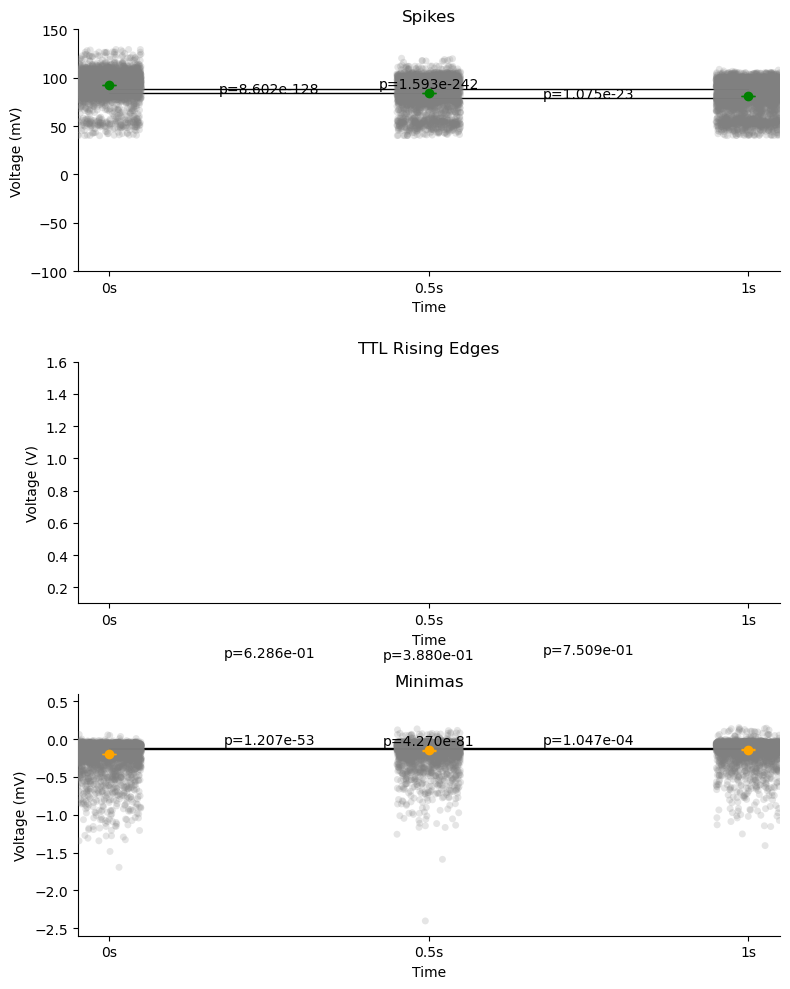

In [65]:
plot_pointplot_with_stripplot(filename="plot_data.pkl")

In [109]:
def plot_pointplot_with_stripplot(filename="plot_data.pkl", plot_limit=None):
    """
    Plots point plots for spikes, minima, and TTL rising edges with overlaid point plots.
    The Mann-Whitney U test is performed pairwise to compare the three groups,
    and the p-values for pairwise comparisons are displayed on top of the plot with annotation lines.
    The error bars represent the standard error of the mean (SEM).
    """
    
    # Load the plot data from the pickle file
    try:
        with open(filename, 'rb') as f:
            plot_data = pickle.load(f)
    except (FileNotFoundError, pickle.UnpicklingError) as e:
        print(f"Error loading file: {e}")
        return

    # Prepare lists to store categorized data
    ttl_rising_edge_points = []
    spike_points = []
    minima_points = []

    # Extract data points with error handling
    for data in plot_data:
        try:
            ttl_trace = data['ttl_trace']
            ttl_rising_edges = data['ttl_rising_edges']
            spikes = data['spikes']
            minimas = data['minimas']

            ttl_rising_edge_points.extend([(edge, ttl_trace[edge]) for edge in ttl_rising_edges])
            spike_points.extend(spikes)
            minima_points.extend(minimas)
        except KeyError as e:
            print(f"Missing key in data: {e}")
            continue

    time_points = ["0s", "0.5s", "1s"]

    def categorize_by_time(data_points):
        categorized_data = {tp: [] for tp in time_points}
        if len(data_points) == 0:
            return categorized_data
        
        x, y = zip(*data_points)
        unique_x = sorted(set(x))
        if len(unique_x) == 0:
            return categorized_data
        
        for i, val in enumerate(x):
            if val < unique_x[len(unique_x) // 3]:
                categorized_data["0s"].append(y[i])
            elif val < unique_x[2 * len(unique_x) // 3]:
                categorized_data["0.5s"].append(y[i])
            else:
                categorized_data["1s"].append(y[i])
        return categorized_data

    def create_dataframe(categorized_data):
        data_list = []
        for tp in time_points:
            for value in categorized_data[tp]:
                data_list.append({"Time": tp, "Value": value})
        return pd.DataFrame(data_list)

    def plot_from_dataframe(ax, df, color='black'):
        sns.stripplot(data=df, x='Time', y='Value', jitter=True, alpha=0.2, color='grey', ax=ax)
        means = df.groupby('Time')['Value'].mean()
        sems = df.groupby('Time')['Value'].sem()

        for tp in time_points:
            ax.errorbar(tp, means[tp], yerr=sems[tp], fmt='o', color=color, capsize=5, zorder=10)

        return means

    def run_stat_tests(df):
        data_0s = df[df['Time'] == "0s"]['Value']
        data_05s = df[df['Time'] == "0.5s"]['Value']
        data_1s = df[df['Time'] == "1s"]['Value']

        def mannwhitney_safe(x, y):
            if len(x) < 2 or len(y) < 2:
                return np.nan
            try:
                return mannwhitneyu(x, y, alternative='two-sided').pvalue
            except ValueError:
                return np.nan

        return (mannwhitney_safe(data_0s, data_05s),
                mannwhitney_safe(data_05s, data_1s),
                mannwhitney_safe(data_0s, data_1s))

    def add_annotations(ax, p_values):
        """
        Adds annotation lines and p-value texts for pairwise comparisons with increased vertical spacing.
        """
        y_min, y_max = ax.get_ylim()
        y_range = y_max - y_min
        
        # Updated dynamic offsets to increase spacing
        offsets = [y_max - 2 * y_range, 
                   y_max - 3 * y_range, 
                   y_max + 0.1 * y_range]  # Increased spacing between lines










        
        comparisons = [(0, 1), (1, 2), (0, 2)]
    
        for (x1, x2), offset, p_val in zip(comparisons, offsets, p_values):
            if not np.isnan(p_val):
                # Draw the annotation line
                ax.plot([x1, x2], [offset] * 2, color='black', linewidth=1.5)
                # Display the p-value above the line
                ax.text((x1 + x2) / 2, offset + 0.02 * y_range, f'p={p_val:.3e}', 
                        ha='center', va='bottom', fontsize=10)
    


    spike_df = create_dataframe(categorize_by_time(spike_points))
    ttl_df = create_dataframe(categorize_by_time(ttl_rising_edge_points))
    minima_df = create_dataframe(categorize_by_time(minima_points))

    fig, axs = plt.subplots(3, 1, figsize=(8, 10))

    # Plot each type of data with specific axis limits
    for ax, df, title, color, ylim in zip(
        axs, 
        [spike_df, ttl_df, minima_df], 
        ["Spikes", "TTL Rising Edges", "Minimas"], 
        ['green', 'purple', 'orange'],
        [(-100, 150), (-1, 1.6), (-2.6, 0.6)]
    ):
        means = plot_from_dataframe(ax, df, color)
        p_values = run_stat_tests(df)
        add_annotations(ax, p_values)
        ax.set_title(title)
        ax.set_ylabel("Voltage (mV)" if title != "TTL Rising Edges" else "Voltage (V)")
        ax.set_ylim(ylim)
        ax.set_xticks(range(3))
        ax.set_xticklabels(time_points)
        ax.spines[['right', 'top']].set_visible(False)

    plt.tight_layout()
    plt.show()


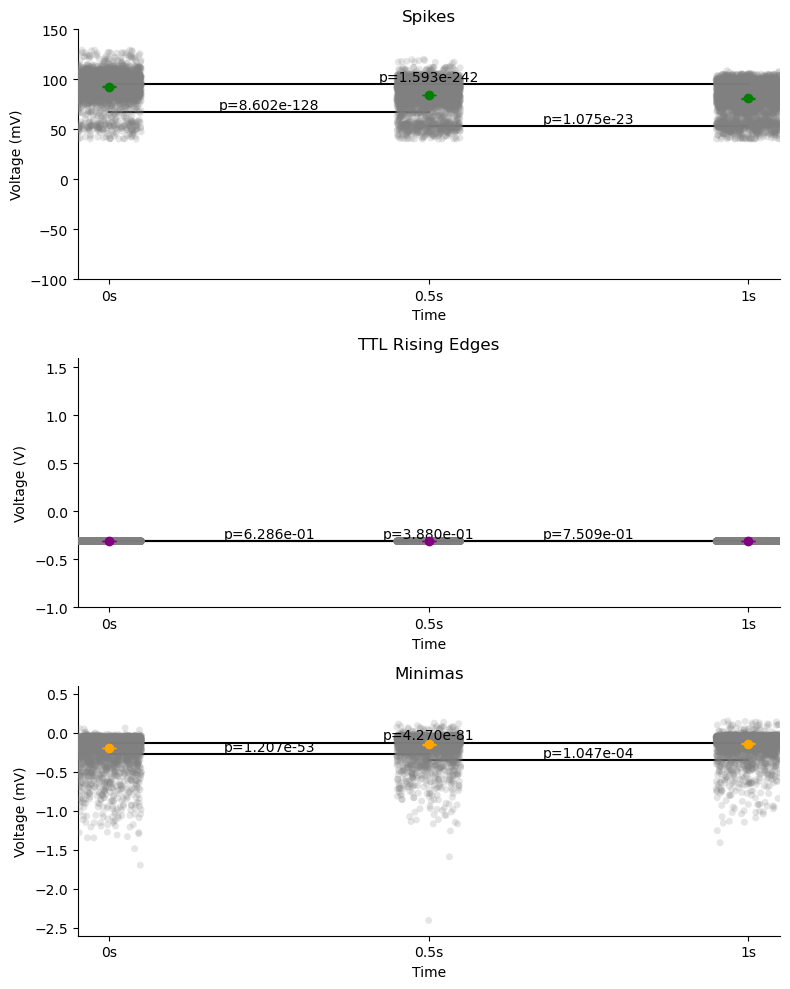

In [111]:
plot_pointplot_with_stripplot()

In [144]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu

def plot_from_dataframe(ax, df, color='black'):
    """
    Creates a violin plot and displays summary statistics.
    Outliers are shown as individual points.
    """
    # Violin plot with outliers shown as points
    sns.violinplot(data=df, x='Time', y='Value', inner='point', color='grey', alpha=0.7, ax=ax)

    # Calculate and display median, 25th, and 75th percentiles for each time point
    stats = df.groupby('Time')['Value'].describe(percentiles=[0.25, 0.5, 0.75])
    for i, tp in enumerate(time_points):
        median = stats.loc[tp, '50%']
        q1 = stats.loc[tp, '25%']
        q3 = stats.loc[tp, '75%']
        # Annotate median and quartiles above each violin plot
        ax.text(i, median + 0.05 * (df['Value'].max() - df['Value'].min()), 
                f"Med: {median:.2f}\nQ1: {q1:.2f}, Q3: {q3:.2f}", 
                ha='center', va='bottom', fontsize=10, color='black')

    return stats


import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu

def plot_pointplot_with_violinplot(filename="plot_data.pkl"):
    """
    Plots violin plots for spikes, minima, and TTL rising edges.
    Displays summary statistics and performs pairwise Mann-Whitney U tests.
    """
    try:
        with open(filename, 'rb') as f:
            plot_data = pickle.load(f)
    except (FileNotFoundError, pickle.UnpicklingError) as e:
        print(f"Error loading file: {e}")
        return

    # Extract data from the pickle file
    ttl_rising_edge_points, spike_points, minima_points = [], [], []
    for data in plot_data:
        if all(k in data for k in ['ttl_trace', 'ttl_rising_edges', 'spikes', 'minimas']):
            ttl_trace = data['ttl_trace']
            ttl_rising_edges = data['ttl_rising_edges']
            spikes = data['spikes']
            minimas = data['minimas']
            ttl_rising_edge_points.extend([(edge, ttl_trace[edge]) for edge in ttl_rising_edges])
            spike_points.extend(spikes)
            minima_points.extend(minimas)

    time_points = ["0s", "0.5s", "1s"]

    def categorize_by_time(data_points):
        categorized_data = {tp: [] for tp in time_points}
        if not data_points:
            return categorized_data
        
        x, y = zip(*data_points) if data_points else ([], [])
        unique_x = sorted(set(x))
        if not unique_x:
            return categorized_data
        
        for i, val in enumerate(x):
            if val < unique_x[len(unique_x) // 3]:
                categorized_data["0s"].append(y[i])
            elif val < unique_x[2 * len(unique_x) // 3]:
                categorized_data["0.5s"].append(y[i])
            else:
                categorized_data["1s"].append(y[i])
        return categorized_data

    def create_dataframe(categorized_data):
        return pd.DataFrame([{"Time": tp, "Value": v} for tp, values in categorized_data.items() for v in values])

    def plot_from_dataframe(ax, df, time_points, color='lightblue'):
        """
        Creates a violin plot and displays summary statistics.
        Outliers are shown as individual points.
        """
        sns.violinplot(
            data=df, x='Time', y='Value', inner='point', color=color, alpha=0.6, ax=ax
        )

    def run_stat_tests(df):
        data_0s = df[df['Time'] == "0s"]['Value']
        data_05s = df[df['Time'] == "0.5s"]['Value']
        data_1s = df[df['Time'] == "1s"]['Value']

        def mannwhitney_safe(x, y):
            if len(x) < 2 or len(y) < 2:
                return None
            return mannwhitneyu(x, y, alternative='two-sided').pvalue

        return (mannwhitney_safe(data_0s, data_05s),
                mannwhitney_safe(data_05s, data_1s),
                mannwhitney_safe(data_0s, data_1s))

    def add_annotations(ax, p_values):
        """
        Adds annotations for p-values with asterisks or 'ns' if not significant.
        """
        y_min, y_max = ax.get_ylim()
        y_range = y_max - y_min
        offsets = [y_max + 0.05 * y_range * (i + 1) for i in range(3)]
        comparisons = [(0, 1), (1, 2), (0, 2)]

        def format_p_value(p_val):
            if p_val is None:
                return "ns"
            elif p_val < 0.001:
                return f"*** p={p_val:.3e}"
            elif p_val < 0.01:
                return f"** p={p_val:.3f}"
            elif p_val < 0.05:
                return f"* p={p_val:.3f}"
            else:
                return "ns"

        for (x1, x2), offset, p_val in zip(comparisons, offsets, p_values):
            if p_val is not None:
                ax.plot([x1, x2], [offset] * 2, color='black', linewidth=1.5)
                ax.text((x1 + x2) / 2, offset + 0.01 * y_range, format_p_value(p_val), 
                        ha='center', va='bottom', fontsize=10, color='black')

    # Prepare dataframes for plotting
    spike_df = create_dataframe(categorize_by_time(spike_points))
    ttl_df = create_dataframe(categorize_by_time(ttl_rising_edge_points))
    minima_df = create_dataframe(categorize_by_time(minima_points))

    # Create subplots and define pastel colors
    fig, axs = plt.subplots(3, 1, figsize=(8, 12))
    pastel_colors = ['#A0C4FF', '#BDB2FF', '#FFC6FF']
    y_labels = ["Membrane Potential (mV)", "Trigger Voltage (V)", "LFP (mV)"]

    for ax, df, title, color, ylabel in zip(
        axs, [spike_df, ttl_df, minima_df], 
        ["Spikes", "TTL Rising Edges", "LFP peaks"], 
        pastel_colors, y_labels
    ):
        plot_from_dataframe(ax, df, time_points, color)
        p_values = run_stat_tests(df)
        add_annotations(ax, p_values)
        ax.set_title(title)
        ax.set_ylabel(ylabel)
        ax.set_xticks(range(3))
        ax.set_xticklabels(time_points)
        ax.spines[['right', 'top']].set_visible(False)

    plt.tight_layout()
    plt.show()


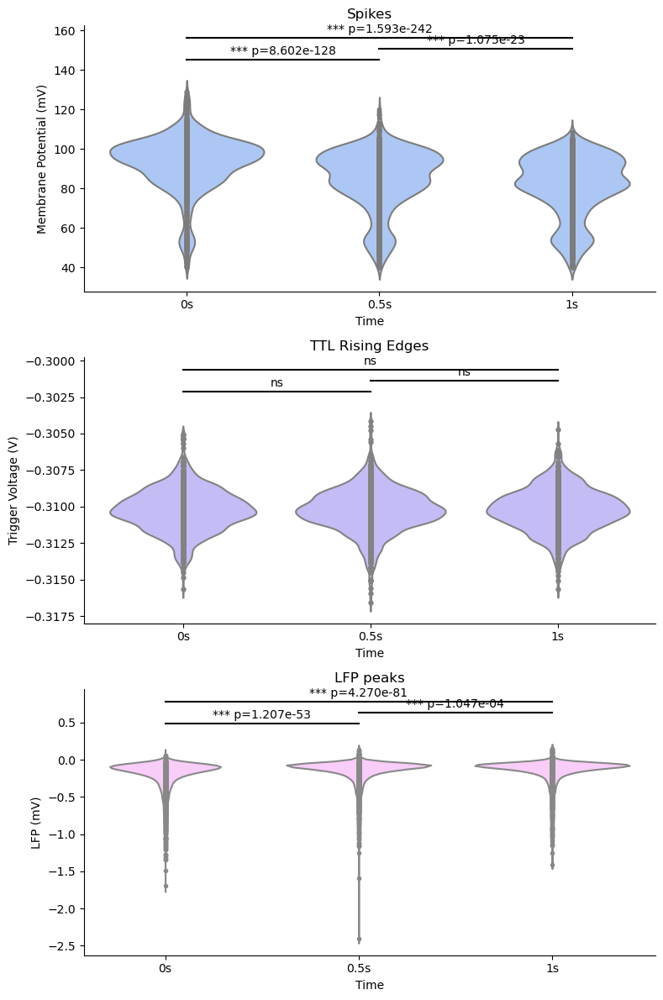

In [145]:
plot_pointplot_with_violinplot()

In [156]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu

def plot_pointplot_with_violinplot(filename="plot_data.pkl"):
    """
    Plots violin plots for spikes, minima, and TTL rising edges.
    Displays summary statistics and performs pairwise Mann-Whitney U tests.
    """
    # Load the data from the pickle file
    try:
        with open(filename, 'rb') as f:
            plot_data = pickle.load(f)
    except (FileNotFoundError, pickle.UnpicklingError) as e:
        print(f"Error loading file: {e}")
        return

    # Extract data from the pickle file
    ttl_rising_edge_points, spike_points, minima_points = [], [], []
    for data in plot_data:
        if all(k in data for k in ['ttl_trace', 'ttl_rising_edges', 'spikes', 'minimas']):
            ttl_trace = data['ttl_trace']
            ttl_rising_edges = data['ttl_rising_edges']
            spikes = data['spikes']
            minimas = data['minimas']
            ttl_rising_edge_points.extend([(edge, ttl_trace[edge]) for edge in ttl_rising_edges])
            spike_points.extend(spikes)
            minima_points.extend(minimas)

    # Define the time points
    time_points = ["0s", "0.5s", "1s"]

    def categorize_by_time(data_points):
        """Categorize data points into bins based on time."""
        categorized_data = {tp: [] for tp in time_points}
        if not data_points:
            return categorized_data
        
        x, y = zip(*data_points) if data_points else ([], [])
        unique_x = sorted(set(x))
        if not unique_x:
            return categorized_data
        
        # Categorize the points into the time bins
        for i, val in enumerate(x):
            if val < unique_x[len(unique_x) // 3]:
                categorized_data["0s"].append(y[i])
            elif val < unique_x[2 * len(unique_x) // 3]:
                categorized_data["0.5s"].append(y[i])
            else:
                categorized_data["1s"].append(y[i])
        return categorized_data

    def create_dataframe(categorized_data):
        """Create a pandas DataFrame from categorized data."""
        return pd.DataFrame([{"Time": tp, "Value": v} for tp, values in categorized_data.items() for v in values])

    def plot_from_dataframe(ax, df, time_points, color='lightblue'):
        """
        Creates a violin plot with summary statistics.
        """
        sns.violinplot(data=df, x='Time', y='Value', inner=None, color=color, alpha=0.6, ax=ax)

        # Calculate and plot median, 25th, and 75th percentiles
        stats = df.groupby('Time')['Value'].describe(percentiles=[0.25, 0.5, 0.75])
        for i, tp in enumerate(time_points):
            median = stats.loc[tp, '50%']
            q1 = stats.loc[tp, '25%']
            q3 = stats.loc[tp, '75%']
            # Plot median and quartiles as horizontal lines
            ax.plot([i - 0.2, i + 0.2], [median, median], color='black', lw=2)
            ax.plot([i - 0.2, i + 0.2], [q1, q1], color='grey', lw=1)
            ax.plot([i - 0.2, i + 0.2], [q3, q3], color='grey', lw=1)

    def run_stat_tests(df):
        """Perform Mann-Whitney U tests between different time points."""
        data_0s = df[df['Time'] == "0s"]['Value']
        data_05s = df[df['Time'] == "0.5s"]['Value']
        data_1s = df[df['Time'] == "1s"]['Value']

        def mannwhitney_safe(x, y):
            """Safe Mann-Whitney test handling small sample sizes."""
            if len(x) < 2 or len(y) < 2:
                return None
            return mannwhitneyu(x, y, alternative='two-sided').pvalue

        return (mannwhitney_safe(data_0s, data_05s),
                mannwhitney_safe(data_05s, data_1s),
                mannwhitney_safe(data_0s, data_1s))

    def add_annotations(ax, p_values):
        """
        Adds annotations for p-values with asterisks and the p-value number.
        """
        y_min, y_max = ax.get_ylim()
        y_range = y_max - y_min
        offsets = [y_max + 0.05 * y_range * (i + 1) for i in range(3)]
        comparisons = [(0, 1), (1, 2), (0, 2)]

        def format_p_value(p_val):
            """Format p-value with asterisks."""
            if p_val is None:
                return "ns"
            elif p_val < 0.001:
                return f"*** (p={p_val:.3e})"
            elif p_val < 0.01:
                return f"** (p={p_val:.3f})"
            elif p_val < 0.05:
                return f"* (p={p_val:.3f})"
            else:
                return f"ns (p={p_val:.3f})"

        for (x1, x2), offset, p_val in zip(comparisons, offsets, p_values):
            if p_val is not None:
                # Draw a horizontal line between the groups
                ax.plot([x1, x2], [offset] * 2, color='black', linewidth=1.5)
                # Display asterisks and p-value next to the line
                ax.text((x1 + x2) / 2, offset + 0.01 * y_range, format_p_value(p_val), 
                        ha='center', va='bottom', fontsize=10, color='black')

    # Prepare dataframes for plotting
    spike_df = create_dataframe(categorize_by_time(spike_points))
    ttl_df = create_dataframe(categorize_by_time(ttl_rising_edge_points))
    minima_df = create_dataframe(categorize_by_time(minima_points))

    # Create subplots and define pastel colors
    fig, axs = plt.subplots(3, 1, figsize=(8, 12))
    pastel_colors = ['#A0C4FF', '#BDB2FF', '#FFC6FF']
    y_labels = ["Membrane Potential (mV)", "Trigger Voltage (V)", "LFP (mV)"]

    # Generate violin plots with annotations
    for ax, df, title, color, ylabel in zip(
        axs, [spike_df, ttl_df, minima_df], 
        ["Spike amplitudes", "TTL Rising Edges", "LFP minimas"], 
        pastel_colors, y_labels
    ):
        plot_from_dataframe(ax, df, time_points, color)
        p_values = run_stat_tests(df)
        add_annotations(ax, p_values)
        ax.set_title(title)
        ax.set_ylabel(ylabel)
        ax.set_xticks(range(3))
        ax.set_xticklabels(time_points)
        ax.spines[['right', 'top']].set_visible(False)

    plt.tight_layout()
    plt.show()


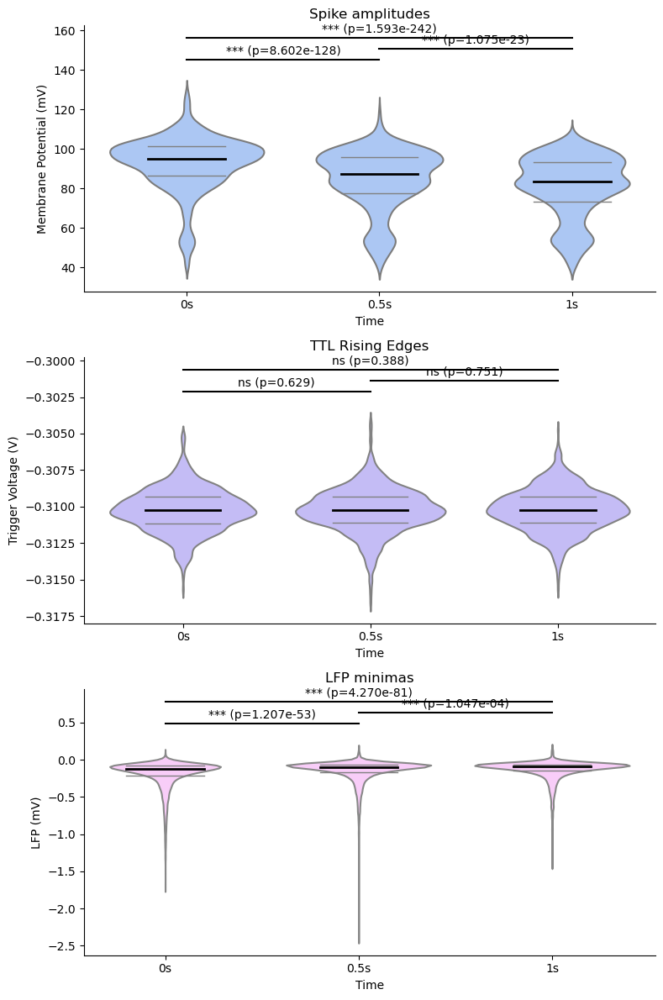

In [157]:
plot_pointplot_with_violinplot()

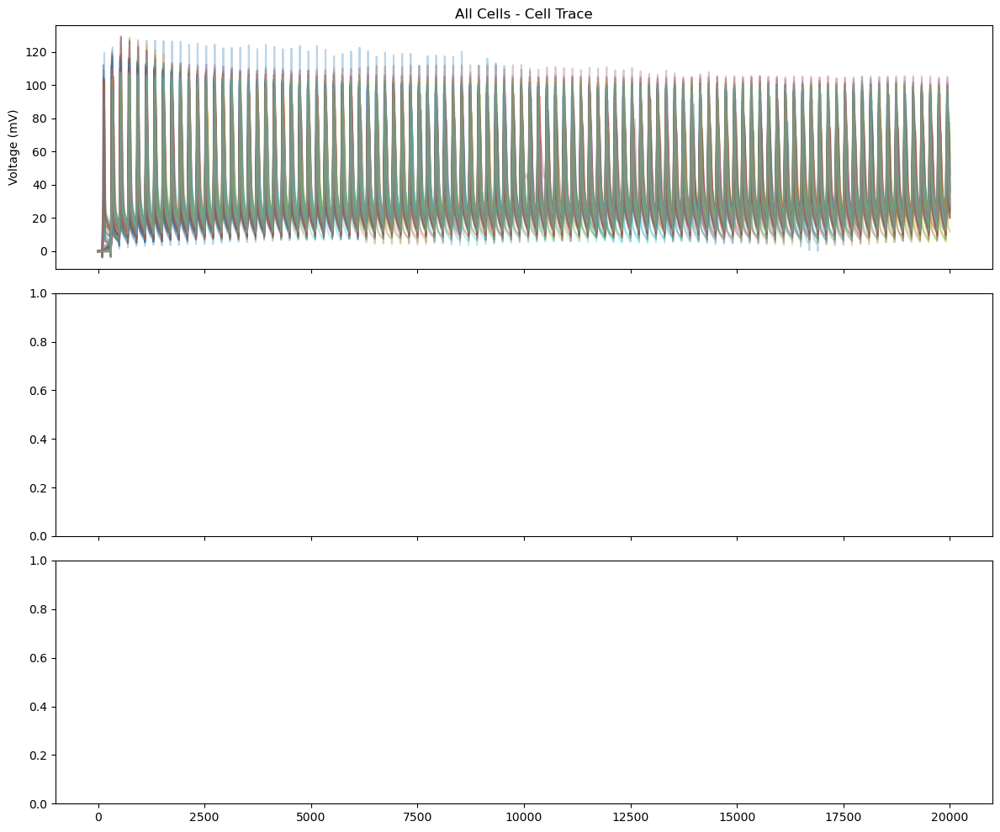

In [165]:
import pickle
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def plot_from_pickle(filename="plot_data.pkl", plot_limit=None, window_size=50):
    """
    Loads plot data from a pickle file and generates the plot, including spikes, minima, and envelopes.

    Parameters:
    filename (str): The name of the pickle file to load the data from.
    plot_limit (int or None): The number of points to plot. If None, plot the entire data.
    window_size (int): The size of the rolling window for smoothing the envelope.
    """
    try:
        with open(filename, 'rb') as f:
            plot_data = pickle.load(f)
    except FileNotFoundError:
        print(f"Error: File '{filename}' not found.")
        return
    except Exception as e:
        print(f"Error loading data: {e}")
        return

    fig, axs = plt.subplots(3, 1, figsize=(12, 10), sharex=True)

    # Set titles and labels
    axs[0].set_title("All Cells - Cell Trace")
    axs[0].set_ylabel("Voltage (mV)")

    # Data to collect for envelope calculation
    spike_x, spike_y = [], []
    minima_x, minima_y = [], []

    for data in plot_data:
        cell_ID = data['cell_ID']
        trial_no = data['trial_no']
        trace = data['cell_trace']
        field_trace = data['field_trace']
        ttl_trace = data['ttl_trace']
        ttl_rising_edges = data['ttl_rising_edges']
        spikes = data['spikes']
        minimas = data['minimas']

        trace_range = plot_limit if plot_limit is not None else len(trace)

        # Plot traces
        axs[0].plot(trace[:trace_range], alpha=0.3)
    plt.tight_layout()
    plt.show()
plot_from_pickle(filename="plot_data.pkl", plot_limit=None)

In [166]:
training_data = pd.read_pickle("/Users/anzalks/Documents/pattern_learning_paper/plotting_scripts/python_scripts_paper_ready/analysis_scripts/pickle_files_from_analysis/pd_training_data_all_cells_all_trials.pickle")

In [178]:
cell_1_t_data= training_data[training_data["cell_ID"]=="2022_12_12_cell_5"]

In [ ]:
train_dat = all_cell_data[all_cell_data["cell_ID"]=="2022_12_12_cell_5"]

In [213]:
all_cell_data[]

,cell_ID,frame_status,pre_post_status,frame_id,min_trace,max_trace,abs_area,pos_area,neg_area,onset_time,...,slope,intercept,min_trace_t,max_trace_t,max_field_t,min_field_t,mean_trace,mean_field,mean_ttl,mean_rmp
0,2022_12_12_cell_5,pattern,post_0,pattern_0,-1.606066,14.624199,2.608295e+08,1.809094e+08,7.992010e+07,0.006401,...,1873.829993,-12.448657,0.114961,0.016402,0.020202,0.002350,"[0.003227234, -0.0028762817, -0.01406606, -0.0...","[0.05591329, 0.05474345, 0.05184428, 0.0508270...","[0.018310547, 0.018615723, 0.016479492, 1.5722...",-63.685665
0,2022_12_12_cell_5,pattern,post_0,pattern_1,-1.493622,12.790639,2.288926e+08,1.538590e+08,7.503363e+07,0.006101,...,1690.234258,-10.807206,0.127613,0.016802,0.018652,0.001850,"[-0.033864338, -0.021657309, -0.021657309, -0....","[0.06871287, 0.06698354, 0.0611852, 0.06449127...","[0.018005371, 0.017089844, 0.018615723, 1.5701...",-63.685665
0,2022_12_12_cell_5,pattern,post_0,pattern_2,-1.310610,12.318540,2.207142e+08,1.594123e+08,6.130189e+07,0.006051,...,1129.029640,-6.959006,0.119512,0.017302,0.008701,0.002050,"[-0.0044581094, -0.011578877, -0.02378591, -0....","[0.023806253, 0.011497498, 0.0034103394, 0.004...","[0.01586914, 0.019226074, 0.018920898, 1.56982...",-63.685665
0,2022_12_12_cell_5,pattern,post_1,pattern_0,-1.811259,16.519632,3.583283e+08,2.627626e+08,9.556567e+07,0.006351,...,1511.863394,-9.909818,0.126113,0.021902,0.023202,0.002200,"[0.023864746, 0.023864746, 0.030985514, 0.0350...","[0.004623413, 0.0019785564, 0.009557088, 0.025...","[0.016479492, 0.01739502, 0.018310547, 1.57012...",-63.685665
0,2022_12_12_cell_5,pattern,post_1,pattern_1,-1.921661,15.976898,3.299951e+08,2.363046e+08,9.369051e+07,0.006601,...,1633.958821,-10.823195,0.133813,0.022802,0.022152,0.001850,"[-0.010243733, -0.007191976, 0.0070495605, 0.0...","[0.067988075, 0.06549581, 0.058476765, 0.06188...","[0.017089844, 0.018310547, 0.015563965, 1.5737...",-63.685665
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,2023_03_20_cell_3,point,pre,point_5,-0.031593,0.414981,6.834394e+06,6.826621e+06,7.773005e+03,0.011402,...,15.328750,-0.084394,0.002601,0.026505,0.119124,0.002801,"[0.037579853, 0.018252054, 0.017234802, 0.0548...","[0.017415365, 0.014770508, -0.011779785, 0.027...","[0.015563965, 0.01953125, 0.015563965, 1.57562...",-68.743271
0,2023_03_20_cell_3,point,pre,point_6,-0.040527,0.225993,6.527293e+06,6.510746e+06,1.654622e+04,0.011702,...,30.325890,-0.176392,0.002601,0.013103,0.022104,0.002400,"[0.004231771, 0.02355957, 0.021525064, 0.03983...","[0.010803223, 0.020365397, 0.005818685, 0.0318...","[0.01373291, 0.016784668, 0.01953125, 1.569213...",-68.743271
0,2023_03_20_cell_3,point,pre,point_7,-0.247538,0.201070,3.200970e+06,1.083237e+06,2.117733e+06,0.017203,...,14.321713,-0.097929,0.119324,0.017203,0.045609,0.002701,"[0.018981934, 0.019999186, 0.016947428, 0.0261...","[0.0010477701, 0.003692627, -0.002919515, 0.02...","[0.01739502, 0.014038086, 0.01586914, 1.570434...",-68.743271
0,2023_03_20_cell_3,point,pre,point_8,-0.167376,0.332095,4.001898e+06,1.876867e+06,2.125031e+06,0.012302,...,26.179065,-0.137921,0.160432,0.024905,0.277956,0.002801,"[-0.0046157837, -0.0076675415, -0.0015640259, ...","[0.017628988, -0.00861613, -0.005666097, 0.025...","[0.01586914, 0.01586914, 0.018005371, 1.571655...",-68.743271


In [215]:
cell_1_t_data= all_cell_data[all_cell_data["cell_ID"]=="2022_12_12_cell_5"]

In [214]:
all_cell_data = pd.read_pickle("/Users/anzalks/Documents/pattern_learning_paper/plotting_scripts/python_scripts_paper_ready/data/pickle_files/all_data_with_training_df.pickle")

In [185]:
np_tr_Dat = cell_1_t_data.to_numpy()

In [217]:
cell_1_t_data =cell_1_t_data[cell_1_t_data["pre_post_status"]=="training"]

In [218]:
cell_1_t_data

,cell_ID,pre_post_status,sampling_rate(Hz),frame_status,frame_id,trial_no,cell_trace(mV),field_trace(mV),pd_trace(V),ttl_trace(V),time(s)
17676000,2022_12_12_cell_5,training,20000.0,training,no_frame,0,-64.526367,0.034180,0.013123,0.016479,0.00000
17676001,2022_12_12_cell_5,training,20000.0,training,no_frame,0,-64.526367,0.034637,0.011902,0.017700,0.00005
17676002,2022_12_12_cell_5,training,20000.0,training,no_frame,0,-64.529419,0.028687,0.012207,0.017395,0.00010
17676003,2022_12_12_cell_5,training,20000.0,training,no_frame,0,-64.526367,0.011902,0.011292,0.017395,0.00015
17676004,2022_12_12_cell_5,training,20000.0,training,no_frame,0,-64.526367,0.004120,0.012207,0.018311,0.00020
...,...,...,...,...,...,...,...,...,...,...,...
17790995,2022_12_12_cell_5,training,20000.0,training,inR,4,-70.437622,0.036774,0.012207,0.016785,1.14980
17790996,2022_12_12_cell_5,training,20000.0,training,inR,4,-70.443726,0.042572,0.011292,0.018005,1.14985
17790997,2022_12_12_cell_5,training,20000.0,training,inR,4,-70.449829,0.039062,0.012207,0.017395,1.14990
17790998,2022_12_12_cell_5,training,20000.0,training,inR,4,-70.452881,0.039062,0.011902,0.016785,1.14995


(0.9, 1.1)

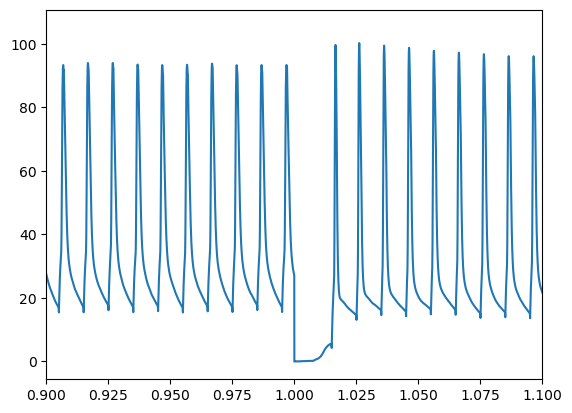

In [206]:
plt.plot(np.linspace(0,len(np_tr_Dat_tile)/20000,len(np_tr_Dat_tile)),np_tr_Dat_tile)
plt.xlim(0.9,1.1)

In [222]:
trn_array = cell_1_t_data["cell_trace(mV)"].to_numpy()

(1.057, 1.219)

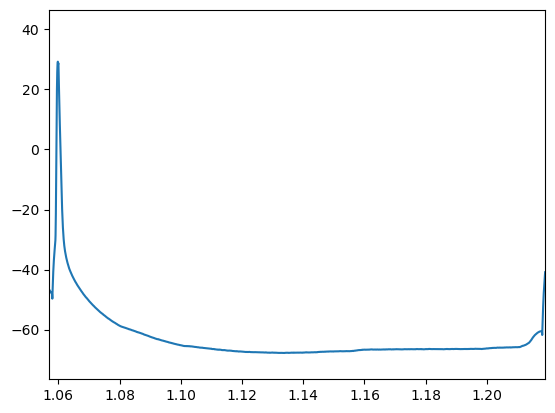

In [245]:
plt.plot(np.linspace(0,len(trn_array)/20000,len(trn_array)),trn_array)
plt.xlim(1.057,1.219)

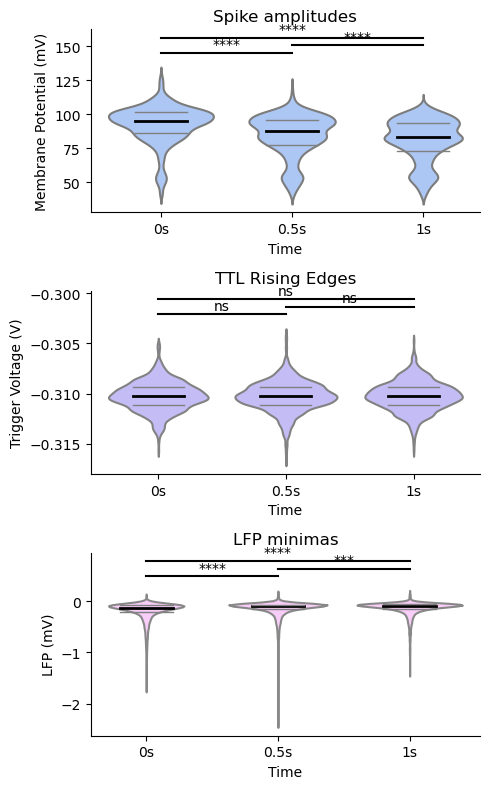

In [1]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu
import baisic_plot_fuctnions_and_features as bpf

def plot_pointplot_with_violinplot(filename="plot_data.pkl"):
    """
    Plots violin plots for spikes, minima, and TTL rising edges.
    Displays summary statistics and performs pairwise Mann-Whitney U tests.
    """
    # Load the data from the pickle file
    try:
        with open(filename, 'rb') as f:
            plot_data = pickle.load(f)
    except (FileNotFoundError, pickle.UnpicklingError) as e:
        print(f"Error loading file: {e}")
        return

    # Extract data from the pickle file
    ttl_rising_edge_points, spike_points, minima_points = [], [], []
    for data in plot_data:
        if all(k in data for k in ['ttl_trace', 'ttl_rising_edges', 'spikes', 'minimas']):
            ttl_trace = data['ttl_trace']
            ttl_rising_edges = data['ttl_rising_edges']
            spikes = data['spikes']
            minimas = data['minimas']
            ttl_rising_edge_points.extend([(edge, ttl_trace[edge]) for edge in ttl_rising_edges])
            spike_points.extend(spikes)
            minima_points.extend(minimas)

    # Define the time points
    time_points = ["0s", "0.5s", "1s"]

    def categorize_by_time(data_points):
        """Categorize data points into bins based on time."""
        categorized_data = {tp: [] for tp in time_points}
        if not data_points:
            return categorized_data
        
        x, y = zip(*data_points) if data_points else ([], [])
        unique_x = sorted(set(x))
        if not unique_x:
            return categorized_data
        
        # Categorize the points into the time bins
        for i, val in enumerate(x):
            if val < unique_x[len(unique_x) // 3]:
                categorized_data["0s"].append(y[i])
            elif val < unique_x[2 * len(unique_x) // 3]:
                categorized_data["0.5s"].append(y[i])
            else:
                categorized_data["1s"].append(y[i])
        return categorized_data

    def create_dataframe(categorized_data):
        """Create a pandas DataFrame from categorized data."""
        return pd.DataFrame([{"Time": tp, "Value": v} for tp, values in categorized_data.items() for v in values])

    def plot_from_dataframe(ax, df, time_points, color='lightblue'):
        """
        Creates a violin plot with summary statistics.
        """
        sns.violinplot(data=df, x='Time', y='Value', inner=None, color=color, alpha=0.6, ax=ax)

        # Calculate and plot median, 25th, and 75th percentiles
        stats = df.groupby('Time')['Value'].describe(percentiles=[0.25, 0.5, 0.75])
        for i, tp in enumerate(time_points):
            median = stats.loc[tp, '50%']
            q1 = stats.loc[tp, '25%']
            q3 = stats.loc[tp, '75%']
            # Plot median and quartiles as horizontal lines
            ax.plot([i - 0.2, i + 0.2], [median, median], color='black', lw=2)
            ax.plot([i - 0.2, i + 0.2], [q1, q1], color='grey', lw=1)
            ax.plot([i - 0.2, i + 0.2], [q3, q3], color='grey', lw=1)

    def run_stat_tests(df):
        """Perform Mann-Whitney U tests between different time points."""
        data_0s = df[df['Time'] == "0s"]['Value']
        data_05s = df[df['Time'] == "0.5s"]['Value']
        data_1s = df[df['Time'] == "1s"]['Value']

        def mannwhitney_safe(x, y):
            """Safe Mann-Whitney test handling small sample sizes."""
            if len(x) < 2 or len(y) < 2:
                return None
            return mannwhitneyu(x, y, alternative='two-sided').pvalue

        return (mannwhitney_safe(data_0s, data_05s),
                mannwhitney_safe(data_05s, data_1s),
                mannwhitney_safe(data_0s, data_1s))

    def add_annotations(ax, p_values):
        """
        Adds annotations for p-values with asterisks and the p-value number.
        """
        y_min, y_max = ax.get_ylim()
        y_range = y_max - y_min
        offsets = [y_max + 0.05 * y_range * (i + 1) for i in range(3)]
        comparisons = [(0, 1), (1, 2), (0, 2)]

        def format_p_value(p_val):
            """Format p-value with asterisks."""
            if p_val is None:
                return "ns"
            elif p_val < 0.001:
                return f"***"
            elif p_val < 0.01:
                return f"**"
            elif p_val < 0.05:
                return f"*"
            else:
                return f"ns"

        for (x1, x2), offset, p_val in zip(comparisons, offsets, p_values):
            if p_val is not None:
                # Draw a horizontal line between the groups
                ax.plot([x1, x2], [offset] * 2, color='black', linewidth=1.5)
                # Display asterisks and p-value next to the line
                ax.text((x1 + x2) / 2, offset + 0.01 * y_range, bpf.convert_pvalue_to_asterisks(p_val), 
                        ha='center', va='bottom', fontsize=10, color='black')

    # Prepare dataframes for plotting
    spike_df = create_dataframe(categorize_by_time(spike_points))
    ttl_df = create_dataframe(categorize_by_time(ttl_rising_edge_points))
    minima_df = create_dataframe(categorize_by_time(minima_points))

    # Create subplots and define pastel colors
    fig, axs = plt.subplots(3, 1, figsize=(5, 8))
    pastel_colors = ['#A0C4FF', '#BDB2FF', '#FFC6FF']
    y_labels = ["Membrane Potential (mV)", "Trigger Voltage (V)", "LFP (mV)"]

    # Generate violin plots with annotations
    for ax, df, title, color, ylabel in zip(
        axs, [spike_df, ttl_df, minima_df], 
        ["Spike amplitudes", "TTL Rising Edges", "LFP minimas"], 
        pastel_colors, y_labels
    ):
        plot_from_dataframe(ax, df, time_points, color)
        p_values = run_stat_tests(df)
        add_annotations(ax, p_values)
        ax.set_title(title)
        ax.set_ylabel(ylabel)
        ax.set_xticks(range(3))
        ax.set_xticklabels(time_points)
        ax.spines[['right', 'top']].set_visible(False)

    plt.tight_layout()
    plt.show()
plot_pointplot_with_violinplot()